# Introduction

Putative Creode or p-Creode is an algorithm developed to map transitions between states. Particularly, p-Creode was developed to map multi-branched cellular differentiation pathways using single cell data. This notebook will give an overview of applying p-Creode to a single cell RNA-seq data set produced by [Paul et al., 2015](http://www.sciencedirect.com/science/article/pii/S0092867415014932).

Before getting started, if you are not familar with juypter notebooks, some basic information can be found [here](http://nbviewer.jupyter.org/github/jupyter/notebook/blob/master/docs/source/examples/Notebook/Notebook%20Basics.ipynb) This notebook is designed to walk you through a common p-Creode application, so each notebook cell with python code in it should be excuted as you procede. Notebook cells can be executed by simply pressing shift+enter. Please report any issues or bugs you come across to the p-Creode github page. 

# Importing python modules and loading data

Before a python module or package can be accessed it has to be imported. Here the p-Creode package along with other common python packages for handling data sets and plotting are imported. All of these packages should have been installed when pcreode was installed. If any of the packages are not installed, pip install package should remedy the situation (for example: “pip install numpy” or if administrative privileges are needed for linux users “sudo pip install numpy”).

In [1]:
# imports the pcreode package
import pcreode
# matplotlib is a commonly used package for plotting
import matplotlib.pyplot as plt
# pandas is a package used for making the handling of large data sets easier 
import pandas as pd
# numpy is very common package for handling arrays and matrices
import numpy as np
# this line tells matplotlib to plot results inline with the current jupyter notebook
%matplotlib inline

p-Creode works on single-cell datasets that have been feature-selected.  For mass cytometry and multiplex imaging, which are candidate-based approaches, this step has been done implicity by selecting the candidate markers to measure. For these cases, one only has to normalize the data accordingly.  For scRNA-seq data, feature selection has to be done to eliminate genes whose expression patterns are random (considered as noise). There are multiple ways to do this automatically. We use the neighborhood variance ratio (NVR) approach. For a tutorial where we process raw count data into normalized feature-selected data, please visit: https://github.com/KenLauLab/pCreode/.

The processed dataset that is ready for p-Creode analysis from Paul et al., 2015 can be downloaded from [here](https://github.com/KenLauLab/pCreode/blob/master/data/Myeloid_with_IDs.csv). To download simply right click the download button and select "Save link as...". The provided dataset was already modified using the standard scRNA-seq processing workflow: 

After sequencing, reads were filtered, sorted by their barcode of origin and aligned to the reference transcriptome using inDrops pipeline (https://github.com/indrops/indrops). Mapped reads were quantified into UMI-filtered counts per gene, and barcodes that correspond to cells were retrieved based on previously established methods (Klein et al., 2015).

1.       After standard processing to a cell-by-gene matrix, do t-SNE. You should be able to select cells that appear continuous and not as obvious “island” clusters on the map. In this dataset, all data points were included since they all belong to a common trajectory.
2.       Eliminate dead cells by high mitochondrial gene counts. Again, these should cluster. In this dataset, no cells were filtered out using this criteria.
3.       Remove genes that only have maximum of 1 count per cell and also all mitochondrial genes. This would get you to about ~15000 total genes remaining.
4.       Normalize transcript count as fraction per cell over all genes.
5.       Variance normalize (log, Arcsinh, etc.). We did an Arcsinh transform with a cofactor of 5.0.
6.       Use a select gene procedure to eliminate noisy genes.  We use the NVR approach introduced in SLICER (Welch et al., 2016). This should reduce your gene set to <1000 genes.

Please, change the file path below to the location of the file on your system. Tab key can be used to auto complete the directories and the file to insure you have the correct path. If the path is incorrect it will not fail until the read command is given. 

p-Creode assumes the data format as a matrix with cells represented as the rows and genes as the columns. Below (data_raw.head() output) is an example of the expected format.  

In [2]:
rawDataFile = "F:/Computational/Comp02_PsedutimeAnalysisForArshadPaper/Crypts.csv"
SSC2a = list(['Stmn1','Hells','Tuba1b','Rrm2'])
SSC2c = list(['Clu','Anxa1','Basp1','Cxadr'])
CBC = list(['Lgr5','Axin2','Ascl2'])
genesUsedForTrajectoryFormation = SSC2a+SSC2c+CBC
print genesUsedForTrajectoryFormation

['Stmn1', 'Hells', 'Tuba1b', 'Rrm2', 'Clu', 'Anxa1', 'Basp1', 'Cxadr', 'Lgr5', 'Axin2', 'Ascl2']


The pandas (pd) read_csv function is used to read in our file. If the file path above is incorrect you will see the fail here. 

In [3]:
fullData = pd.read_csv(rawDataFile, index_col=0)
fullData = fullData.transpose()
print fullData.head()

                                Mrpl15    Lypla1  Gm37988     Tcea1   Atp6v1h  \
C05_Indepth_AAACCTGAGGCCCTCA  0.832381  0.832381      0.0  0.500407  0.000000   
C05_Indepth_AAACCTGCACTCAGGC  1.504443  1.423465      0.0  0.300226  0.300226   
C05_Indepth_AAACCTGGTCATCCCT  1.239878  0.597956      0.0  0.800923  0.000000   
C05_Indepth_AAACCTGGTTACAGAA  0.000000  1.516625      0.0  0.847501  0.636156   
C05_Indepth_AAACGGGAGAAGAAGC  0.753111  1.337364      0.0  0.000000  0.000000   

                                Rb1cc1  4732440D04Rik  St18    Pcmtd1  \
C05_Indepth_AAACCTGAGGCCCTCA  0.500407            0.0   0.0  0.000000   
C05_Indepth_AAACCTGCACTCAGGC  0.000000            0.0   0.0  0.000000   
C05_Indepth_AAACCTGGTCATCCCT  0.597956            0.0   0.0  0.000000   
C05_Indepth_AAACCTGGTTACAGAA  0.367834            0.0   0.0  0.000000   
C05_Indepth_AAACGGGAGAAGAAGC  0.445838            0.0   0.0  0.445838   

                              Gm26901     ...      4930526L06Rik  Ms4a5  \

It is always a good idea to check the formating of the file being read in. Using the pd.head() function we can look at the first 5 rows in the file. A common error when reading in a file is pandas using the wrong row as the header for the protein or gene names.

In [4]:
data_raw = fullData[genesUsedForTrajectoryFormation]
#del fullData
data_raw.head()

,Stmn1,Hells,Tuba1b,Rrm2,Clu,Anxa1,Basp1,Cxadr,Lgr5,Axin2,Ascl2
C05_Indepth_AAACCTGAGGCCCTCA,0.832381,1.081188,2.540741,0.0,0.0,0.0,0.0,0.500407,0.0,0.832381,1.280259
C05_Indepth_AAACCTGCACTCAGGC,1.011900,0.000000,0.875743,0.0,0.0,0.0,0.0,0.718081,0.0,0.000000,0.300226
C05_Indepth_AAACCTGGTCATCCCT,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.597956,0.0,0.000000,0.343021
C05_Indepth_AAACCTGGTTACAGAA,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.367834,0.0,0.000000,0.000000
C05_Indepth_AAACGGGAGAAGAAGC,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.753111,0.0,0.000000,0.000000


# Data Preprocessing

To remove excessive noise associated with single cell data sets we recommend preprocessing the data prior to applying p-Creode. If your data has already been preprocessed (ie. PCA or diffusion maps) to your satisfaction you can skip ahead to the Density section. Here, we will be processing the data using principal component analysis (PCA). 

To start, read data to be analyzed into pcreode's PCA class, this class is a convenient way to apply PCA. Input to pcreode.PCA must be in the format of a pandas DataFrame. Now, all of the functions under the PCA class can be accessed through the data_pca call.

In [5]:
data_pca = pcreode.PCA( data_raw)

Once initialized, PCA can be performed by simply calling get_pca(). This call will perform the PCA but will not return anything. We can access the results through calls to the PCA class.

In [6]:
data_pca.get_pca()

We can now plot the explained variance for each principal component. The variable xlim can be used to set the x-axis range for the plot.

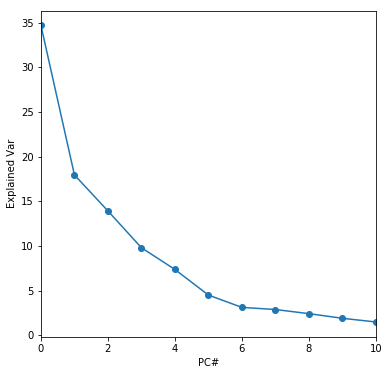

In [7]:
data_pca.pca_plot_explained_var( xlim=(0,10))

The number of PCs can be set using the pca_set_components function. This function will return the reduced data set for the number of components selected. The number of PCs are chosen such that noise is removed and without the loss of too much definition in the data distributions. A common way of doing this is to look for an elbow in the explained variance plot above (which is not always very evident, like in the one above). An alternative method is to plot the data in PC space and only keep the number of PCs that provide  structure/shape in the data cloud (unstructured data would appear as a sphere of data points – keeping additional PCs will add to noise).

In [8]:
pca_test_data = data_pca.pca_set_components(5)

(Text(0.5,0,u'PC5'), Text(0,0.5,u'PC4'))

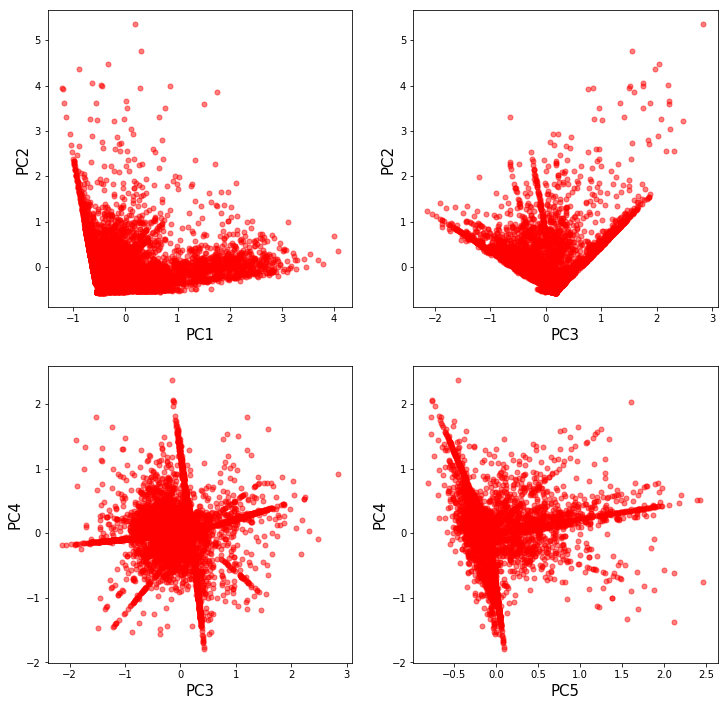

In [9]:
fig = plt.figure( figsize=(12,12))
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)
ax4 = fig.add_subplot(224)
cc = 'r'
ax1.scatter( pca_test_data[:,0], pca_test_data[:,1], alpha=0.5, s=25, c=cc)
ax2.scatter( pca_test_data[:,2], pca_test_data[:,1], alpha=0.5, s=25, c=cc)
ax3.scatter( pca_test_data[:,2], pca_test_data[:,3], alpha=0.5, s=25, c=cc)
ax4.scatter( pca_test_data[:,4], pca_test_data[:,3], alpha=0.5, s=25, c=cc)

ax1.set_xlabel("PC1", fontsize=15), ax1.set_ylabel("PC2", fontsize=15)
ax2.set_xlabel("PC3", fontsize=15), ax2.set_ylabel("PC2", fontsize=15)
ax3.set_xlabel("PC3", fontsize=15), ax3.set_ylabel("PC4", fontsize=15)
ax4.set_xlabel("PC5", fontsize=15), ax4.set_ylabel("PC4", fontsize=15)

Judging from the plots above, there is little to no gain in structure of the data distribution beyond the PC3, evident by the lack of definition in plots containing PC4 and above. Therefore, there is likely little gain in using more than 3 principal components.

In [11]:
pca_reduced_data = data_pca.pca_set_components(3)

# Density Calculation

Now that the preprocessing has been performed, the density of each data point can be calculated. This process is started by calling the pcreode.Density class using the PCA processed data. The format of the data set for the Density class should be a numpy array. 

In [12]:
dens = pcreode.Density( pca_reduced_data)

To calculate the densities of the data points, the radius of inclusion must first be established. For each data point the density will be set by counting the number of other data points contained within the radius, where the radius is centered on the data point in question. Setting the radius is a very important step. The radius should not be so large that the range of densities is limited and not so small that noisy data points have the same density as non noisy data points. A good starting radius is can be generated by comparing the distance to the nearest neighbor for all data points. The nearest_neighbor_hist() function will return a hist of all nearest neighbors distances and a best guess for the radius.

best guess starting radius = 0.841823171151


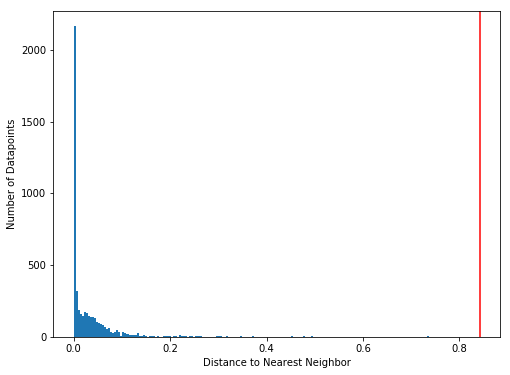

In [13]:
best_guess = dens.nearest_neighbor_hist( )

While the best_guess from above is generally a good fit, this will not always the case. Therefore, we will show how to manually set the radius value. To demonstrate this, we begin with a radius of ~0.4. We can calculate the density and plot a histogram of the values with the get_density() function. 

Note: With larger data sets this will take some time to calculate, so with a larger data set we recommend saving the density array so that the densities don't have to be recalculated. If the data set changes in anyway (different preprocessing routine, add/remove PCs, use a different arcsinh cofactor, etc) the density will need to be recalculated.

calculating densities for datapoints: 0 -> 4999
calculating densities for datapoints: 5000 -> 6643
****Always check density overlay for radius fit****


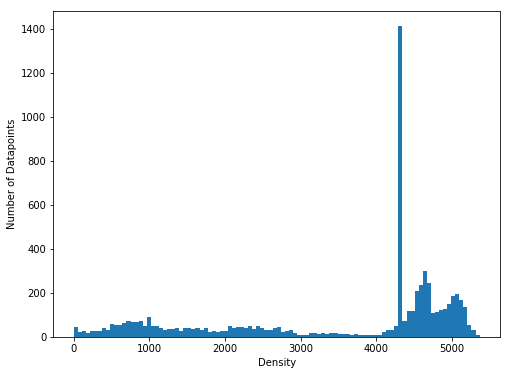

In [14]:
density_4 = dens.get_density( radius=1.32526407408)
dens.density_hist( n_bins=100)

Looking at the results for radius=0.4 the histogram shows that there are a large number of data points with a density of zero. This likely means that it will be hard to discriminate noisy data points from potentially rare cell types during down-sampling. In addition to the histogram of densities, one of the best ways to check radius fit is to look at the density values overlaid onto the PCA plots.

(Text(0.5,0,u'PC1'), Text(0,0.5,u'PC2'))

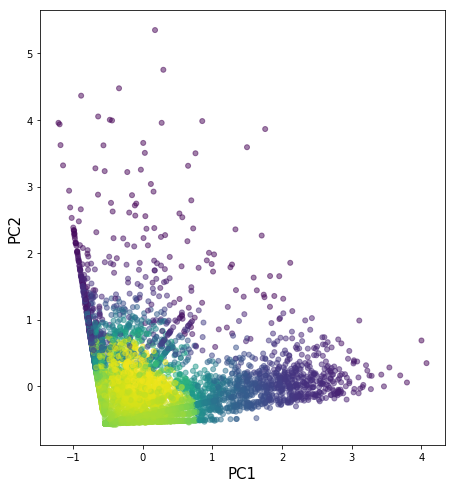

In [15]:
fig = plt.figure( figsize=(16,8))
ax1 = fig.add_subplot(121)
#ax2 = fig.add_subplot(122)
cc = density_4
ax1.scatter( pca_reduced_data[:,0], pca_reduced_data[:,1], alpha=0.5, s=25, c=cc)
#ax2.scatter( pca_reduced_data[:,2], pca_reduced_data[:,1], alpha=0.5, s=25, c=cc)
ax1.set_xlabel("PC1", fontsize=15), ax1.set_ylabel("PC2", fontsize=15)
#ax2.set_xlabel("PC3", fontsize=15), ax2.set_ylabel("PC2", fontsize=15)

Radius at 0.4 appears to be too small of a radius, as density (yellow) is not observed in all areas of relevant data space. We now focus on increasing the size of the radius to see when we start to lose resolution.

calculating densities for datapoints: 0 -> 4999
calculating densities for datapoints: 5000 -> 6643
****Always check density overlay for radius fit****


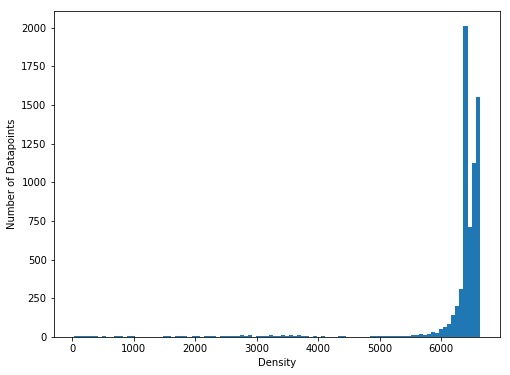

In [16]:
density_3 = dens.get_density( radius=3.0)
dens.density_hist( n_bins=100)

(Text(0.5,0,u'PC1'), Text(0,0.5,u'PC2'))

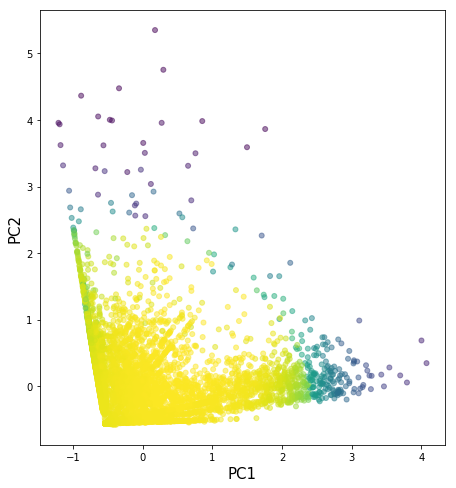

In [17]:
fig = plt.figure( figsize=(16,8))
ax1 = fig.add_subplot(121)
#ax2 = fig.add_subplot(122)
cc = density_3
ax1.scatter( pca_reduced_data[:,0], pca_reduced_data[:,1], alpha=0.5, s=25, c=cc)
#ax2.scatter( pca_reduced_data[:,2], pca_reduced_data[:,1], alpha=0.5, s=25, c=cc)
ax1.set_xlabel("PC1", fontsize=15), ax1.set_ylabel("PC2", fontsize=15)
#ax2.set_xlabel("PC3", fontsize=15), ax2.set_ylabel("PC2", fontsize=15)

At radius=3.0 the range of densities has increased as evident by the x-axis range of the histogram, but the PCA overlay shows that the majority of data points with large densities are located more centrally, likely meaning the increase in range of densities is due the location of the data point globally and therefore less informative on its local density. Since 0.4 is too small and 3.0 is too large, the density we are looking for is somewhere in between the two.

calculating densities for datapoints: 0 -> 4999
calculating densities for datapoints: 5000 -> 6643
****Always check density overlay for radius fit****


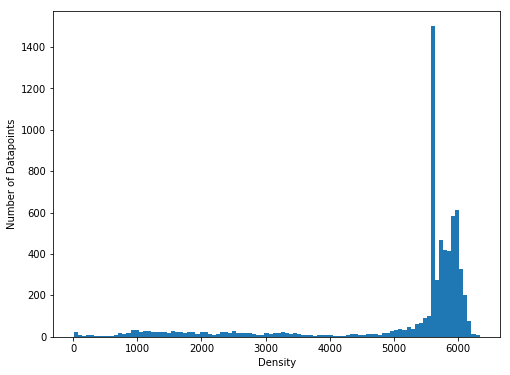

In [18]:
density_1 = dens.get_density( radius=2.0)
dens.density_hist( n_bins=100)

(Text(0.5,0,u'PC1'), Text(0,0.5,u'PC2'))

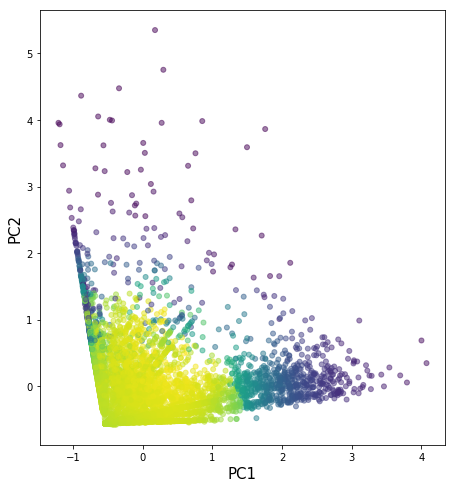

In [19]:
fig = plt.figure( figsize=(16,8))
ax1 = fig.add_subplot(121)
#ax2 = fig.add_subplot(122)
cc = density_1
ax1.scatter( pca_reduced_data[:,0], pca_reduced_data[:,1], alpha=0.5, s=25, c=cc)
#ax2.scatter( pca_reduced_data[:,2], pca_reduced_data[:,1], alpha=0.5, s=25, c=cc)
ax1.set_xlabel("PC1", fontsize=15), ax1.set_ylabel("PC2", fontsize=15)
#ax2.set_xlabel("PC3", fontsize=15), ax2.set_ylabel("PC2", fontsize=15)

At radius equal to 1.0 (very close to our best_guess at ~0.8), there is a good distribution of densities and with the PCA density overlay we can see local density in all areas of relevant data space (red/yellow distributed locally in cell populations, and not radially from the center). Being able to see different populations of cell types is a good indication that the radius size is set correctly.

If you are unsure about the radius setting, we advise you to run the full p-Creode algorithm over a range of radius values. It has been our experience that the radius fit value does not have to be set very exactly, and p-Creode tends to produce similar results over a range of values. 

Now the radius is set (radius=1.0) the noise and target density parameters used for down-sampling the data can be set. The noise variable controls which data points will be removed and the target density is the desired density of output. The target density can be used to control the computational overhead by limiting the number of cells in the downsampled data set. The largest dataset we could run was ~14000 cells on my current machine (See Specs in Methods).

# Setting down-sampling parameters

In [20]:
noise = 0
target = 100

In [21]:
downed, downed_ind = pcreode.Down_Sample( pca_reduced_data, density_1, noise, target)

Number of data points in downsample = 6644


The best way to set the noise and target variables is by looking at the downsampled PCA. The noise variable should be raised until there are no longer any outlier data points visible. These variables represent the percentile of all densities. For instance, data points with densities in the lowest 8th percentile will not be included in the down sampled data set. Feel free to play around with these parameters to better understand their effects on the down-sampling routine. The target variable is used to cut down on high abundance cells in order to have a data cloud with relatively uniform distribution. A good rule of thumb is to set the target density until you have roughly 50% of the orginal data points in your downsampled dataset (in this instance, you started off with ~4500 and end up with ~2700). 

(Text(0.5,0,u'PC3'), Text(0,0.5,u'PC2'))

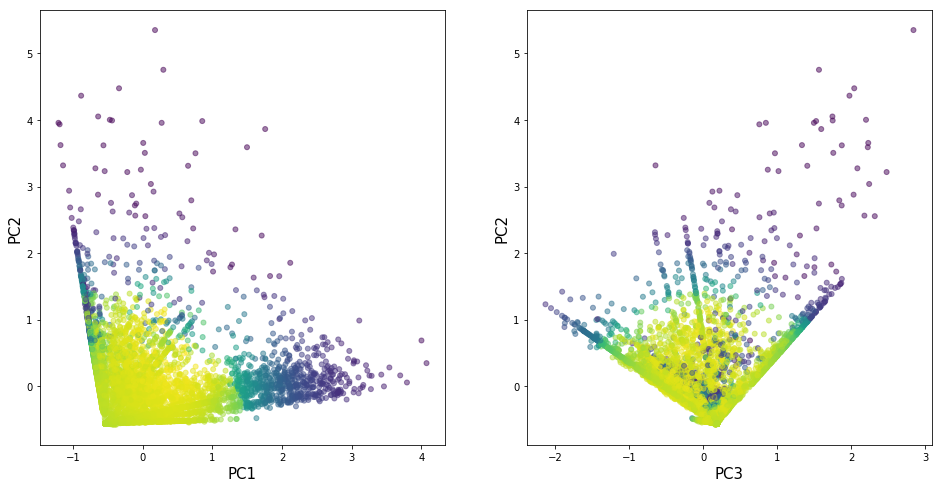

In [22]:
fig = plt.figure( figsize=(16,8))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
cc = density_1[downed_ind]
ax1.scatter( downed[:,0], downed[:,1], alpha=0.5, s=25, c=cc)
ax2.scatter( downed[:,2], downed[:,1], alpha=0.5, s=25, c=cc)
ax1.set_xlabel("PC1", fontsize=15), ax1.set_ylabel("PC2", fontsize=15)
ax2.set_xlabel("PC3", fontsize=15), ax2.set_ylabel("PC2", fontsize=15)

While setting the down-sampling parameters, it is always a good idea to compare the downsampled data set with the original.

(Text(0.5,0,u'PC1'), Text(0,0.5,u'PC2'))

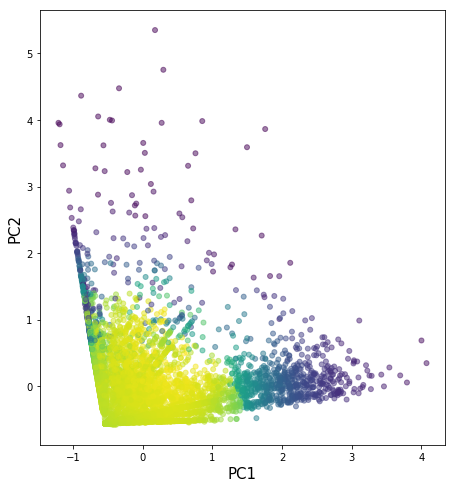

In [23]:
fig = plt.figure( figsize=(16,8))
ax1 = fig.add_subplot(121)
#ax2 = fig.add_subplot(122)
cc = density_1
ax1.scatter( pca_reduced_data[:,0], pca_reduced_data[:,1], alpha=0.5, s=25, c=cc)
#ax2.scatter( pca_reduced_data[:,2], pca_reduced_data[:,1], alpha=0.5, s=25, c=cc)
ax1.set_xlabel("PC1", fontsize=15), ax1.set_ylabel("PC2", fontsize=15)
#ax2.set_xlabel("PC3", fontsize=15), ax2.set_ylabel("PC2", fontsize=15)

With the noise values at 8.0, we can see that almost all of the outliers have been removed in the down-sampled data set as compared to the original. Since there is a fine line between what is viewed as noise and what is viewed as a rare cell type, of the two parameters the noise value is the most critical. In this data set the target value is not critical given the already small of size of the original set, so we have set it 50.0 to better normalize the down-sampled density. With larger data sets, the target values should be lowered so that the computational cost is lowered to a manageable level. This level will vary computer to computer.

# Obtaining p-Creode graphs

Now that all the parameters have been set we can run the main p-Creode algorithm and produce a series of graphs. We suggest you run at least 100, but we will only run 10 here. A directory should be created to hold the graph outputs and the path to your new directory should be updated for the pCreode function call. (Again, change the directory to your settings here) PC users will have to use Windows directory formatting, do not omit the backslash "/" at the end.

In [24]:
file_path = "F:/Computational/Comp02_PsedutimeAnalysisForArshadPaper/pcreode_Supervised_MergedAnalysis_FirstThreeComponents/"

In [25]:
out_graph, out_ids = pcreode.pCreode( data=pca_reduced_data, density=density_1, noise=noise, 
                                      target=target, file_path=file_path, num_runs=10)

Performing 10 independent runs, may take some time
Number of data points in downsample = 6644
Constructing density kNN
finding endstates
Number of endstates found -> 6
hierarchical placing
consensus aligning
saving files for run_num 1
Number of data points in downsample = 6644
Constructing density kNN
finding endstates
Number of endstates found -> 6
hierarchical placing
consensus aligning
saving files for run_num 2
Number of data points in downsample = 6644
Constructing density kNN
finding endstates
Number of endstates found -> 6
hierarchical placing
consensus aligning
saving files for run_num 3
Number of data points in downsample = 6644
Constructing density kNN
finding endstates
Number of endstates found -> 6
hierarchical placing
consensus aligning
saving files for run_num 4
Number of data points in downsample = 6644
Constructing density kNN
finding endstates
Number of endstates found -> 6
hierarchical placing
consensus aligning
saving files for run_num 5
Number of data points in down

# p-Creode graph scoring

Finally we can score the graph outputs to find the most representative graph. The file path should be the same as above and the number of graphs (num_graphs) should be set to 10 or the number you want to score if you ran more or less than 10 graphs above. The data variable should be set to the same data set used in the pCreode function. The final output will be a ranking of graph IDs from first to worst based how respresentative p-Creode thinks they are of the data. 

In [26]:
graph_ranks = pcreode.pCreode_Scoring( data=pca_reduced_data, file_path=file_path, num_graphs=10)

scoring graph 1
scoring graph 2
scoring graph 3
scoring graph 4
scoring graph 5
scoring graph 6
scoring graph 7
scoring graph 8
scoring graph 9
Most representative graph IDs from first to worst [2 1 9 5 4 8 6 7 3 0]


# Graph plotting

Looking at the ranked graphs above (results will differ with each) we can select the best graph from the run, in my case the graph ID was graph 8. Plotting the graphs can be a little frustrating given igraph's plot function (We are currently working on better plotting function). The the plotting function will produce a random graph visualization with each plot unless we seed the random number generator (the representation will be different but the graph will not change). We can seed the generator with the seed variable within the plot_save_graph function. It will sometimes take a few tries to get a graph that is easy to read (more tries are generally needed with graphs containing more nodes). [Here](https://github.com/KenLauLab/pCreode/blob/master/notebooks/Elane.png) is an example of what your output graph should look like. See paper for explanation of results. 

In [27]:
gid = graph_ranks[0] # this will select the first graph ID in the ranking from above
print gid

2


To start analyzing the outputs from pcreode, we begin by initializing the Analysis class from pcreode. The gid is the graph run you are interested in viewing, in this sepecific case it is the most representive graph. The file_path, data, and denstiy arguments should be the same as was used to produce the graph. 

In [28]:
analysis = pcreode.Analysis( file_path=file_path, graph_id=gid, data=pca_reduced_data, density=density_1, noise=noise)

In [29]:
proliferationMarkers = list(['Mcm6','Pcna','Mki67','Cdk4','Mcm5'])
TuftCellMarkers = list(['Dclk1','Trpm5'])
ECMarkers = list(['Aoc1','Arg2','Ccl25','Fabp1','Alpi','Apoa1','Apoa4'])
EEMarkers = list(['Tph1','Chga','Chgb','Tac1','Scg3','Sct','Pax6'])
GobletCellMarkers = list(['Arg2','Muc2','Tff3'])
ImmuneCellMarkers = list(['Cd3e','Cd3g','Ptprc'])
PanethCellMarkers = list(['Lyz1','Defa17','Defa22','Defa24','Ang4'])


listOfMarkersToVisualize = genesUsedForTrajectoryFormation + proliferationMarkers + TuftCellMarkers + ECMarkers + EEMarkers + GobletCellMarkers + ImmuneCellMarkers + PanethCellMarkers

#print listOfMarkersToVisualize

maxValues = fullData.max()

print maxValues[listOfMarkersToVisualize]

Stmn1     3.442738
Hells     2.238568
Tuba1b    3.615688
Rrm2      2.341130
Clu       5.781821
Anxa1     4.230487
Basp1     3.509264
Cxadr     3.092762
Lgr5      2.825716
Axin2     2.619637
Ascl2     2.218117
Mcm6      2.675710
Pcna      2.732275
Mki67     2.877464
Cdk4      2.614929
Mcm5      2.221251
Dclk1     3.385972
Trpm5     3.444649
Aoc1      3.220413
Arg2      2.943114
Ccl25     3.680966
Fabp1     6.330218
Alpi      3.553736
Apoa1     6.771912
Apoa4     7.126682
Tph1      4.349011
Chga      5.548943
Chgb      6.346329
Tac1      5.420439
Scg3      2.281090
Sct       7.686286
Pax6      2.815324
Arg2      2.943114
Muc2      6.774087
Tff3      7.941360
Cd3e      3.605949
Cd3g      4.532654
Ptprc     3.106590
Lyz1      7.249647
Defa17    5.830736
Defa22    6.838606
Defa24    8.150742
Ang4      5.725996
dtype: float64


To view the graph plots with different overlays the plot_save_graph function from the Analysis class is used. The seed variable will likely have to be sampled at different values. The overlay variable should be the analyte you are interested in visualizing on the graph. This argument comes from the orignal data set if preprocessing (PCA, etc) was used to prior to building the graphs. The file_out is the name of the .png file you would like to output into the file_path directory. upper_range is a normalization variable that will vary analyte to analyte and should be changed to maximize the node color range.   

In [38]:
seed = 10

Stmn1


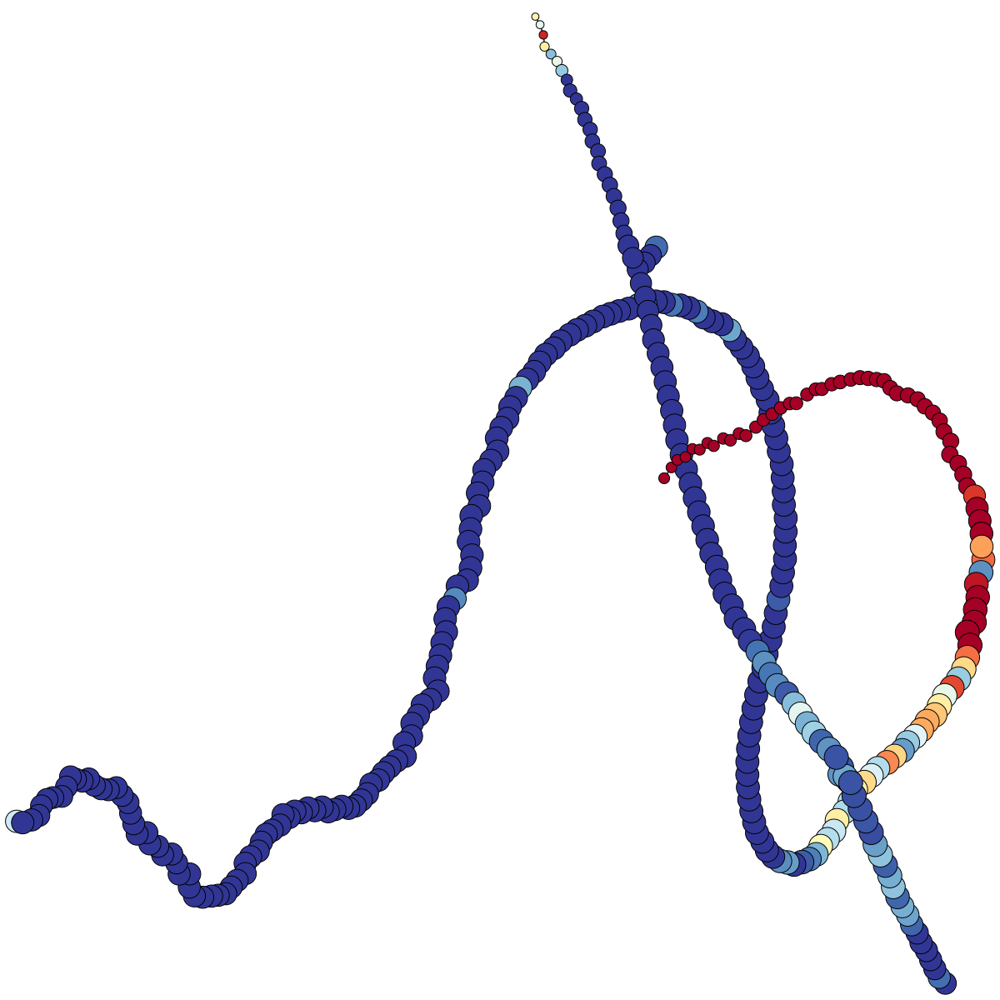

Hells


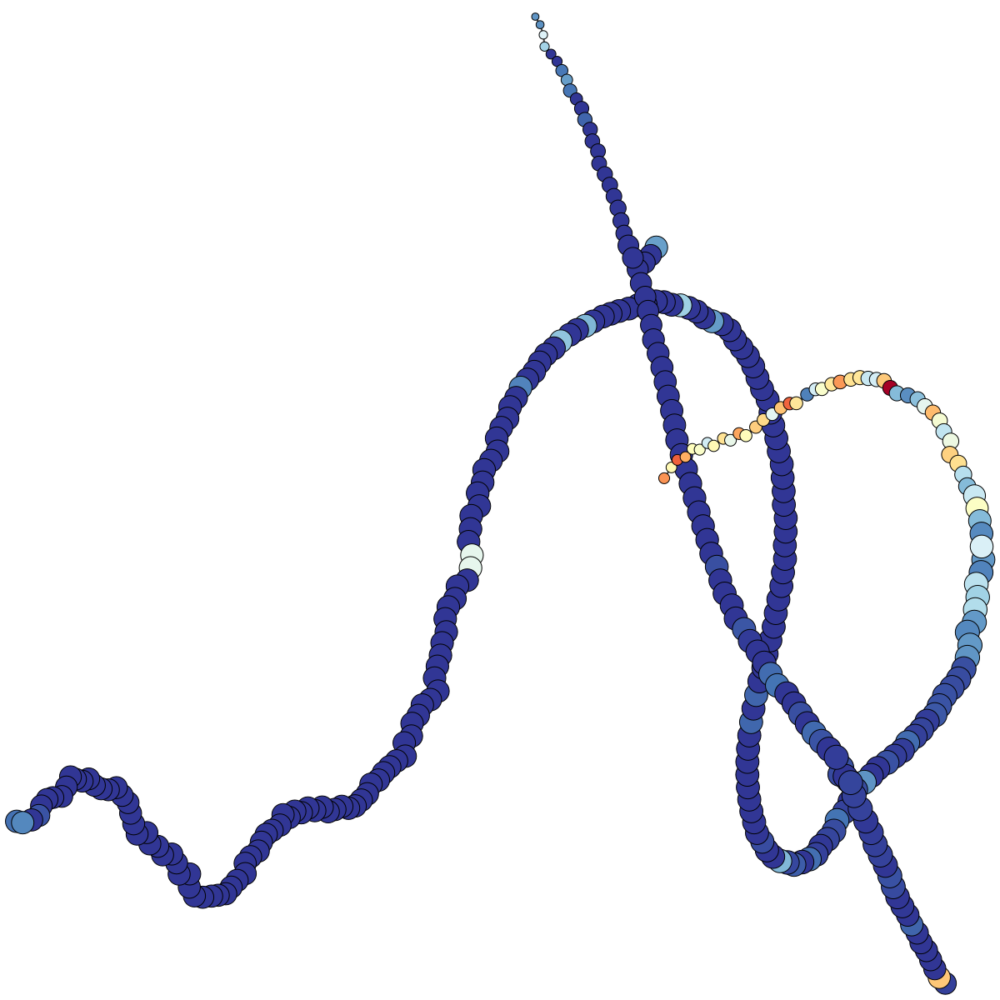

Tuba1b


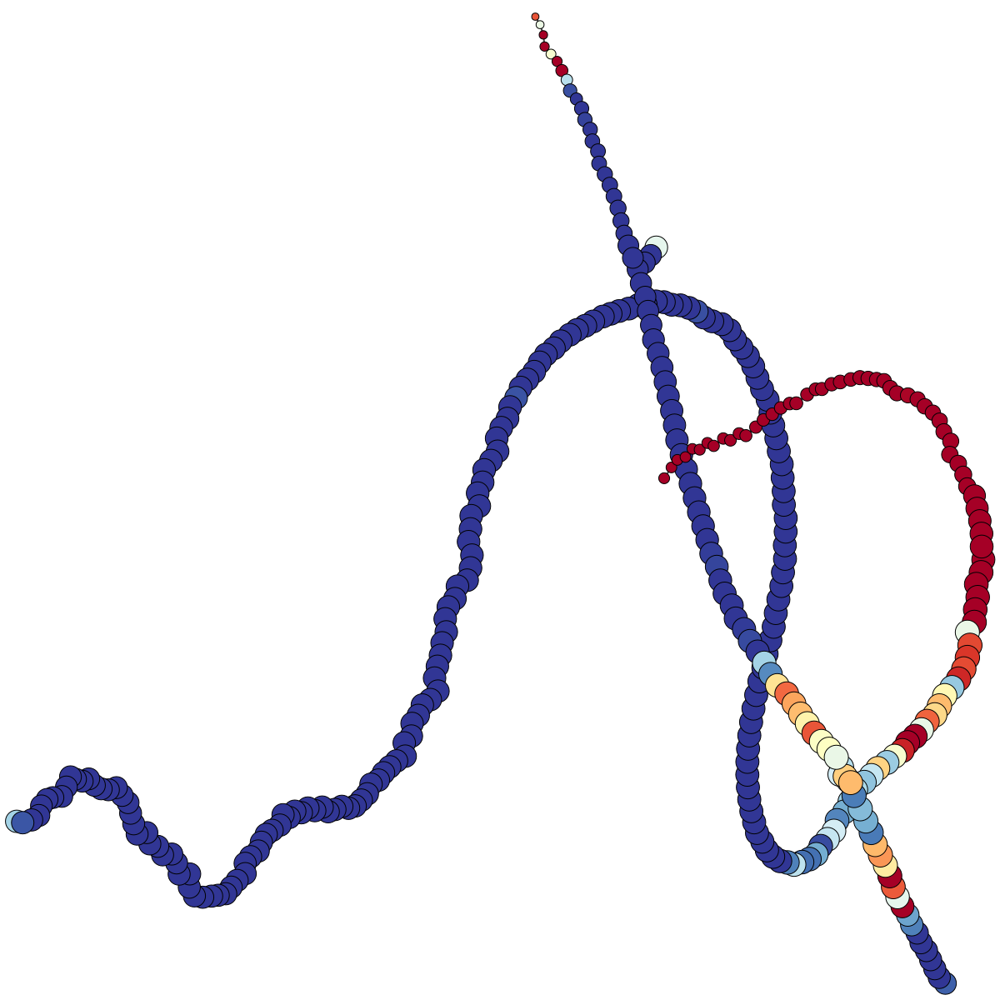

Rrm2


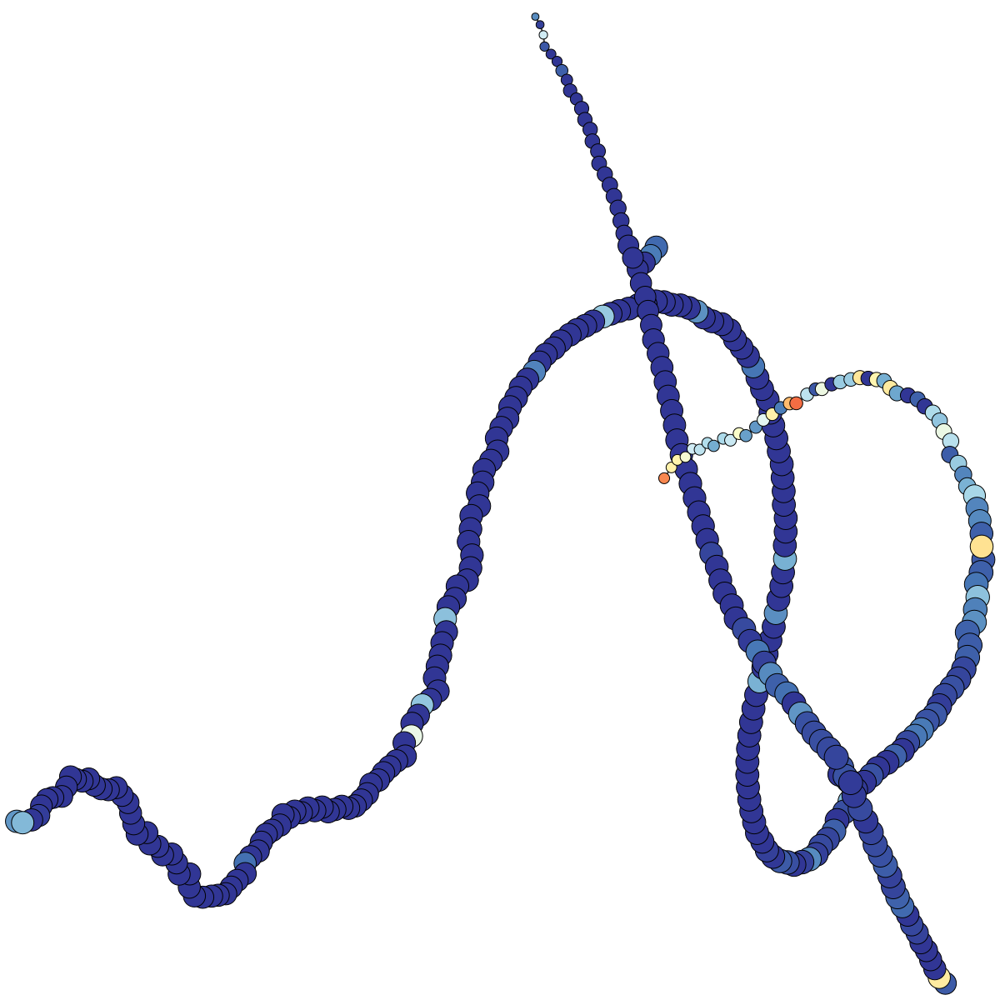

Clu


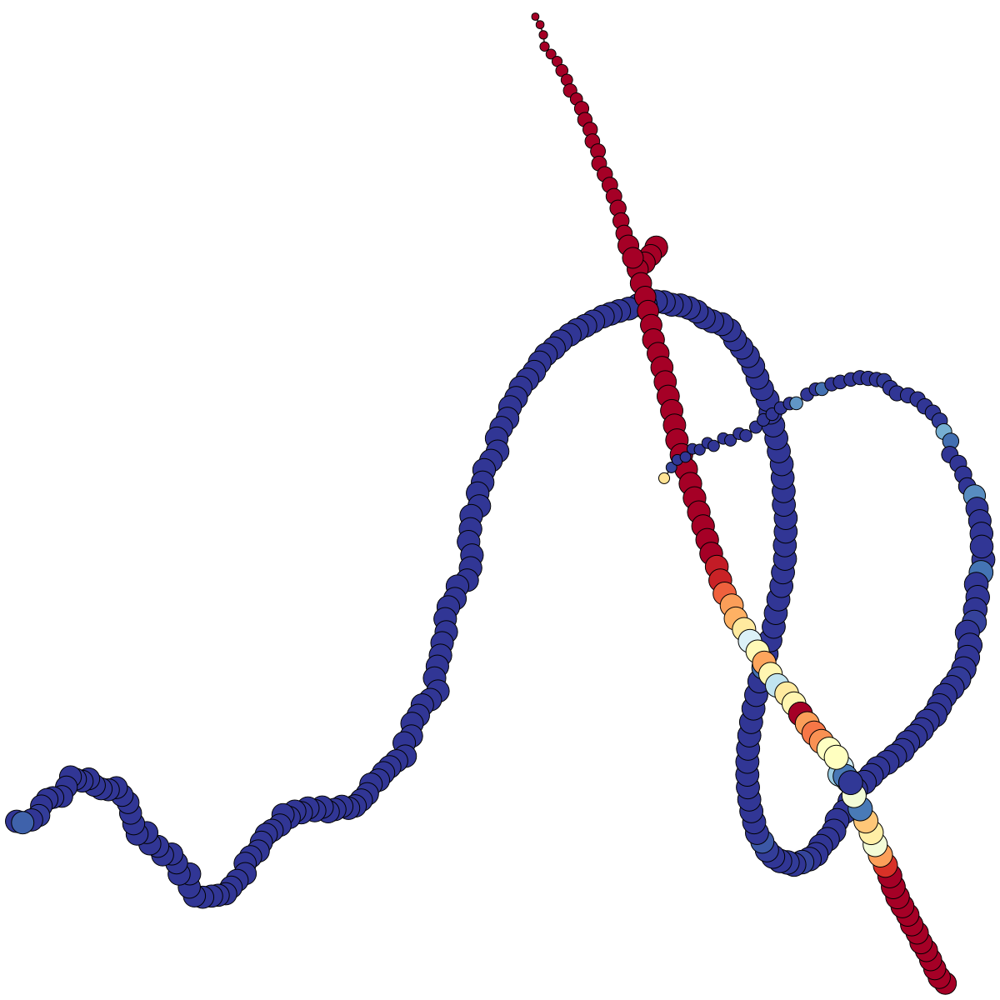

Anxa1


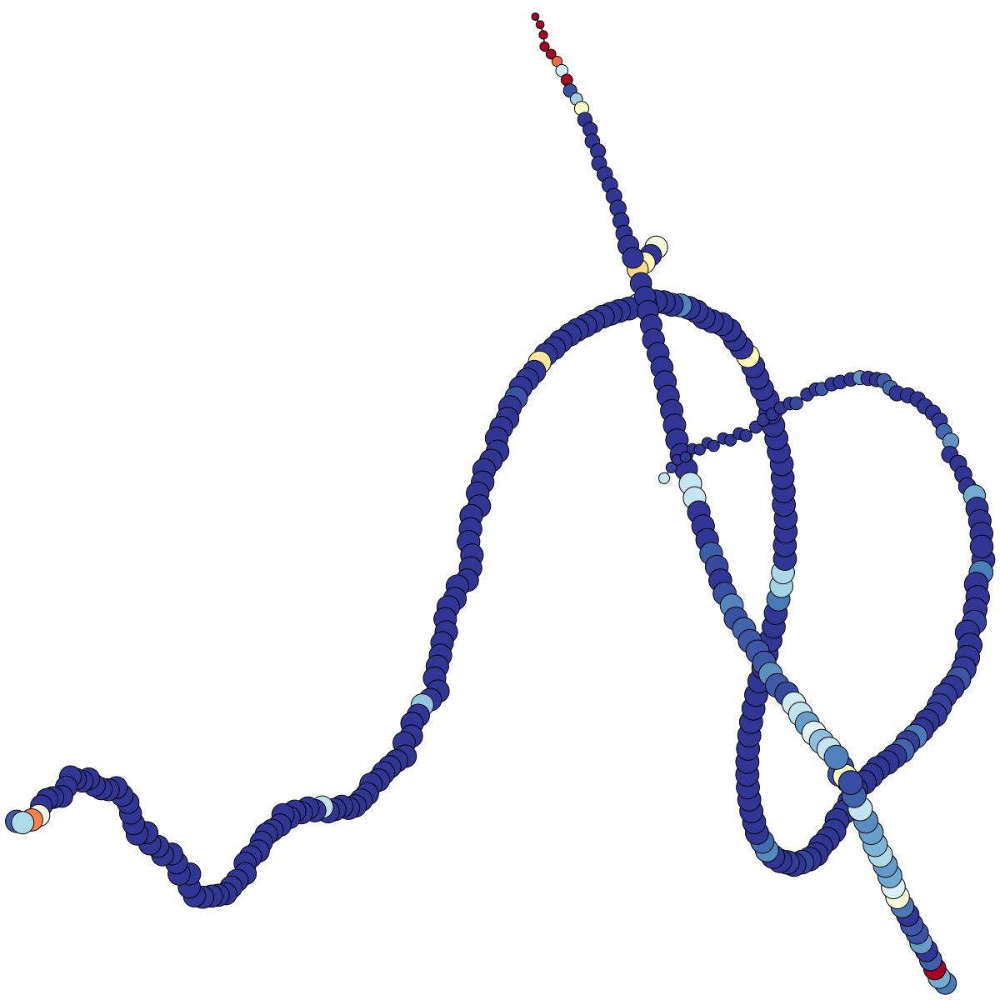

Basp1


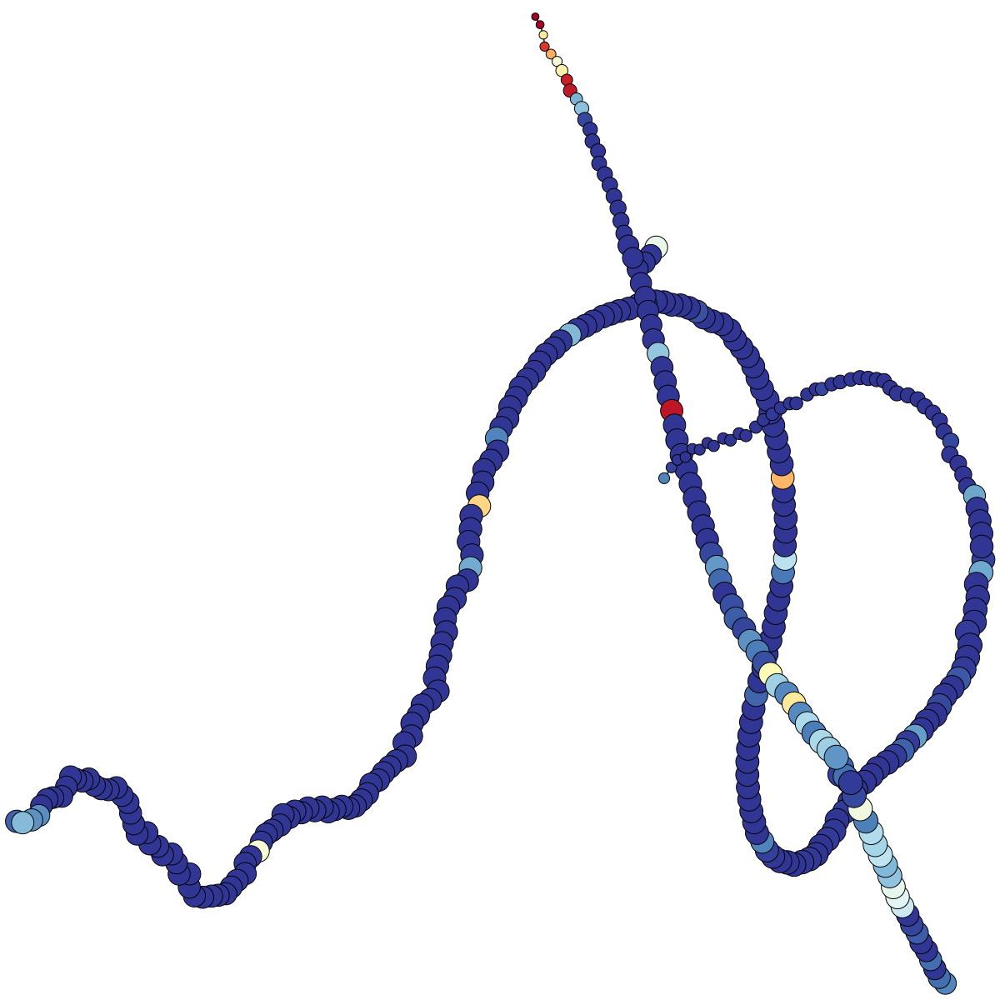

Cxadr


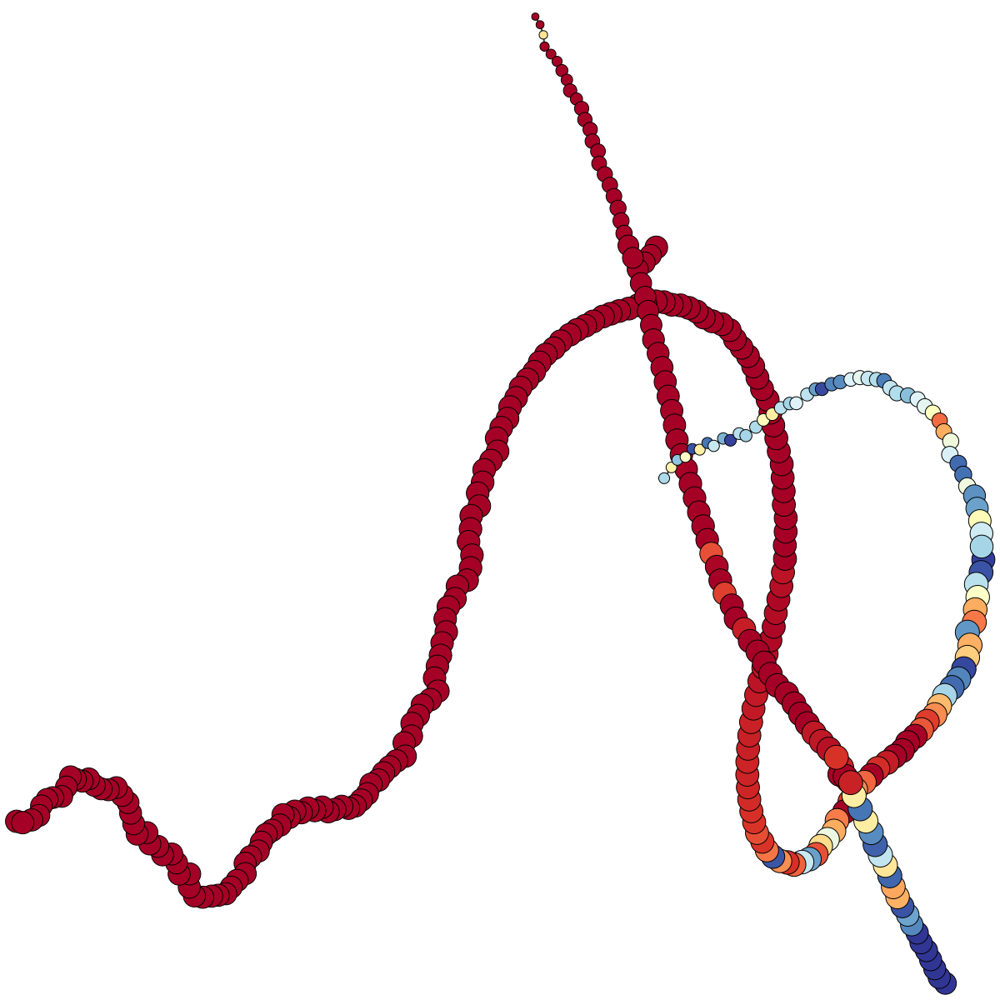

Lgr5


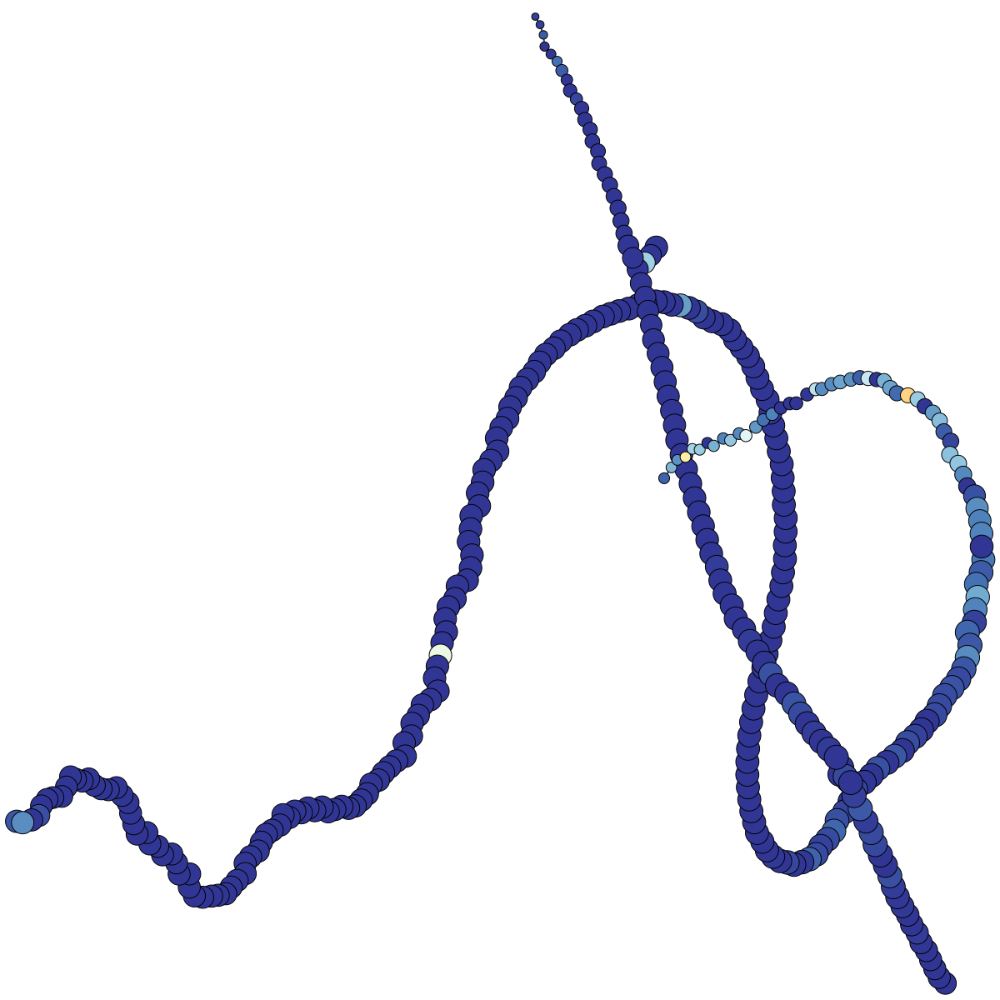

Axin2


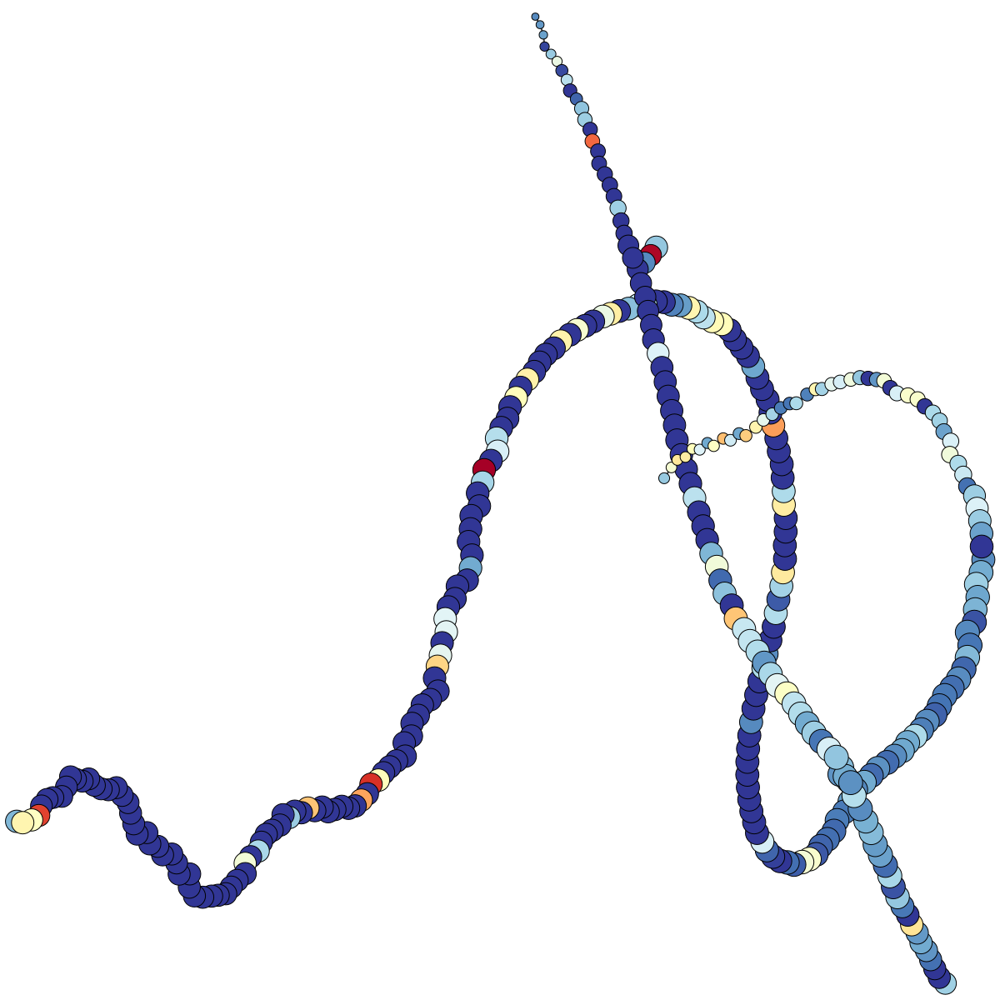

Ascl2


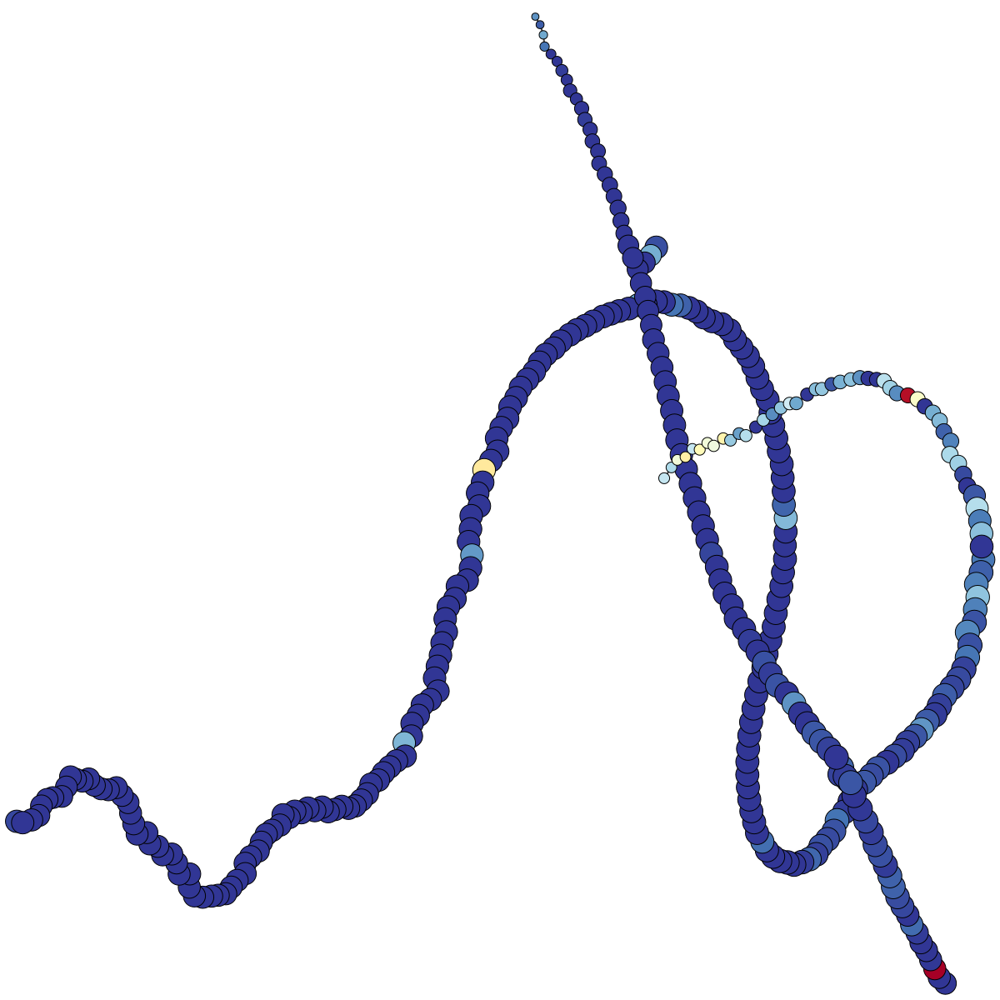

Mcm6


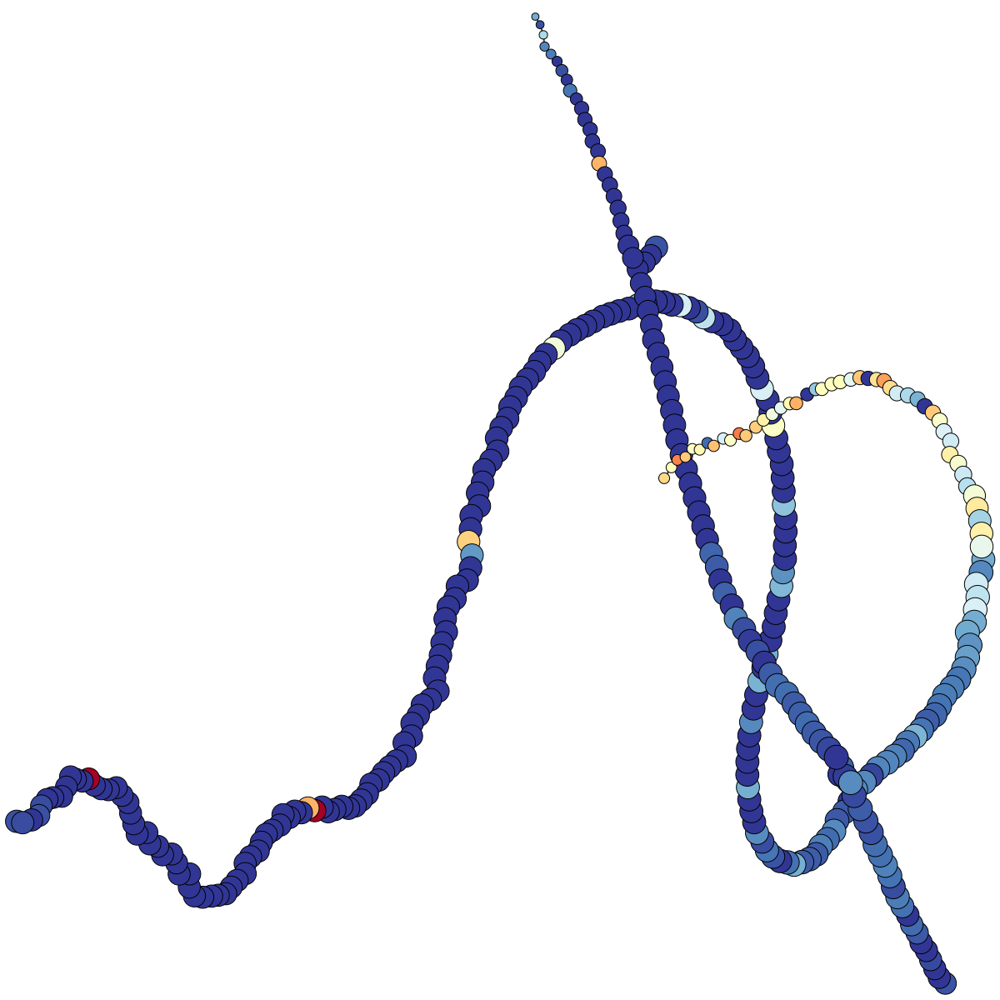

Pcna


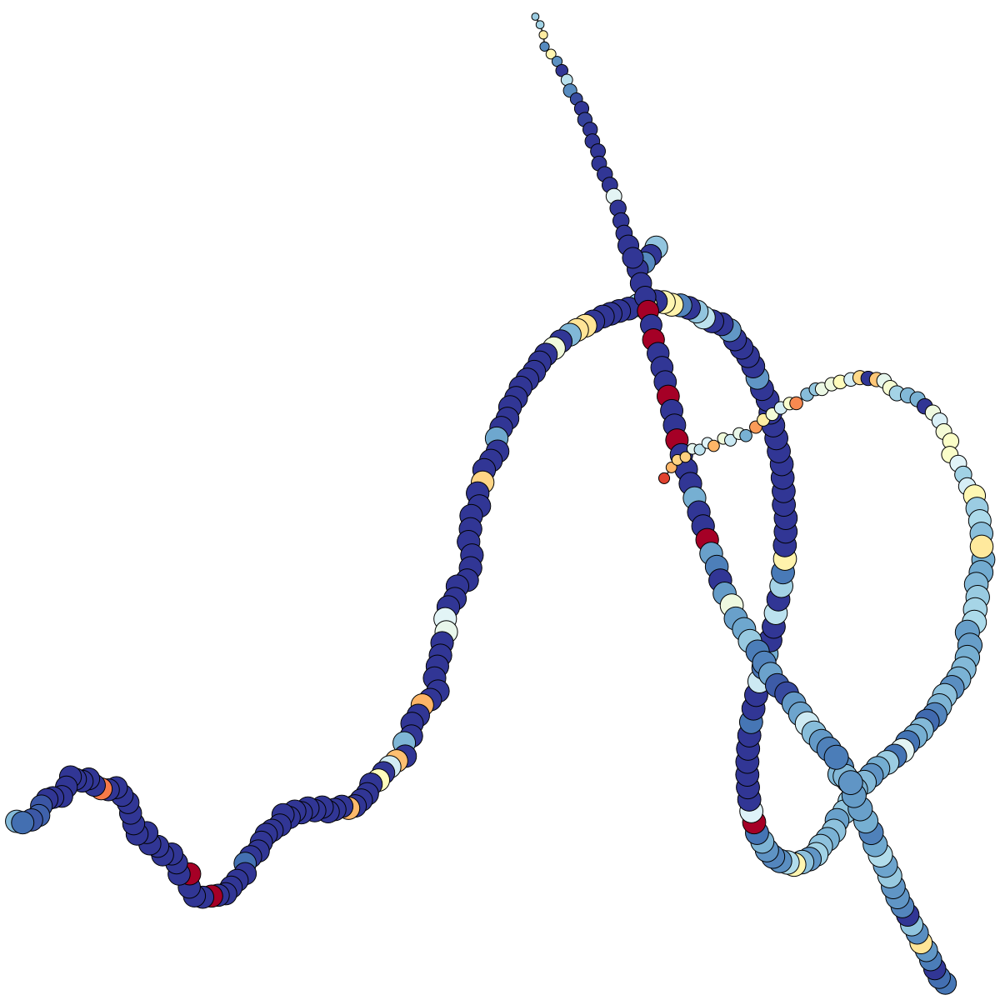

Mki67


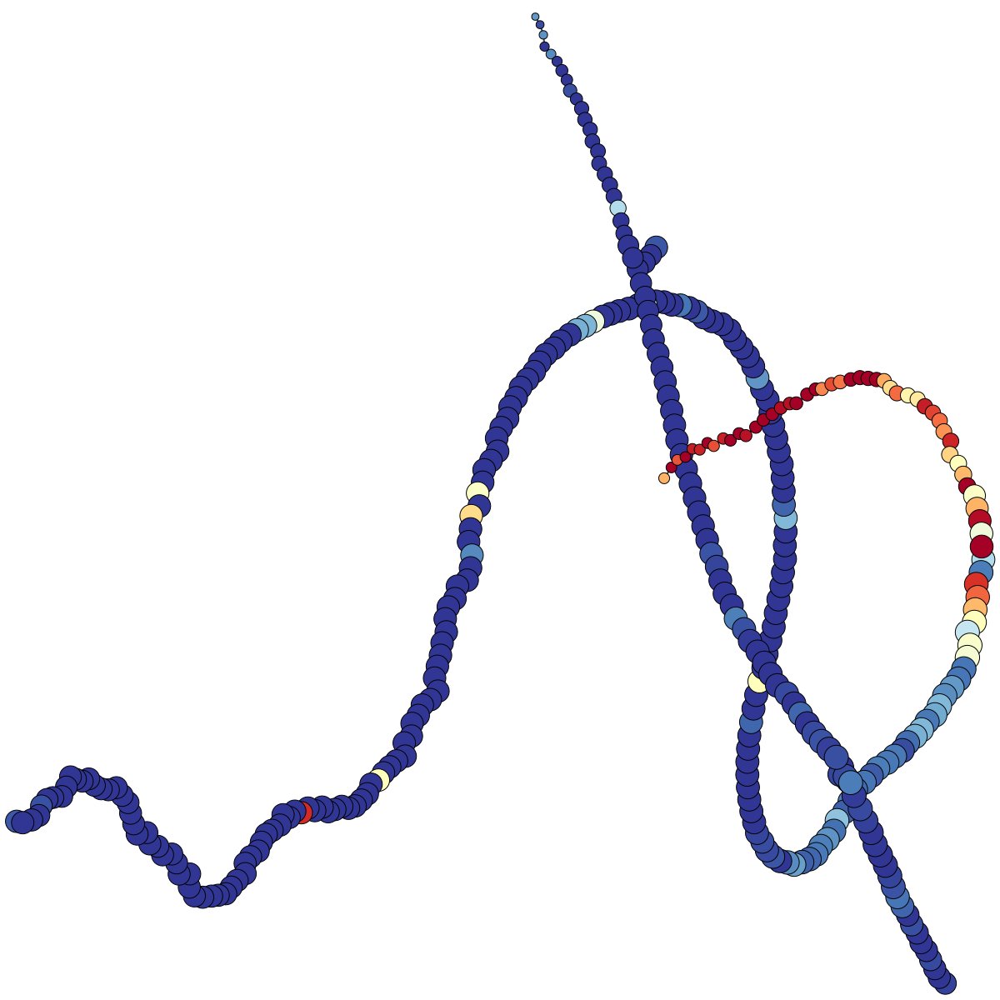

Cdk4


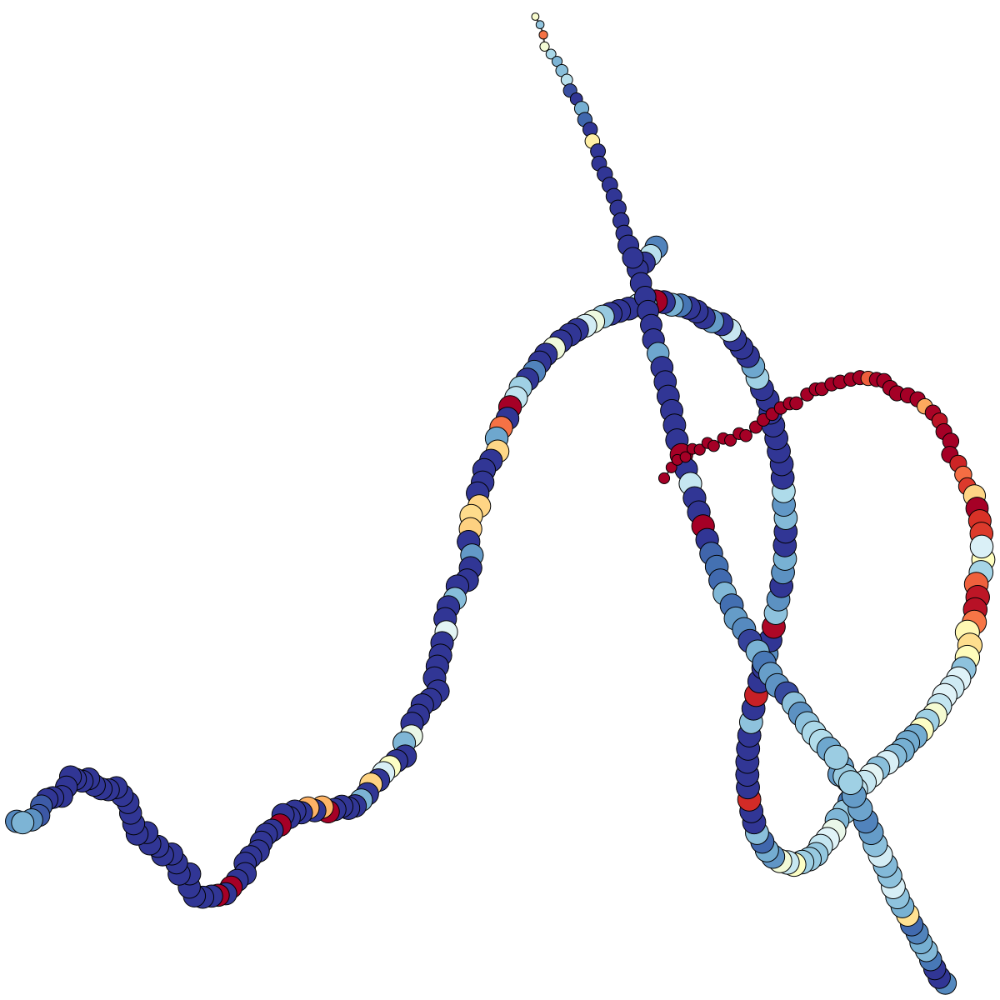

Mcm5


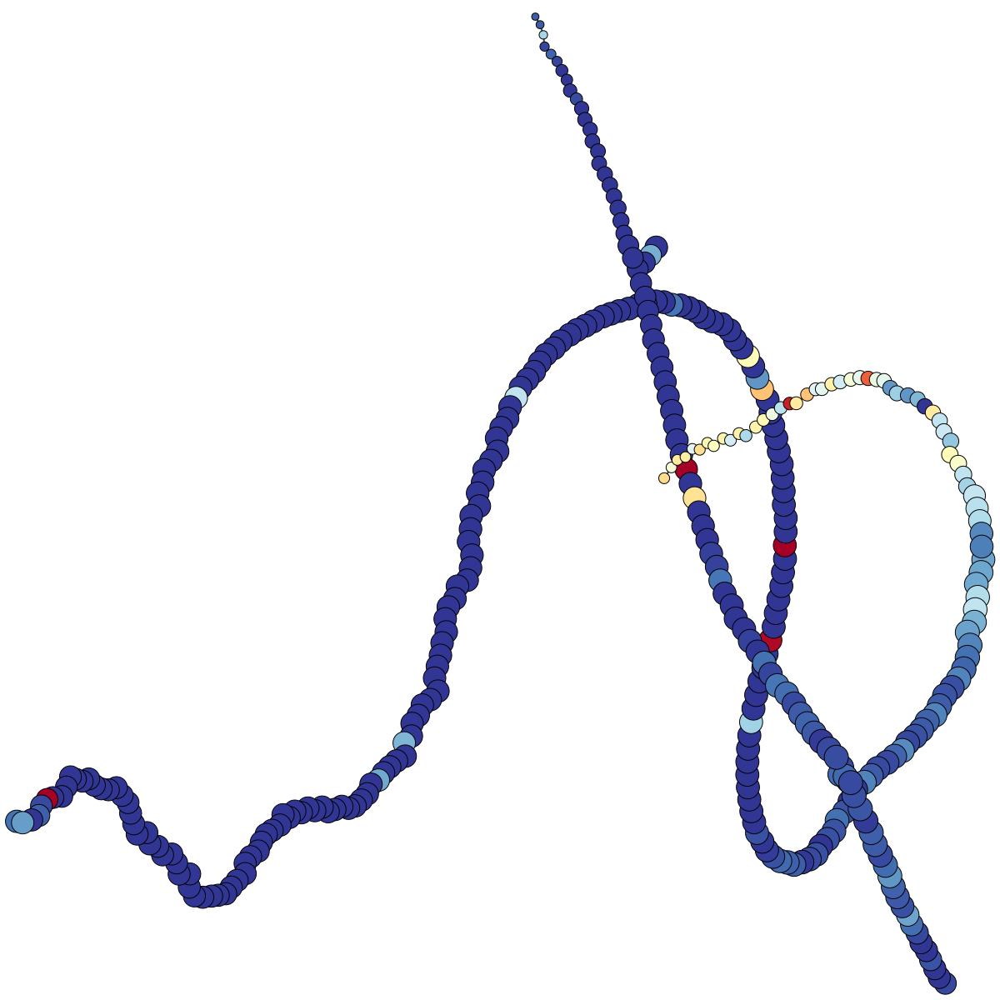

Dclk1


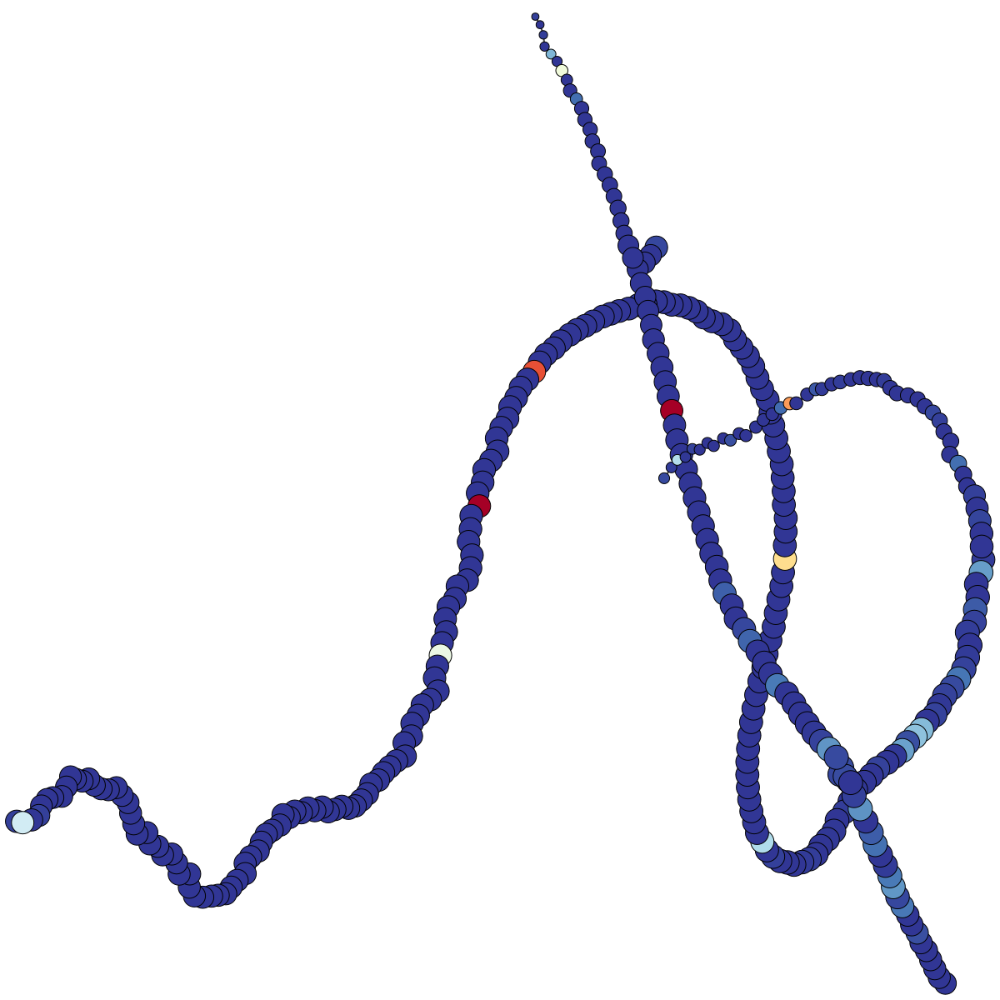

Trpm5


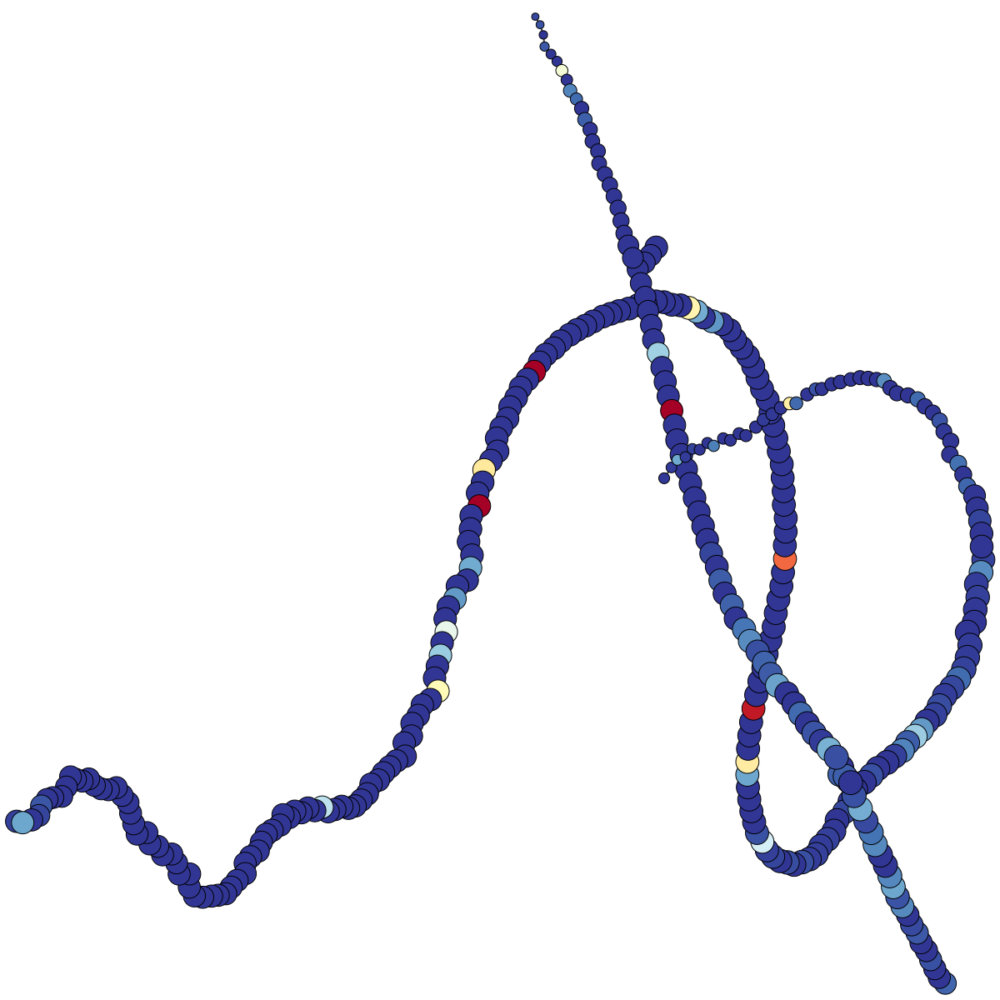

Aoc1


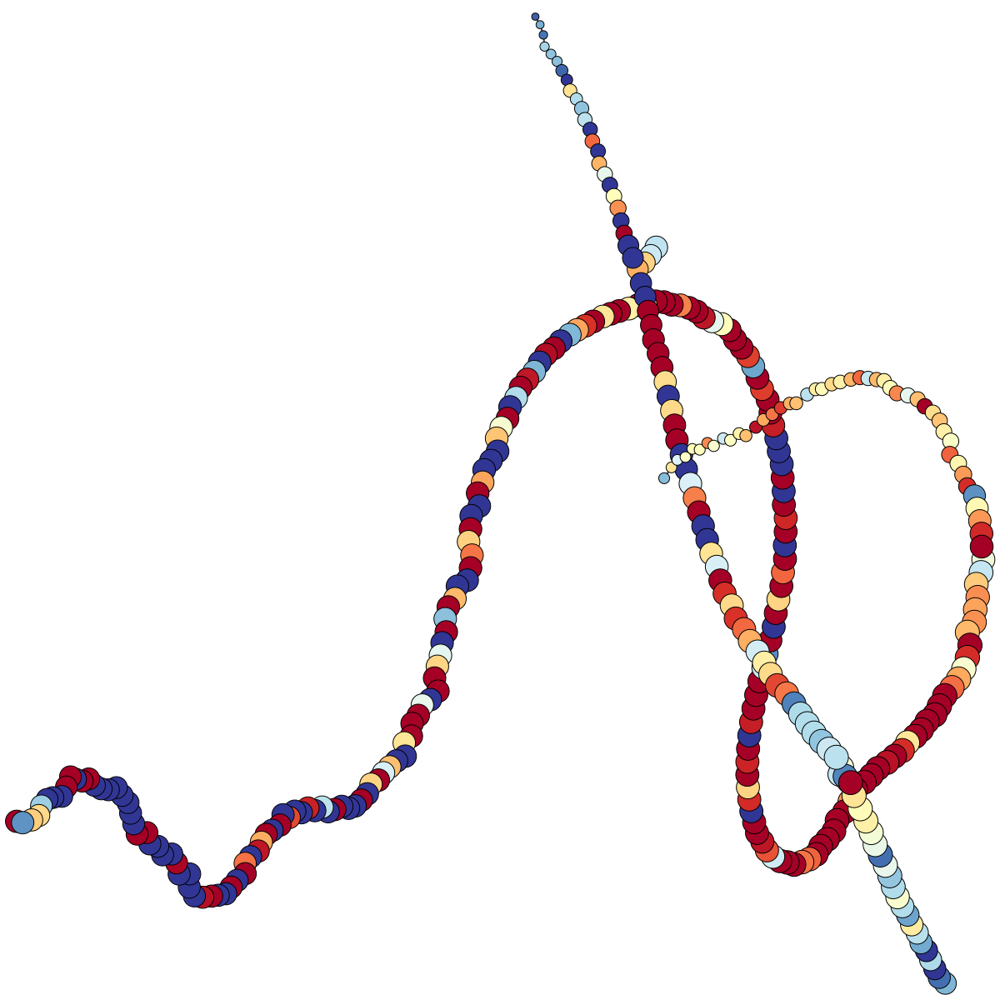

Arg2


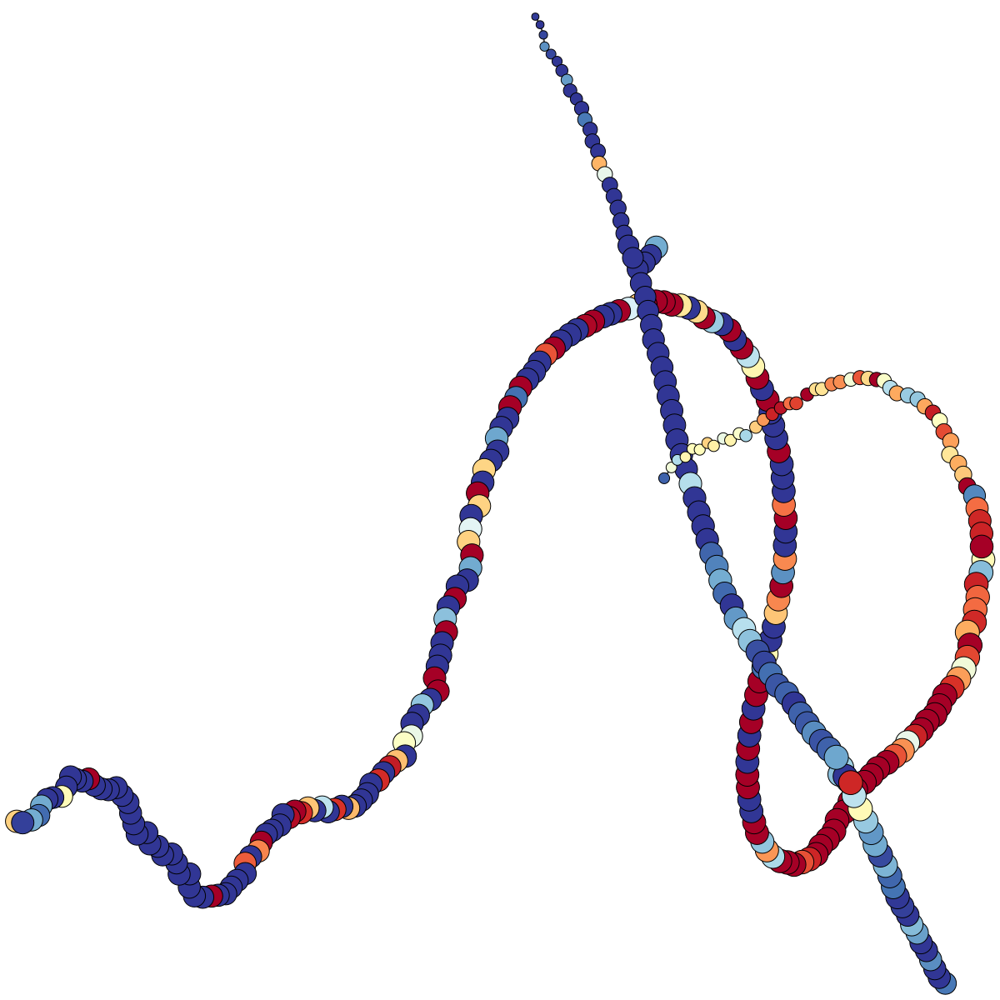

Ccl25


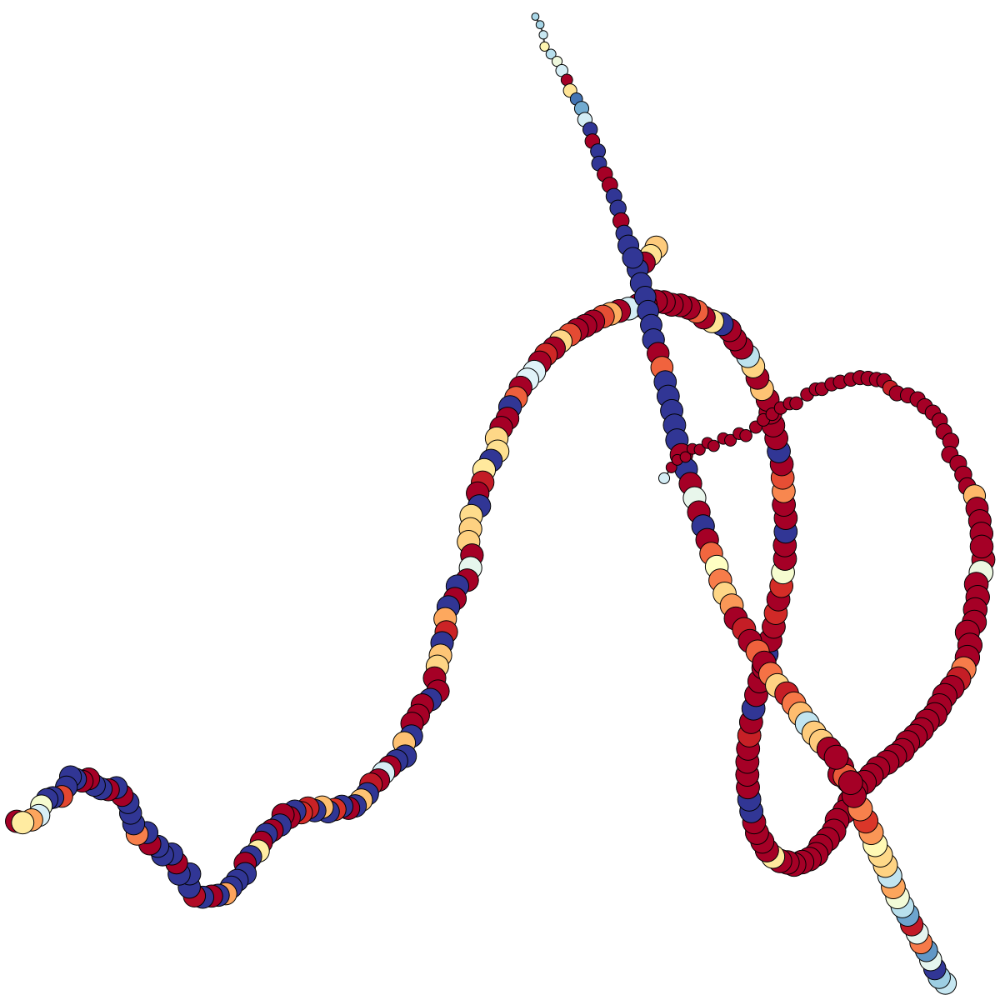

Fabp1


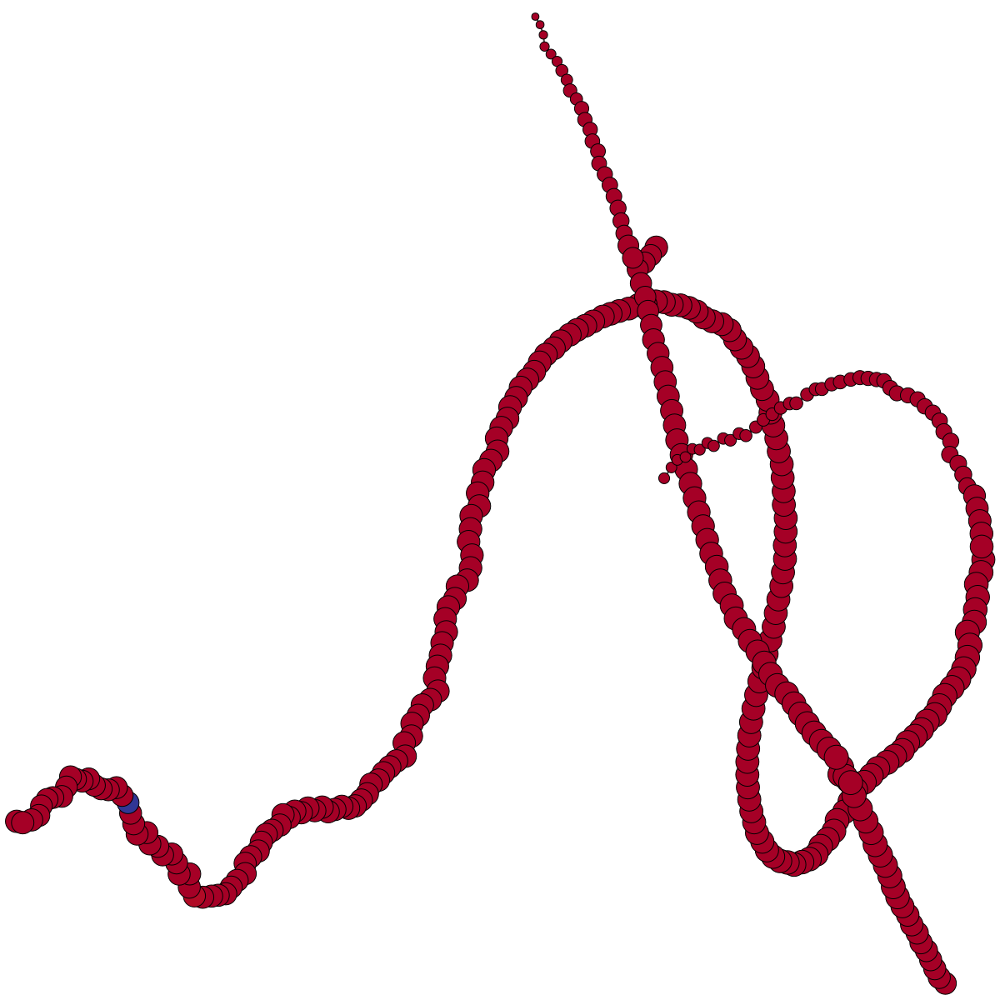

Alpi


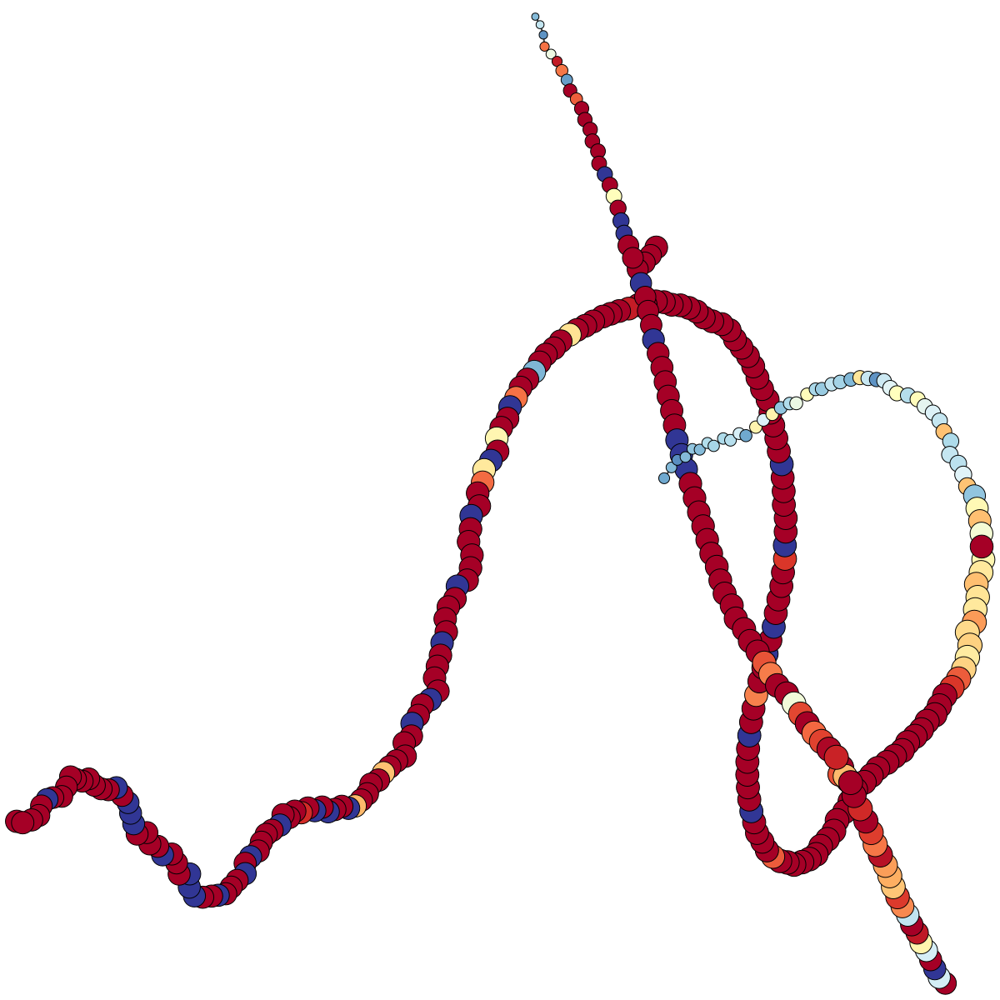

Apoa1


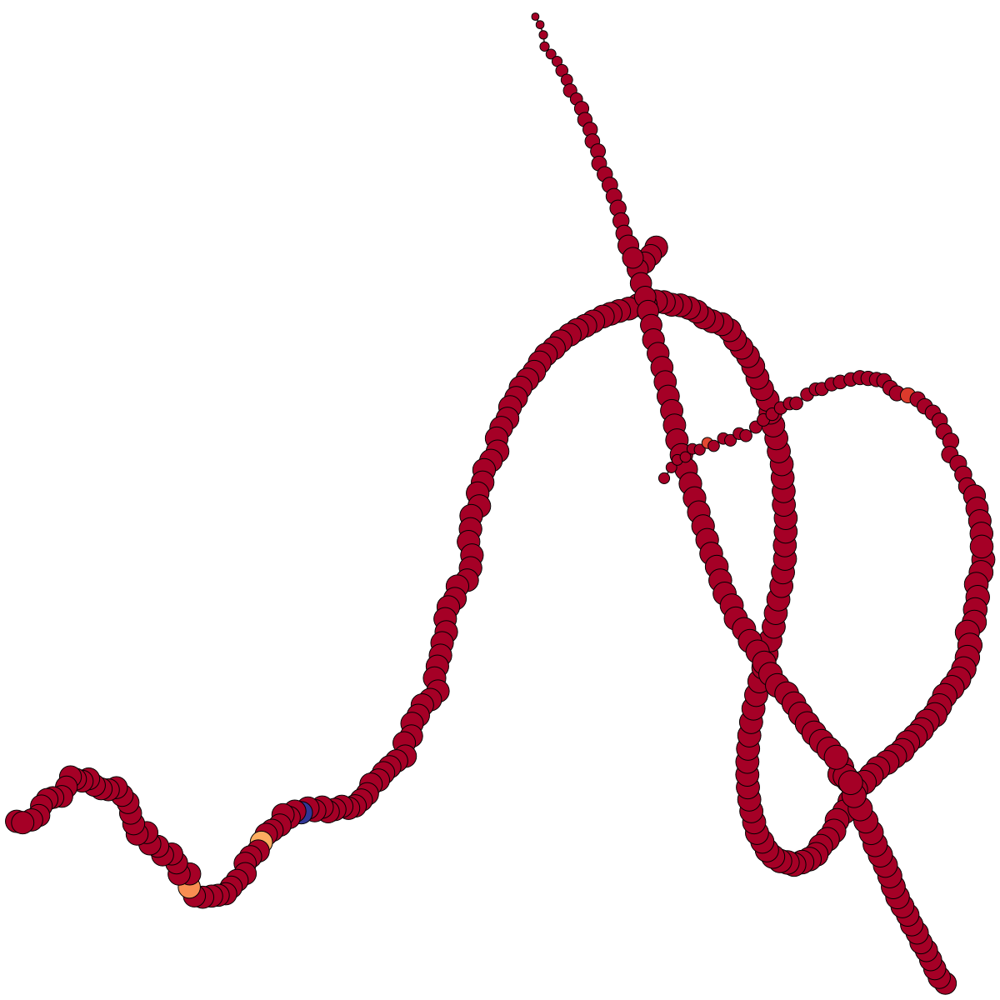

Apoa4


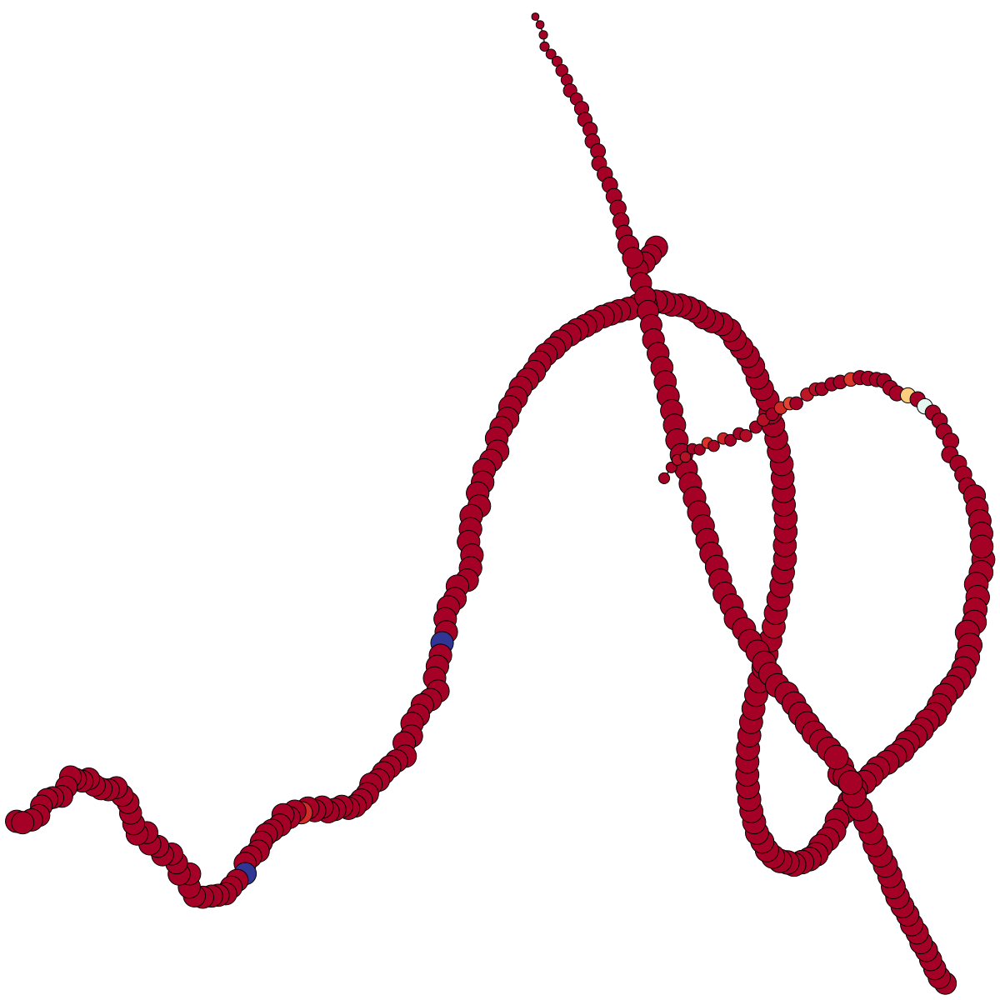

Tph1


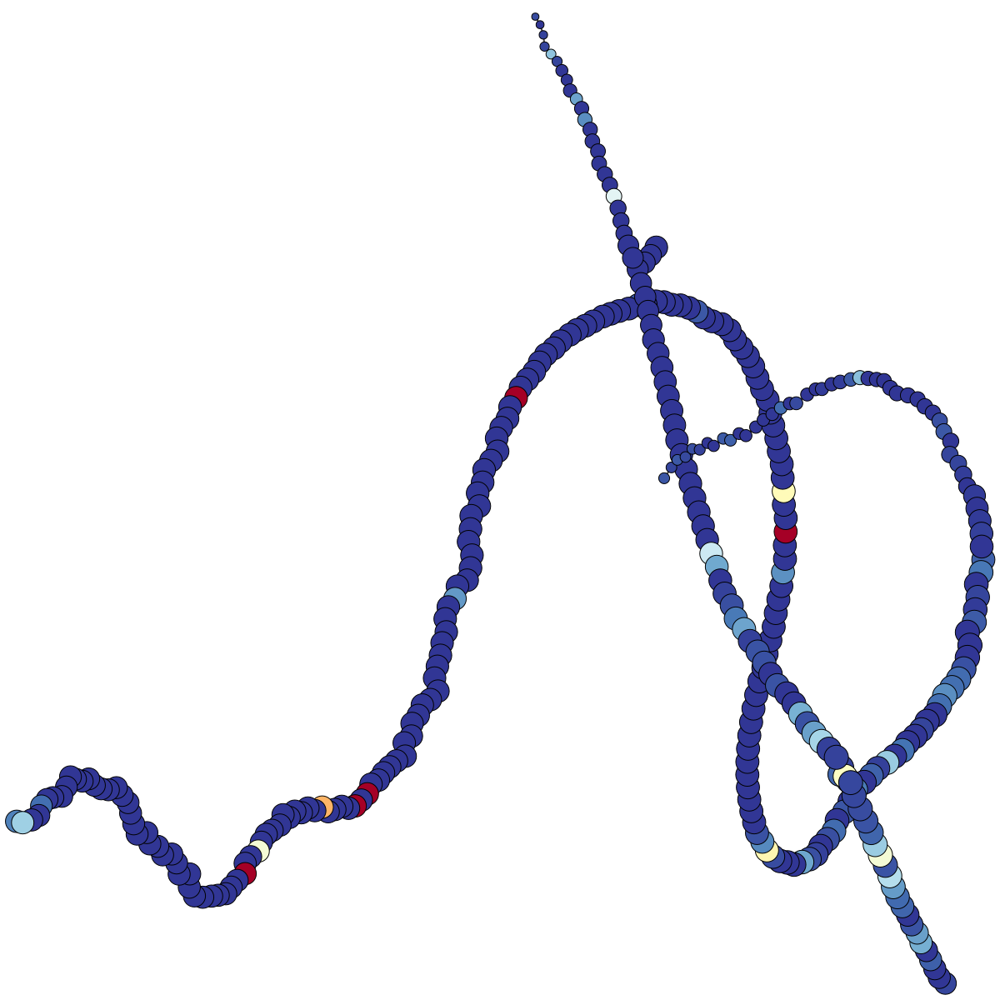

Chga


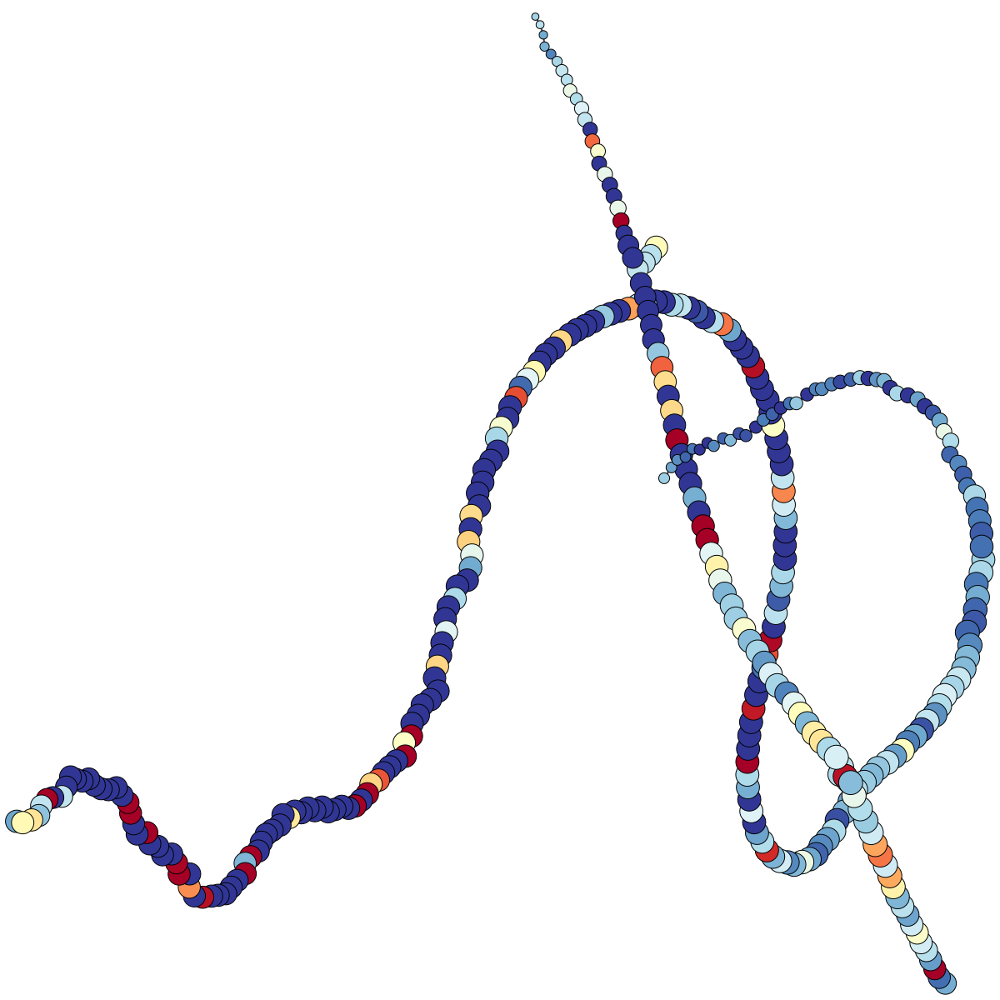

Chgb


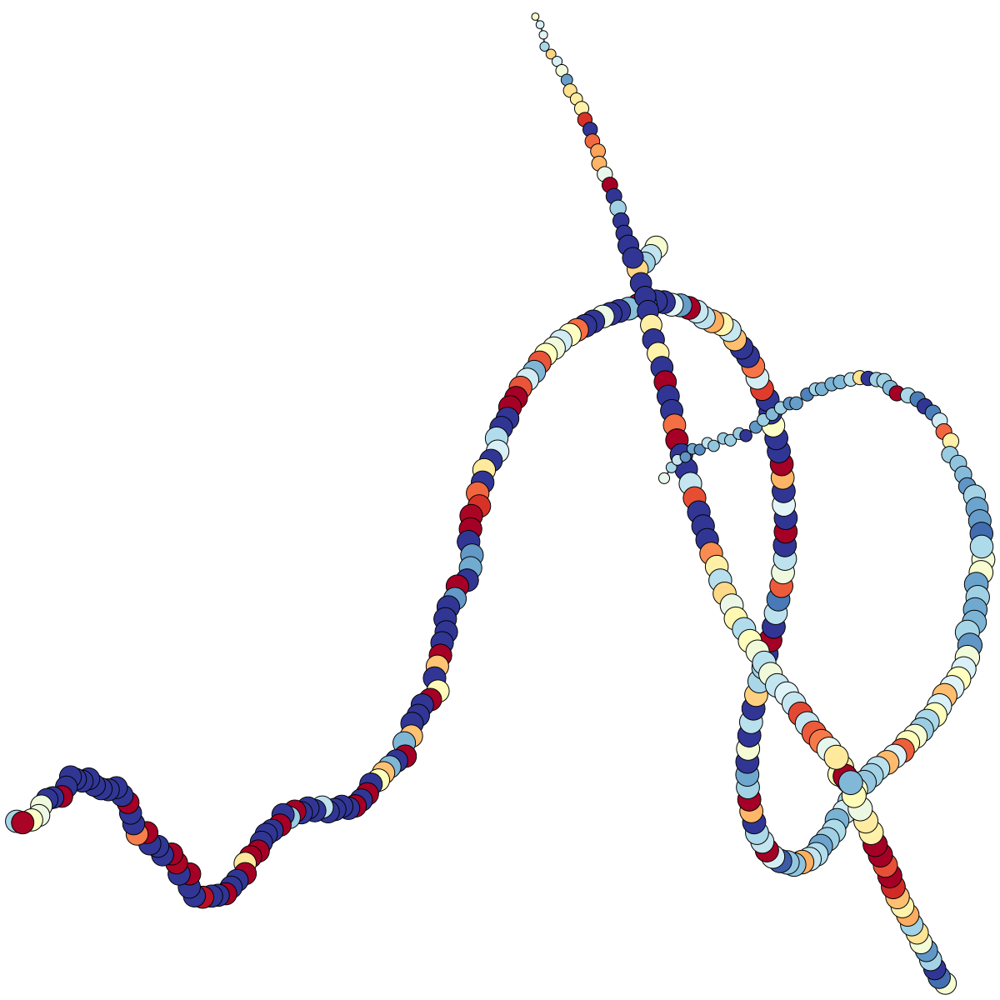

Tac1


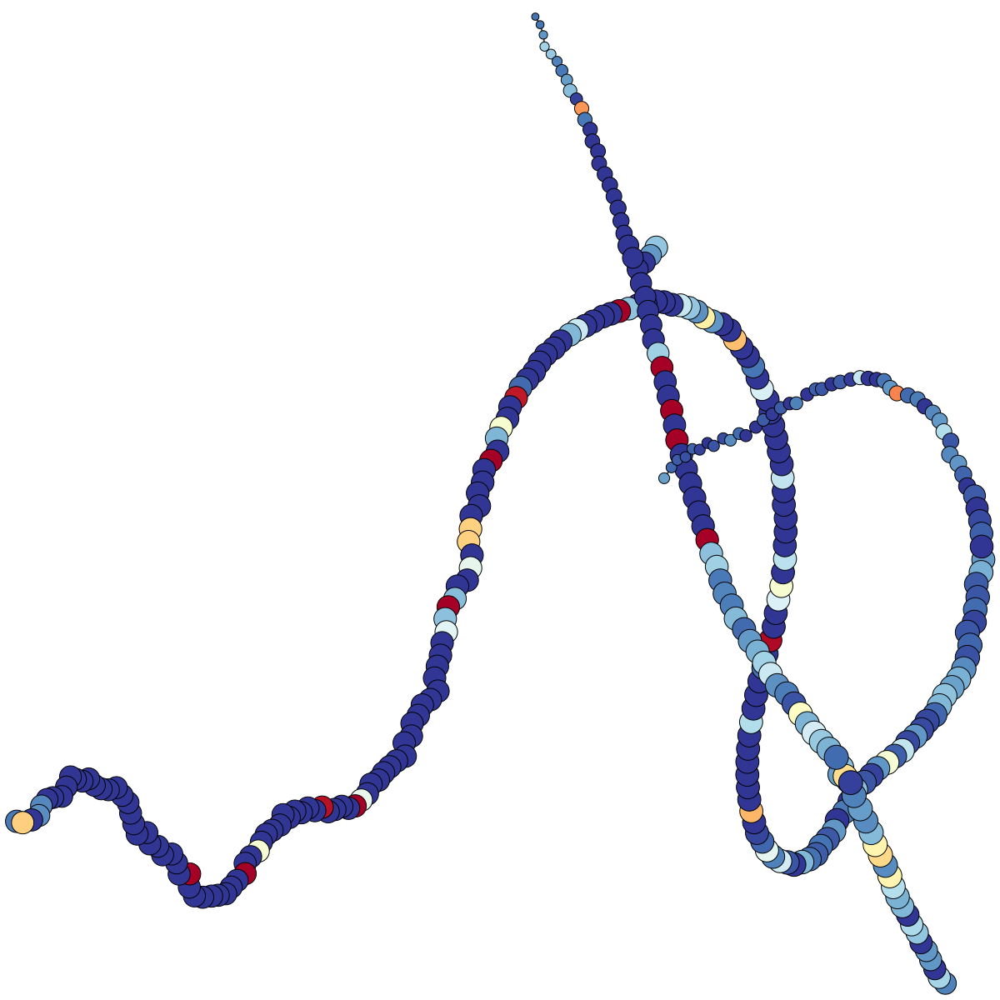

Scg3


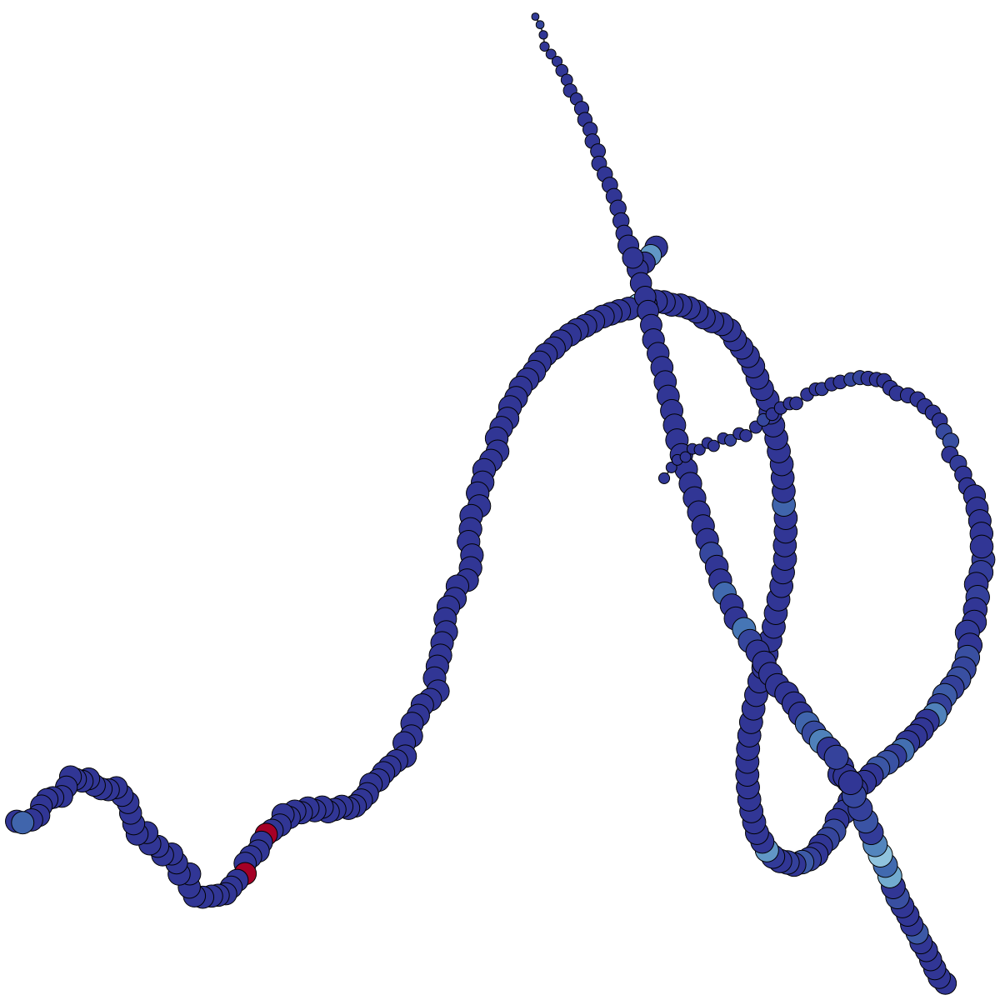

Sct


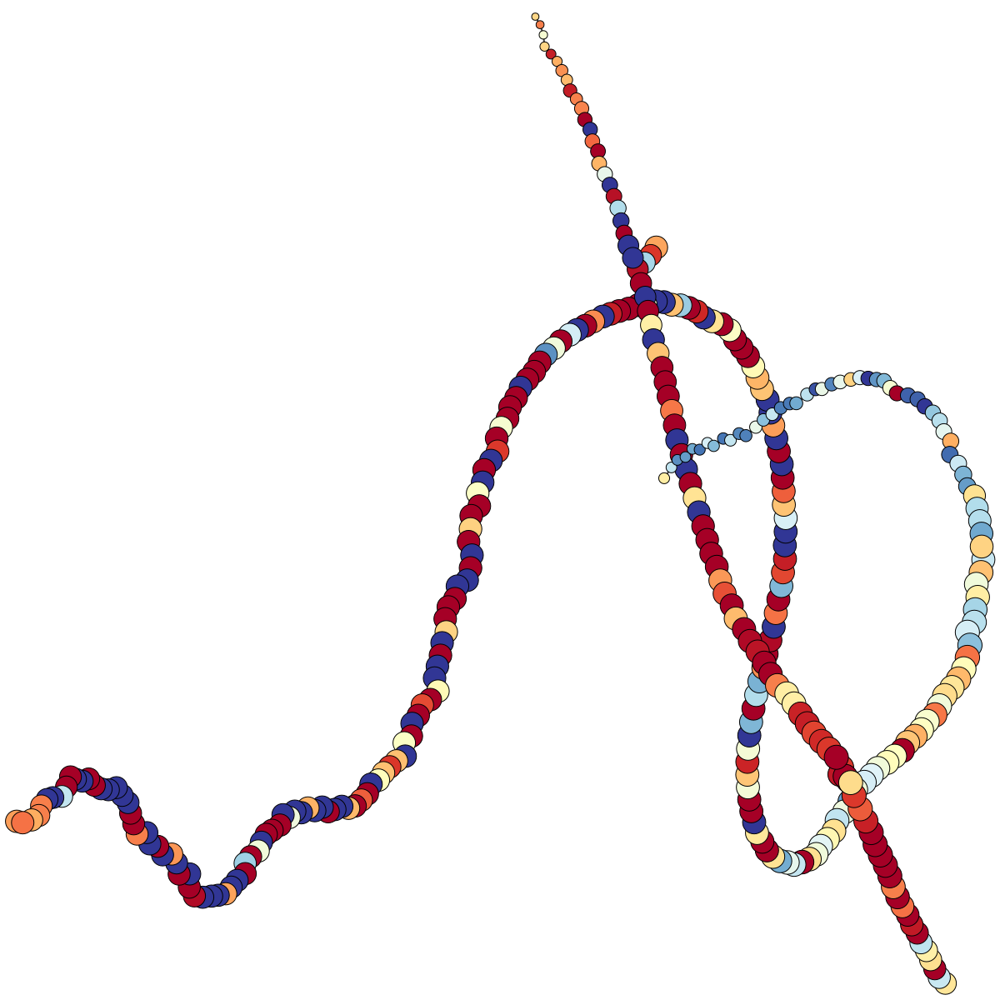

Pax6


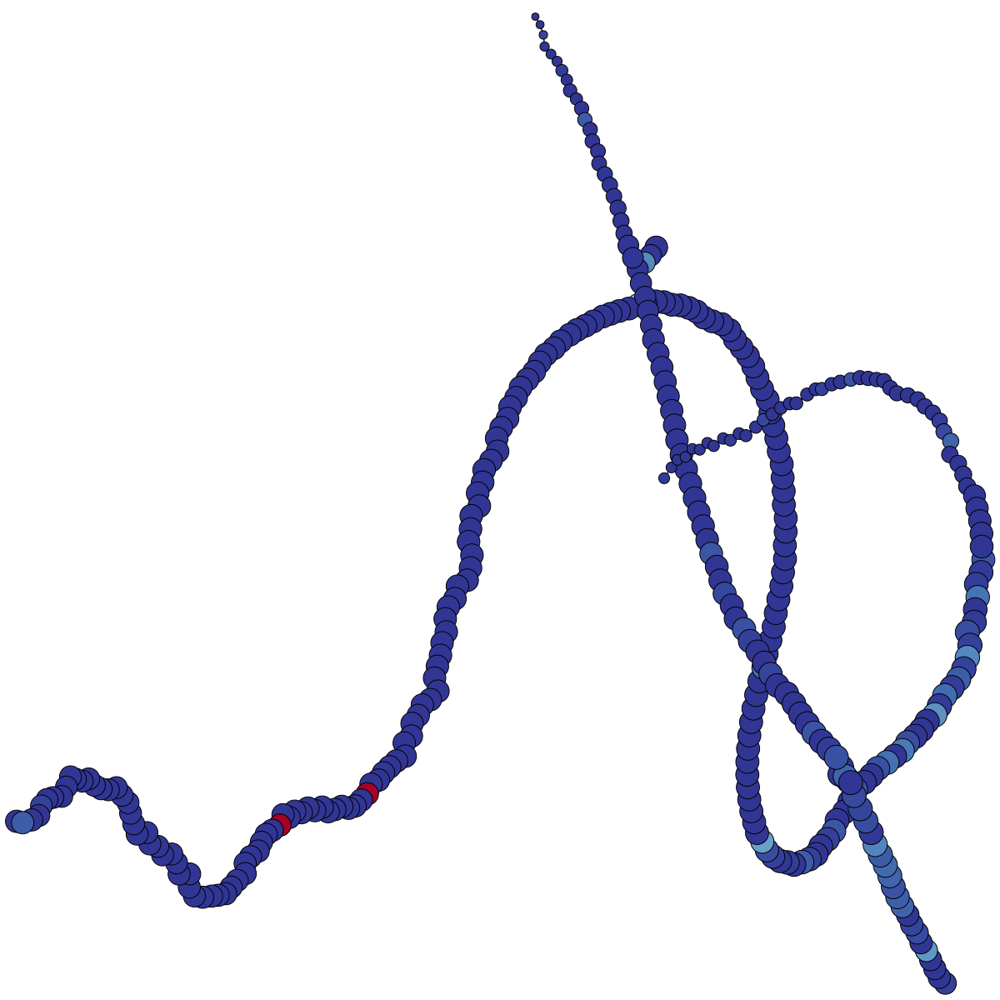

Arg2


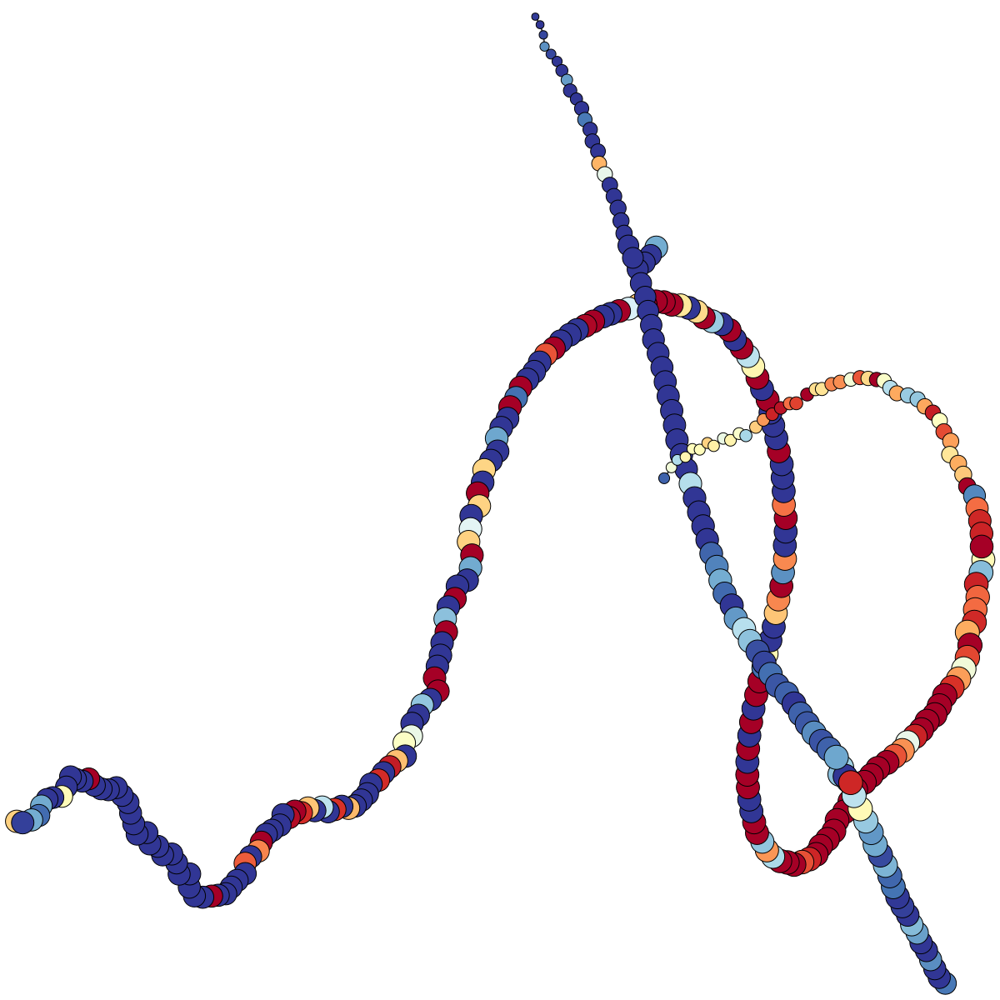

Muc2


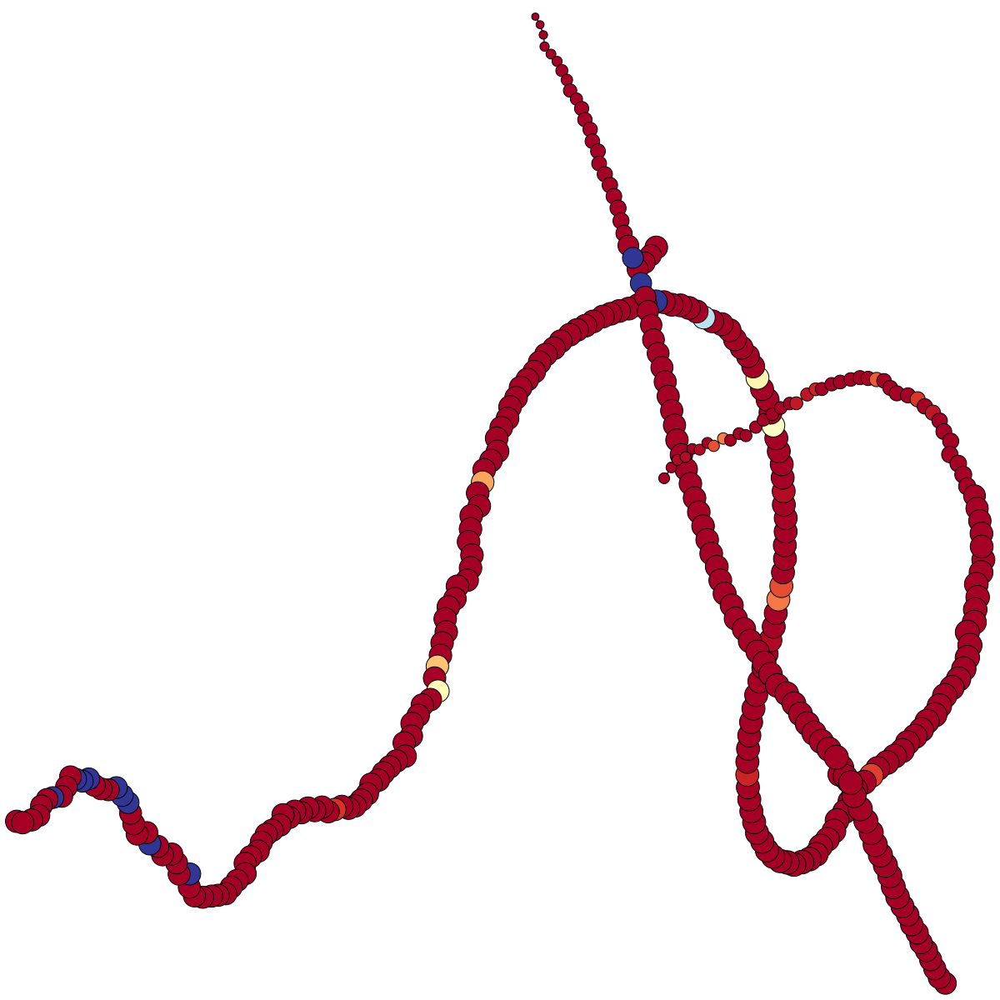

Tff3


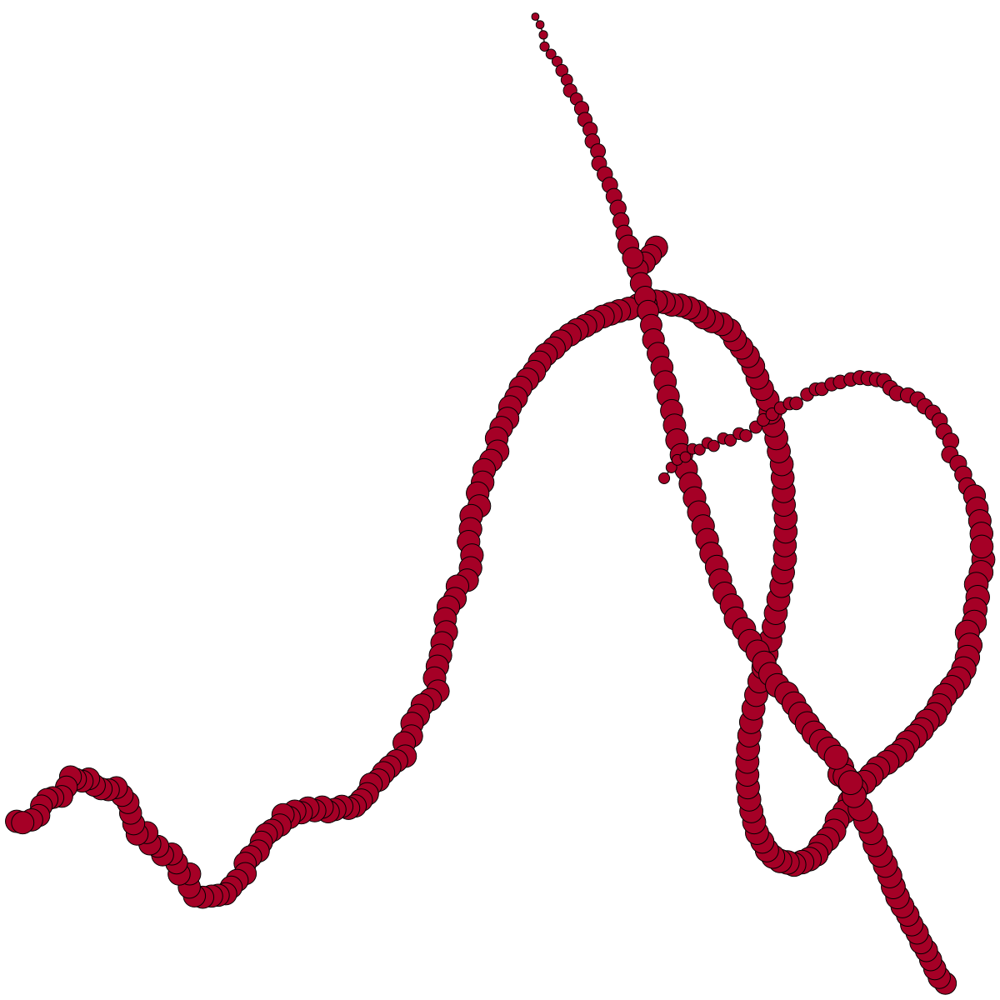

Cd3e


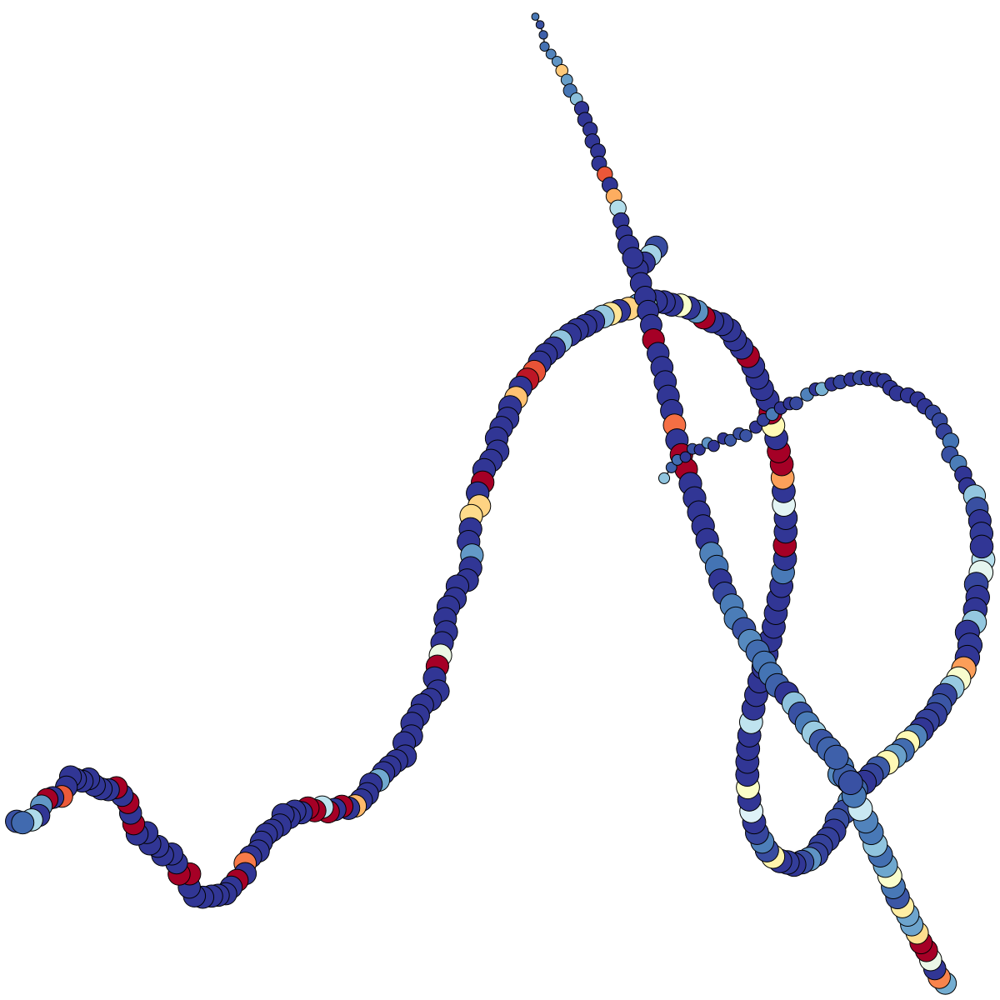

Cd3g


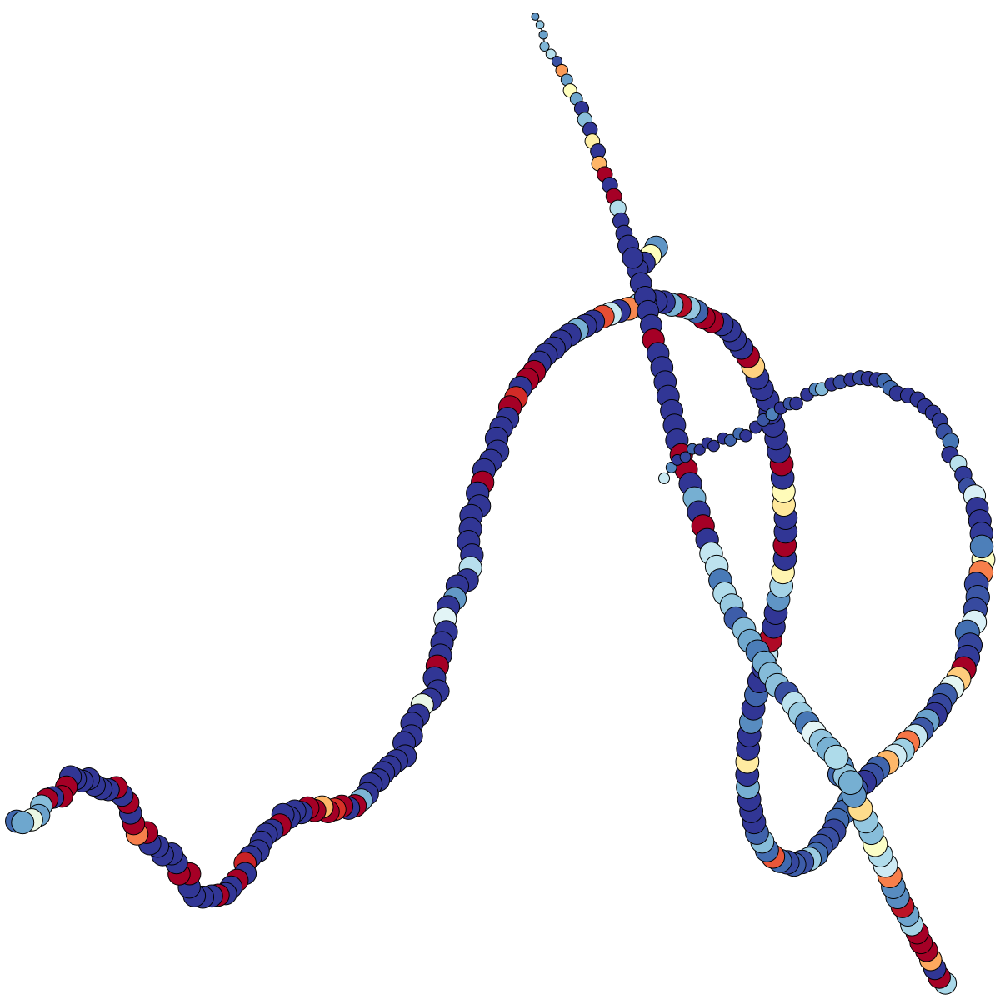

Ptprc


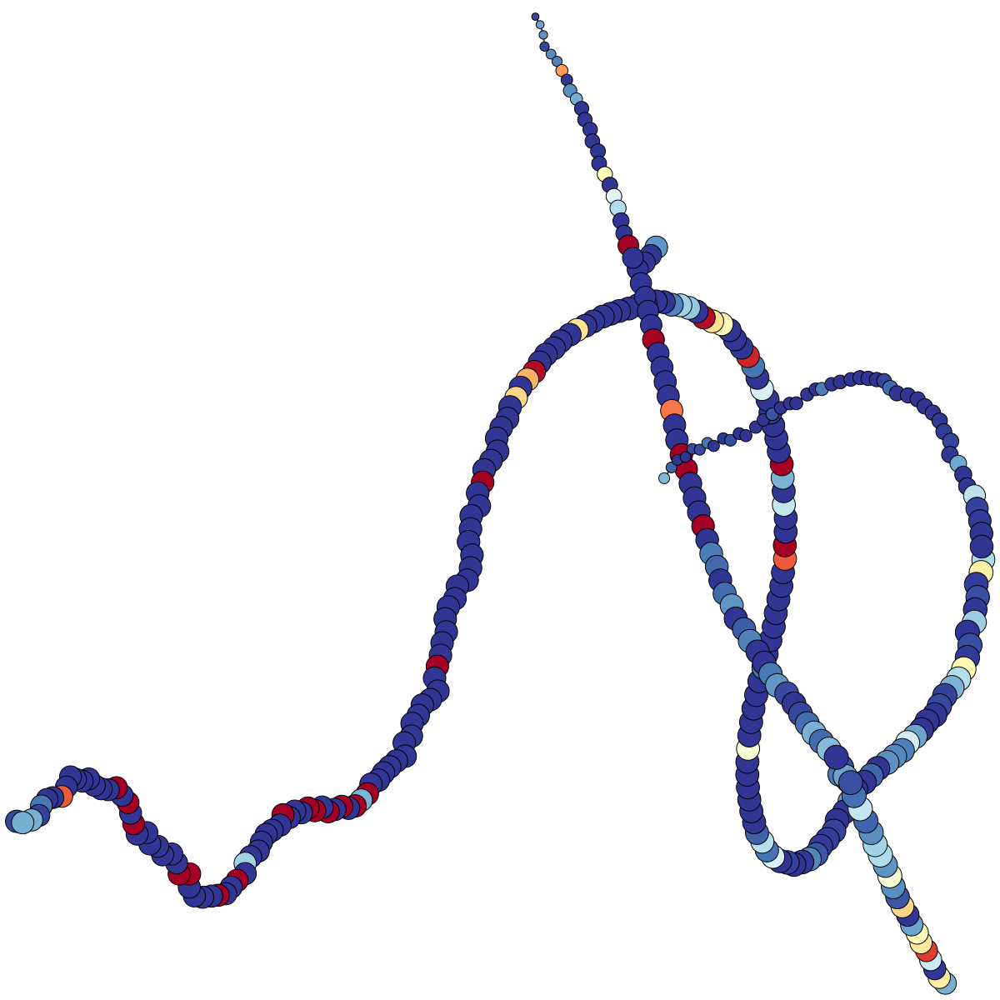

Lyz1


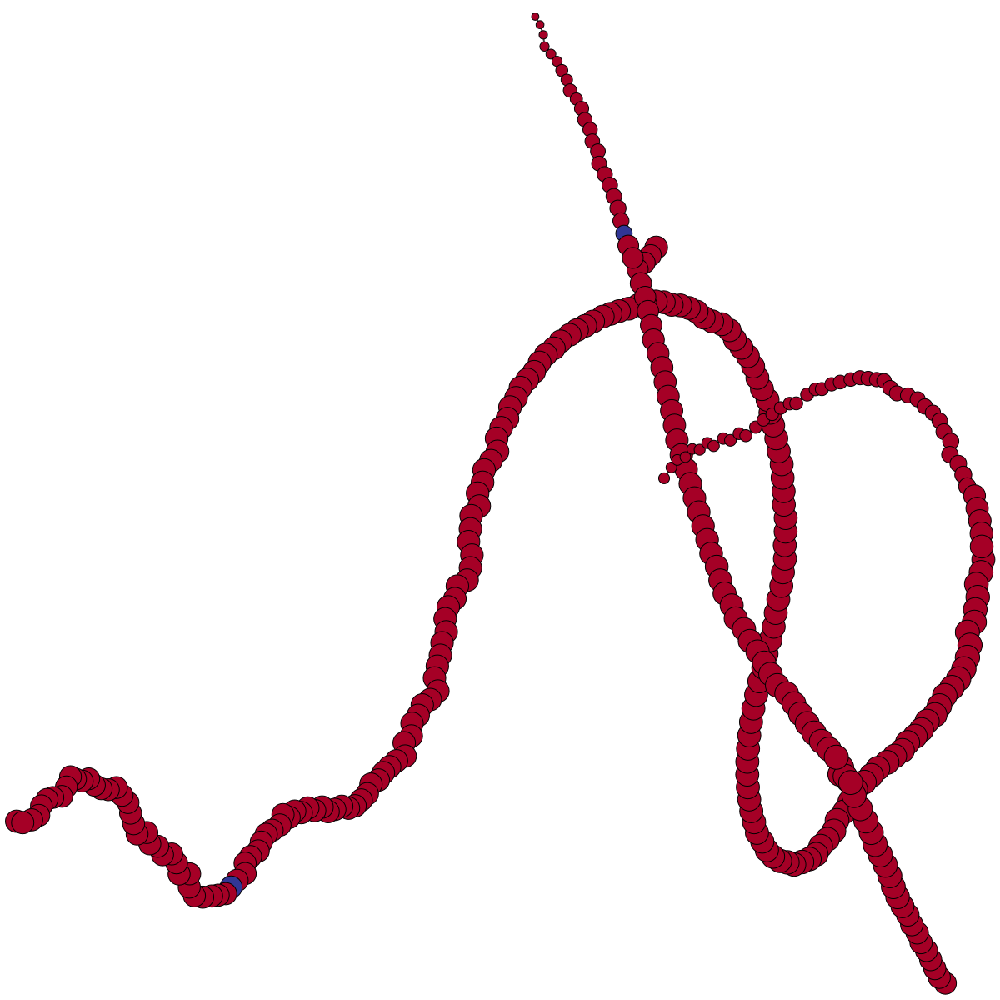

Defa17


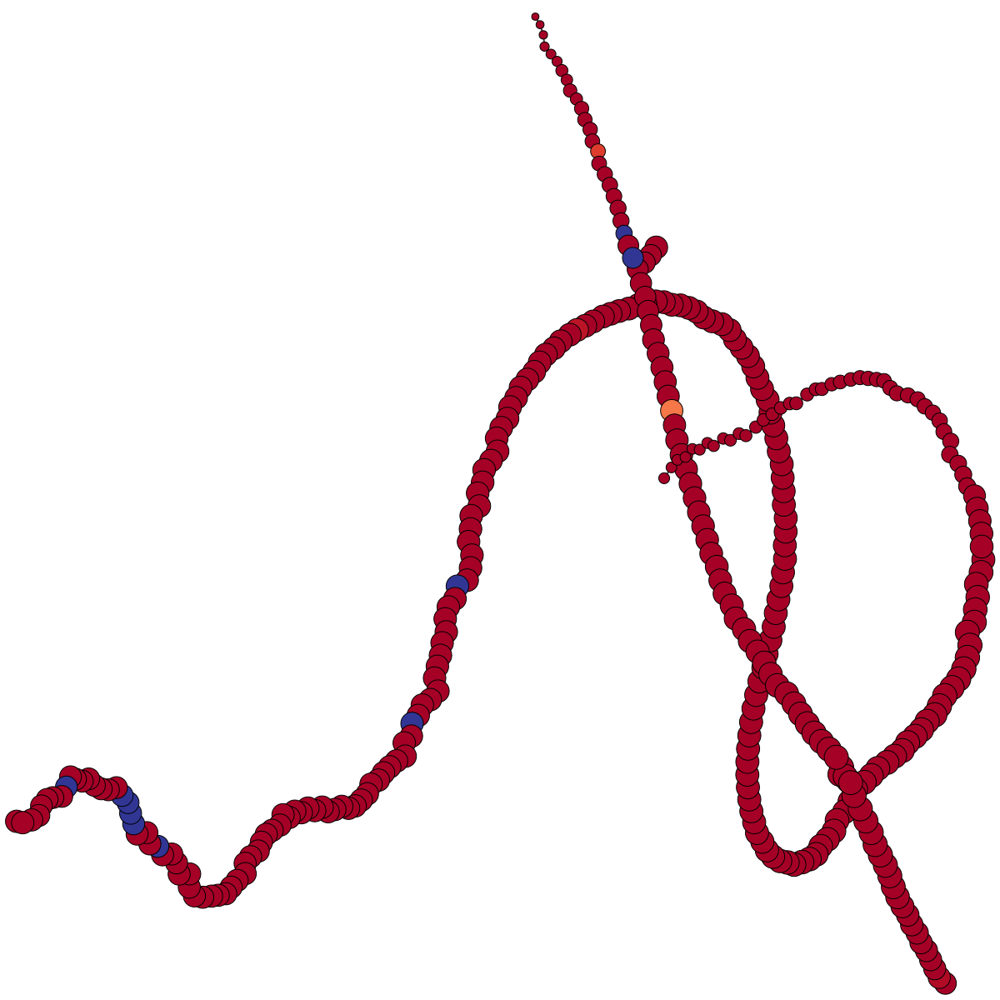

Defa22


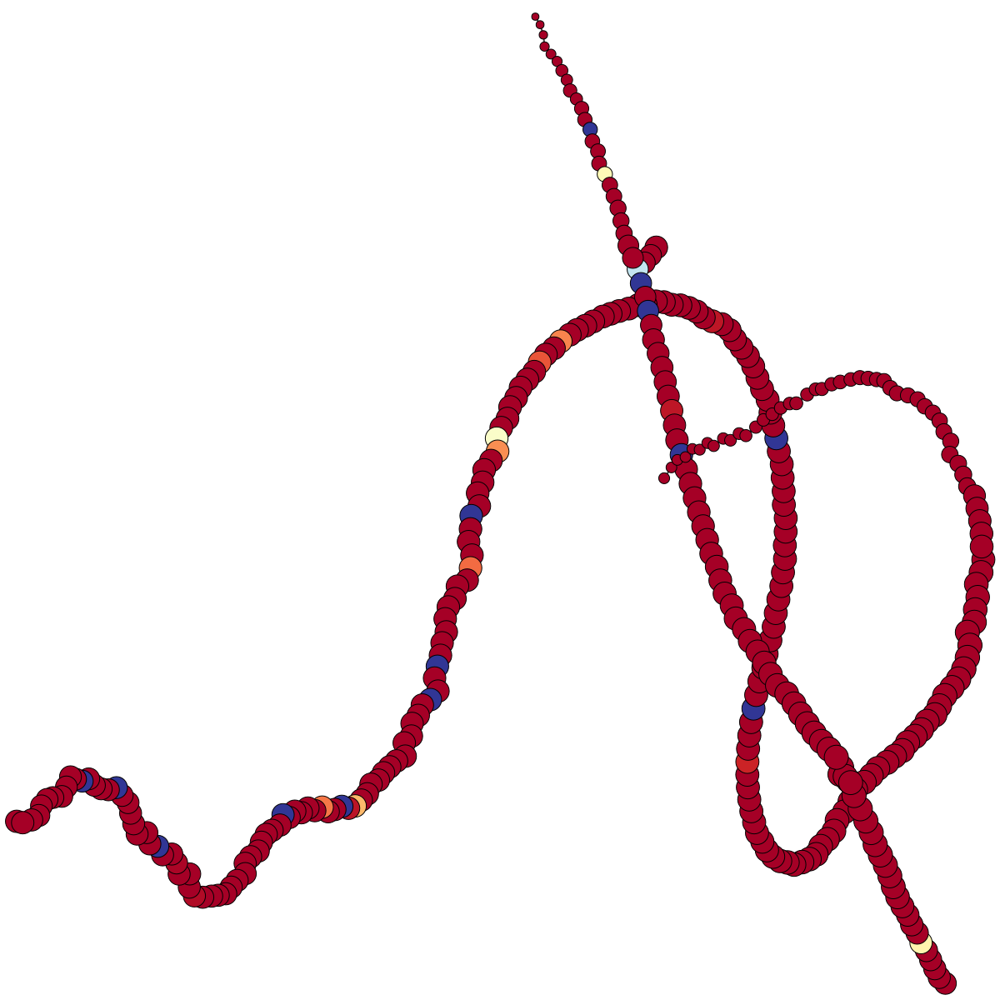

Defa24


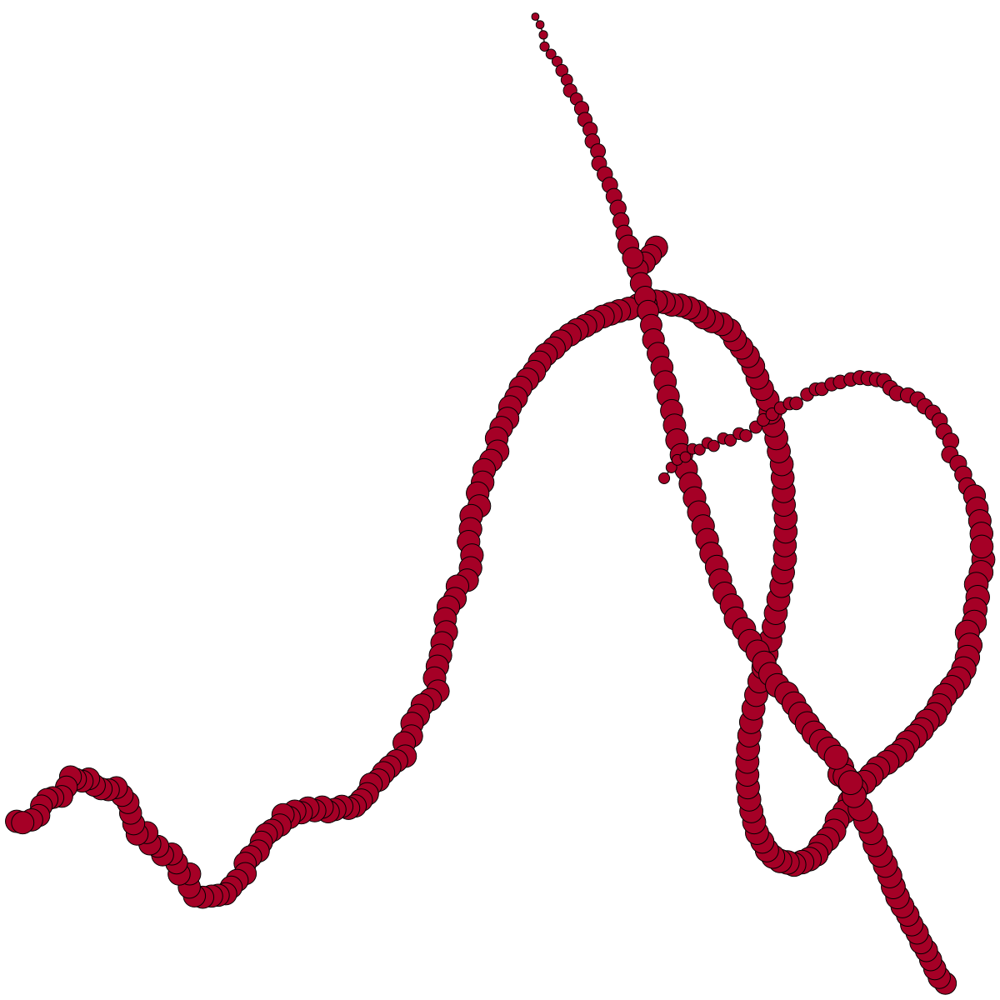

Ang4


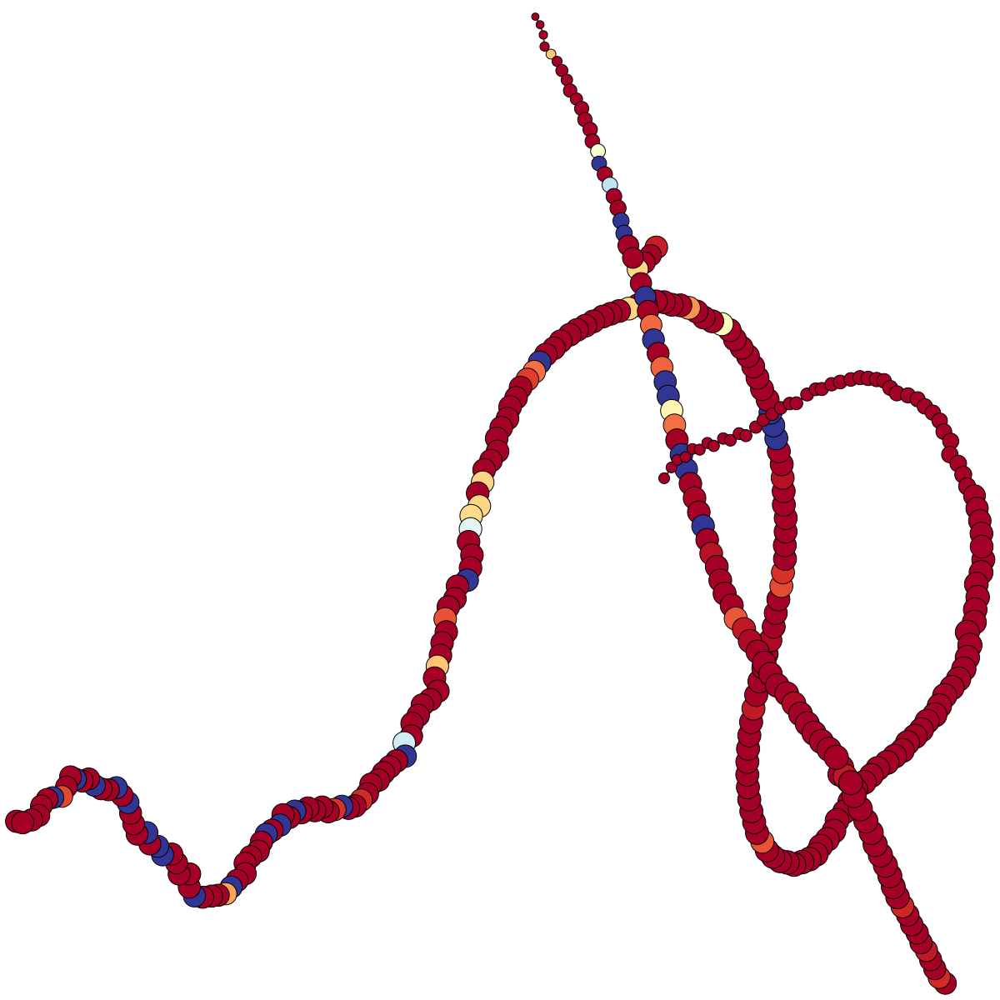

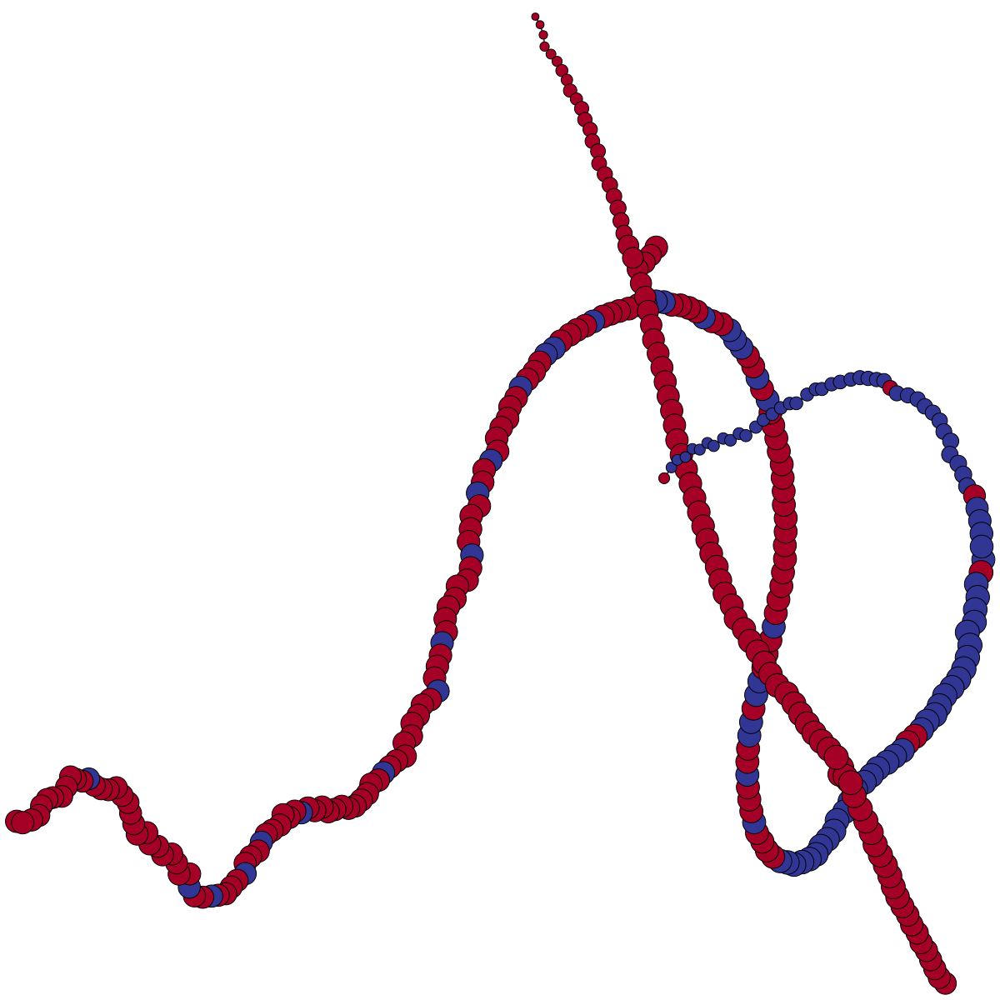

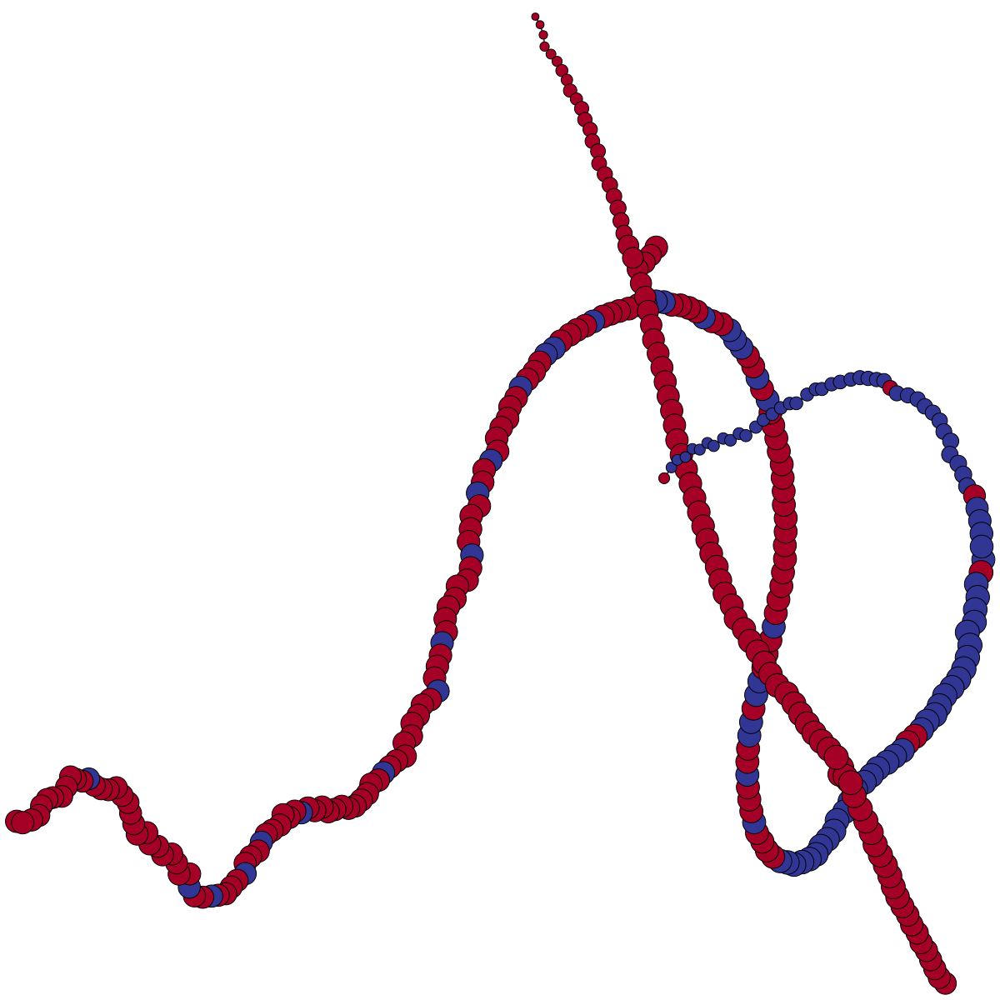

CBCMean                     1.503736
SSC2aMean                   2.046185
SSC2cMean                   2.738930
proliferationMarkersMean    1.692822
TuftCellMarkersMean         3.197393
ECMarkersMean               3.616430
EEMarkersMean               3.533156
GobletCellMarkersMean       5.291188
ImmuneCellMarkersMean       3.379143
PanethCellMarkersMean       5.991710
dtype: float64
C05_Indepth_AAACCTGAGGCCCTCA    0.704213
C05_Indepth_AAACCTGCACTCAGGC    0.100075
C05_Indepth_AAACCTGGTCATCCCT    0.114340
C05_Indepth_AAACCTGGTTACAGAA    0.000000
C05_Indepth_AAACGGGAGAAGAAGC    0.000000
C05_Indepth_AAACGGGAGCAATATG    0.103311
C05_Indepth_AAACGGGCACCCATTC    0.000000
C05_Indepth_AAACGGGCAGGTGGAT    0.000000
C05_Indepth_AAACGGGCATCGATGT    0.000000
C05_Indepth_AAACGGGCATTTCAGG    0.095733
C05_Indepth_AAACGGGGTAATCACC    0.000000
C05_Indepth_AAACGGGGTAGAGTGC    0.000000
C05_Indepth_AAACGGGTCACATAGC    0.697020
C05_Indepth_AAAGATGAGATGTTAG    0.000000
C05_Indepth_AAAGATGAGGGTGTGT    0.000000


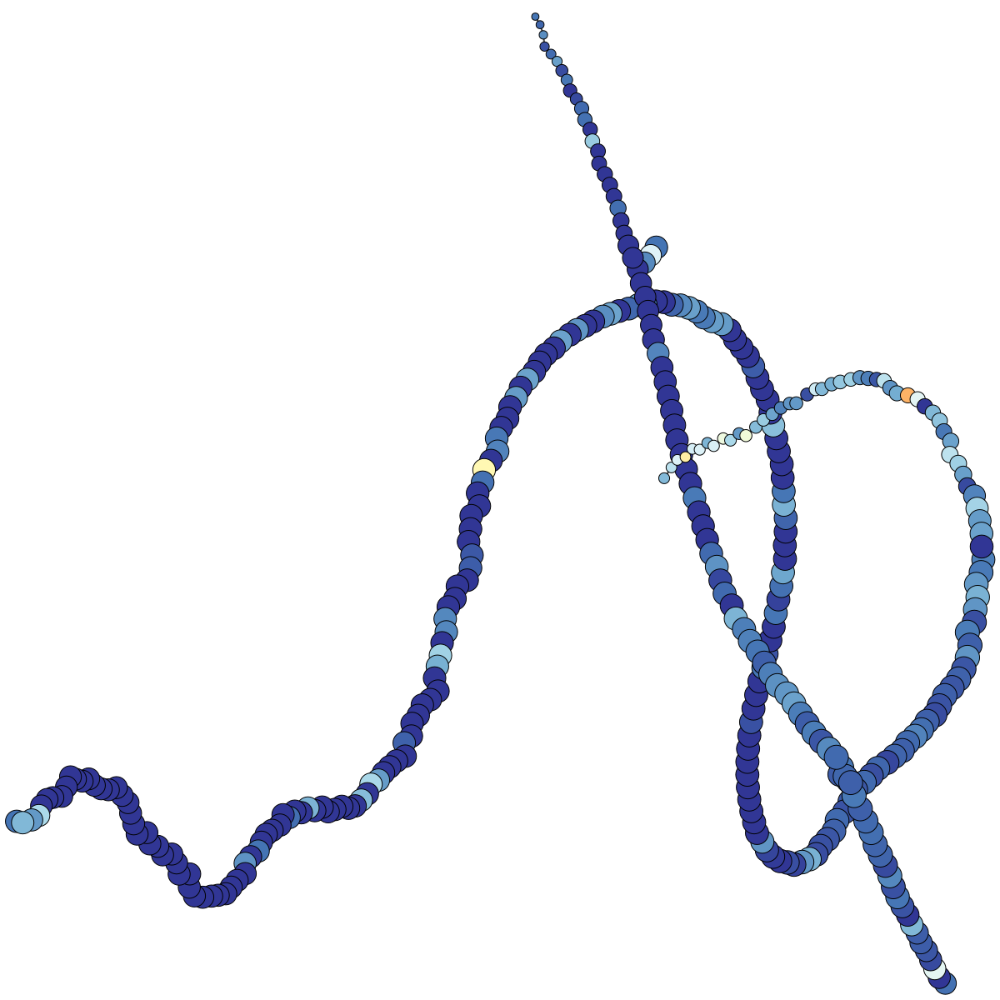

C05_Indepth_AAACCTGAGGCCCTCA    1.113577
C05_Indepth_AAACCTGCACTCAGGC    0.471911
C05_Indepth_AAACCTGGTCATCCCT    0.000000
C05_Indepth_AAACCTGGTTACAGAA    0.000000
C05_Indepth_AAACGGGAGAAGAAGC    0.000000
C05_Indepth_AAACGGGAGCAATATG    0.214031
C05_Indepth_AAACGGGCACCCATTC    0.763519
C05_Indepth_AAACGGGCAGGTGGAT    0.209149
C05_Indepth_AAACGGGCATCGATGT    0.000000
C05_Indepth_AAACGGGCATTTCAGG    0.127513
C05_Indepth_AAACGGGGTAATCACC    0.000000
C05_Indepth_AAACGGGGTAGAGTGC    0.366841
C05_Indepth_AAACGGGTCACATAGC    1.565420
C05_Indepth_AAAGATGAGATGTTAG    0.234676
C05_Indepth_AAAGATGAGGGTGTGT    1.016660
C05_Indepth_AAAGATGCAGGGTTAG    0.913201
C05_Indepth_AAAGATGGTAGGGTAC    0.331670
C05_Indepth_AAAGATGGTCTGCAAT    0.000000
C05_Indepth_AAAGATGTCAGCTCTC    0.000000
C05_Indepth_AAAGATGTCCTTGGTC    0.000000
C05_Indepth_AAAGCAAAGAGGTAGA    0.201251
C05_Indepth_AAAGCAAAGTATTGGA    0.775358
C05_Indepth_AAAGCAACATTACCTT    0.203973
C05_Indepth_AAAGCAAGTCAGGACA    1.166429
C05_Indepth_AAAG

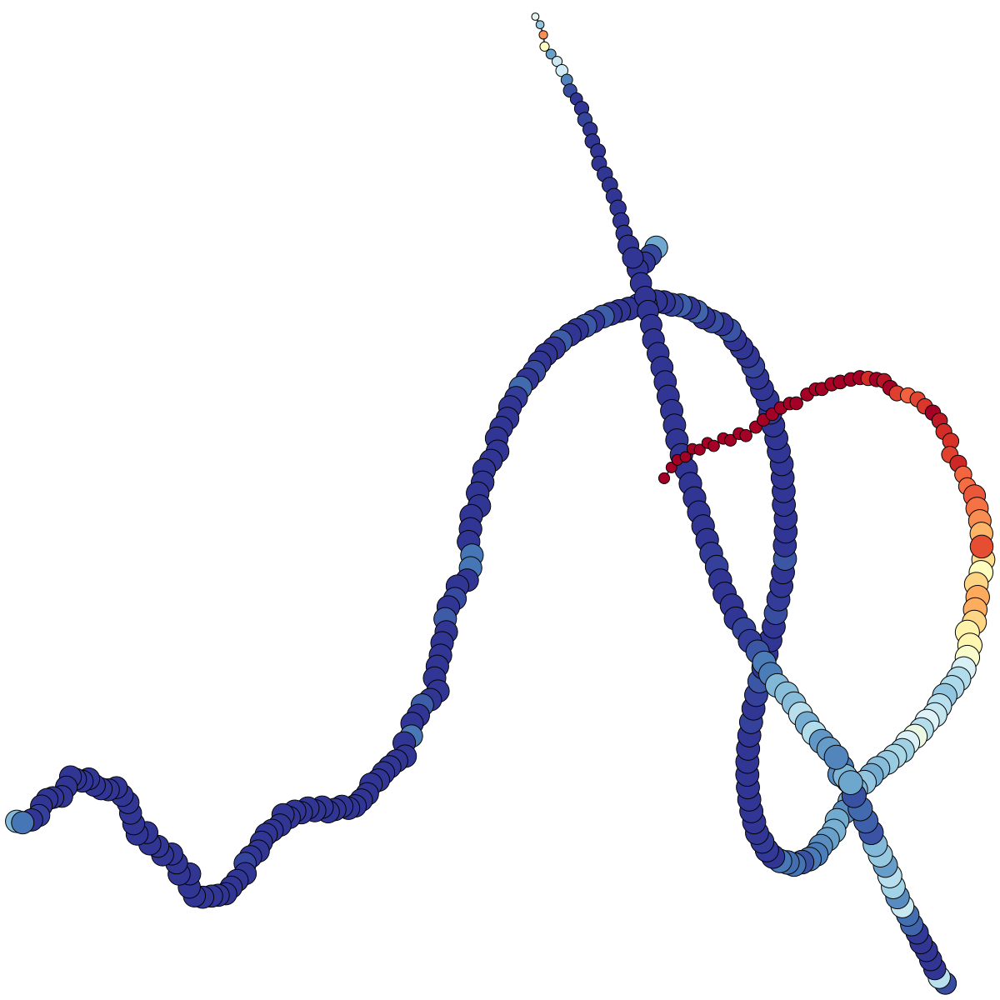

C05_Indepth_AAACCTGAGGCCCTCA    0.125102
C05_Indepth_AAACCTGCACTCAGGC    0.179520
C05_Indepth_AAACCTGGTCATCCCT    0.149489
C05_Indepth_AAACCTGGTTACAGAA    0.091959
C05_Indepth_AAACGGGAGAAGAAGC    0.188278
C05_Indepth_AAACGGGAGCAATATG    0.136548
C05_Indepth_AAACGGGCACCCATTC    0.092437
C05_Indepth_AAACGGGCAGGTGGAT    0.433989
C05_Indepth_AAACGGGCATCGATGT    0.230720
C05_Indepth_AAACGGGCATTTCAGG    0.071800
C05_Indepth_AAACGGGGTAATCACC    0.195425
C05_Indepth_AAACGGGGTAGAGTGC    0.000000
C05_Indepth_AAACGGGTCACATAGC    0.000000
C05_Indepth_AAAGATGAGATGTTAG    0.000000
C05_Indepth_AAAGATGAGGGTGTGT    0.000000
C05_Indepth_AAAGATGCAGGGTTAG    0.168068
C05_Indepth_AAAGATGGTAGGGTAC    0.129967
C05_Indepth_AAAGATGGTCTGCAAT    0.000000
C05_Indepth_AAAGATGTCAGCTCTC    0.000000
C05_Indepth_AAAGATGTCCTTGGTC    0.123799
C05_Indepth_AAAGCAAAGAGGTAGA    0.201251
C05_Indepth_AAAGCAAAGTATTGGA    0.066625
C05_Indepth_AAAGCAACATTACCTT    0.036805
C05_Indepth_AAAGCAAGTCAGGACA    0.000000
C05_Indepth_AAAG

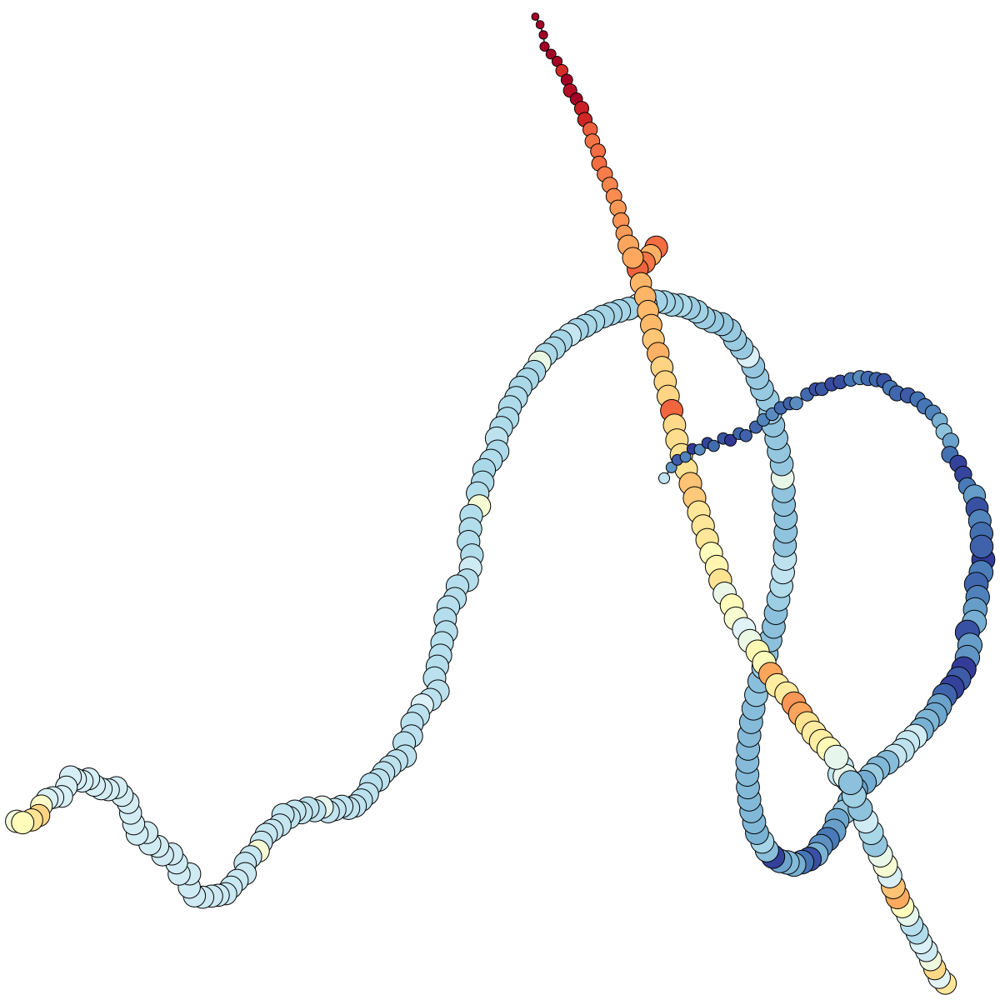

C05_Indepth_AAACCTGAGGCCCTCA    0.769458
C05_Indepth_AAACCTGCACTCAGGC    0.212329
C05_Indepth_AAACCTGGTCATCCCT    0.068604
C05_Indepth_AAACCTGGTTACAGAA    0.347932
C05_Indepth_AAACGGGAGAAGAAGC    0.150622
C05_Indepth_AAACGGGAGCAATATG    0.171225
C05_Indepth_AAACGGGCACCCATTC    0.608129
C05_Indepth_AAACGGGCAGGTGGAT    0.250978
C05_Indepth_AAACGGGCATCGATGT    0.000000
C05_Indepth_AAACGGGCATTTCAGG    0.114880
C05_Indepth_AAACGGGGTAATCACC    0.156340
C05_Indepth_AAACGGGGTAGAGTGC    0.407608
C05_Indepth_AAACGGGTCACATAGC    0.958157
C05_Indepth_AAAGATGAGATGTTAG    0.000000
C05_Indepth_AAAGATGAGGGTGTGT    0.000000
C05_Indepth_AAAGATGCAGGGTTAG    0.672271
C05_Indepth_AAAGATGGTAGGGTAC    0.260827
C05_Indepth_AAAGATGGTCTGCAAT    0.353841
C05_Indepth_AAAGATGTCAGCTCTC    0.000000
C05_Indepth_AAAGATGTCCTTGGTC    0.164979
C05_Indepth_AAAGCAAAGAGGTAGA    0.240516
C05_Indepth_AAAGCAAAGTATTGGA    0.711634
C05_Indepth_AAAGCAACATTACCTT    0.125684
C05_Indepth_AAAGCAAGTCAGGACA    0.000000
C05_Indepth_AAAG

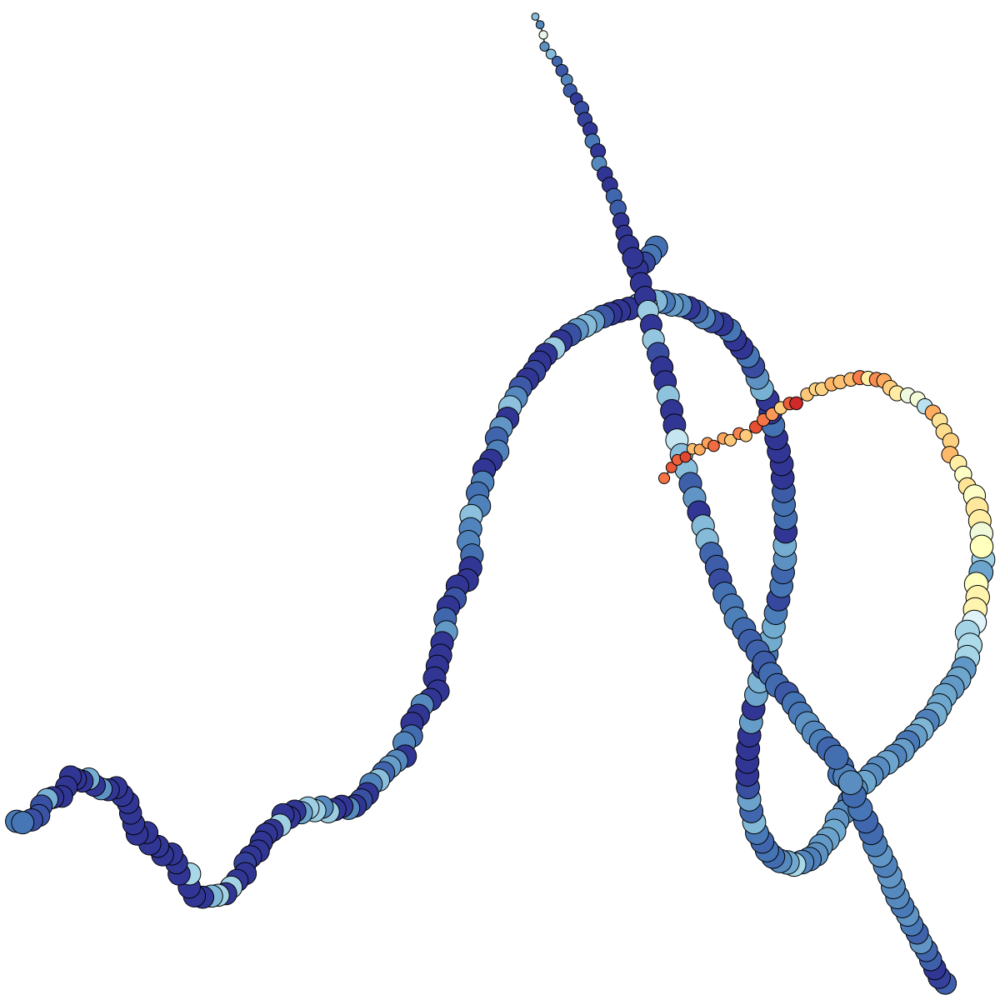

C05_Indepth_AAACCTGAGGCCCTCA    0.000000
C05_Indepth_AAACCTGCACTCAGGC    0.000000
C05_Indepth_AAACCTGGTCATCCCT    0.000000
C05_Indepth_AAACCTGGTTACAGAA    0.000000
C05_Indepth_AAACGGGAGAAGAAGC    0.000000
C05_Indepth_AAACGGGAGCAATATG    0.000000
C05_Indepth_AAACGGGCACCCATTC    0.000000
C05_Indepth_AAACGGGCAGGTGGAT    0.000000
C05_Indepth_AAACGGGCATCGATGT    0.282164
C05_Indepth_AAACGGGCATTTCAGG    0.000000
C05_Indepth_AAACGGGGTAATCACC    0.000000
C05_Indepth_AAACGGGGTAGAGTGC    0.000000
C05_Indepth_AAACGGGTCACATAGC    0.000000
C05_Indepth_AAAGATGAGATGTTAG    0.000000
C05_Indepth_AAAGATGAGGGTGTGT    0.000000
C05_Indepth_AAAGATGCAGGGTTAG    0.000000
C05_Indepth_AAAGATGGTAGGGTAC    0.000000
C05_Indepth_AAAGATGGTCTGCAAT    0.000000
C05_Indepth_AAAGATGTCAGCTCTC    0.000000
C05_Indepth_AAAGATGTCCTTGGTC    0.000000
C05_Indepth_AAAGCAAAGAGGTAGA    0.000000
C05_Indepth_AAAGCAAAGTATTGGA    0.000000
C05_Indepth_AAAGCAACATTACCTT    0.000000
C05_Indepth_AAAGCAAGTCAGGACA    0.000000
C05_Indepth_AAAG

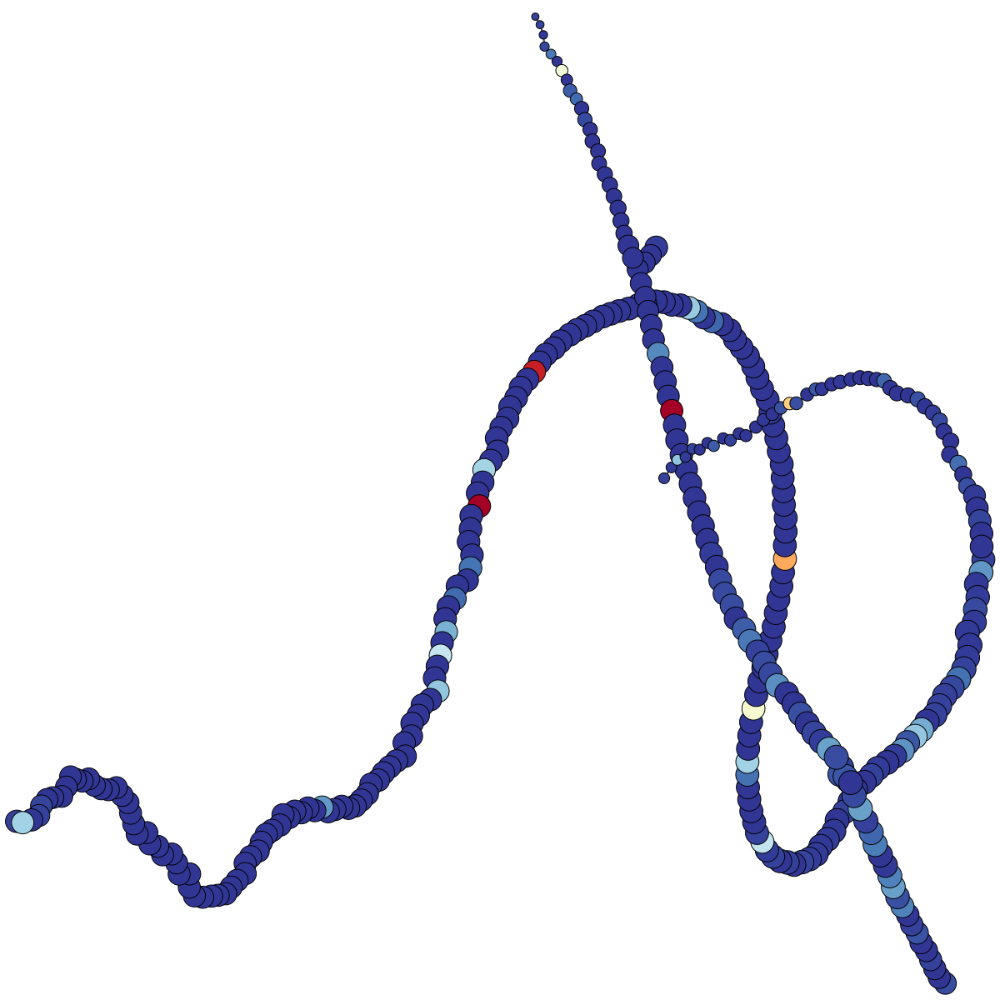

C05_Indepth_AAACCTGAGGCCCTCA    0.910542
C05_Indepth_AAACCTGCACTCAGGC    1.465269
C05_Indepth_AAACCTGGTCATCCCT    2.227462
C05_Indepth_AAACCTGGTTACAGAA    1.919215
C05_Indepth_AAACGGGAGAAGAAGC    0.821512
C05_Indepth_AAACGGGAGCAATATG    3.130475
C05_Indepth_AAACGGGCACCCATTC    0.860390
C05_Indepth_AAACGGGCAGGTGGAT    2.891456
C05_Indepth_AAACGGGCATCGATGT    2.230336
C05_Indepth_AAACGGGCATTTCAGG    0.735474
C05_Indepth_AAACGGGGTAATCACC    2.561106
C05_Indepth_AAACGGGGTAGAGTGC    1.425800
C05_Indepth_AAACGGGTCACATAGC    0.705177
C05_Indepth_AAAGATGAGATGTTAG    0.516085
C05_Indepth_AAAGATGAGGGTGTGT    1.106589
C05_Indepth_AAAGATGCAGGGTTAG    0.952480
C05_Indepth_AAAGATGGTAGGGTAC    1.617982
C05_Indepth_AAAGATGGTCTGCAAT    0.767990
C05_Indepth_AAAGATGTCAGCTCTC    0.653381
C05_Indepth_AAAGATGTCCTTGGTC    1.804894
C05_Indepth_AAAGCAAAGAGGTAGA    0.669627
C05_Indepth_AAAGCAAAGTATTGGA    1.092864
C05_Indepth_AAAGCAACATTACCTT    1.106471
C05_Indepth_AAAGCAAGTCAGGACA    1.693773
C05_Indepth_AAAG

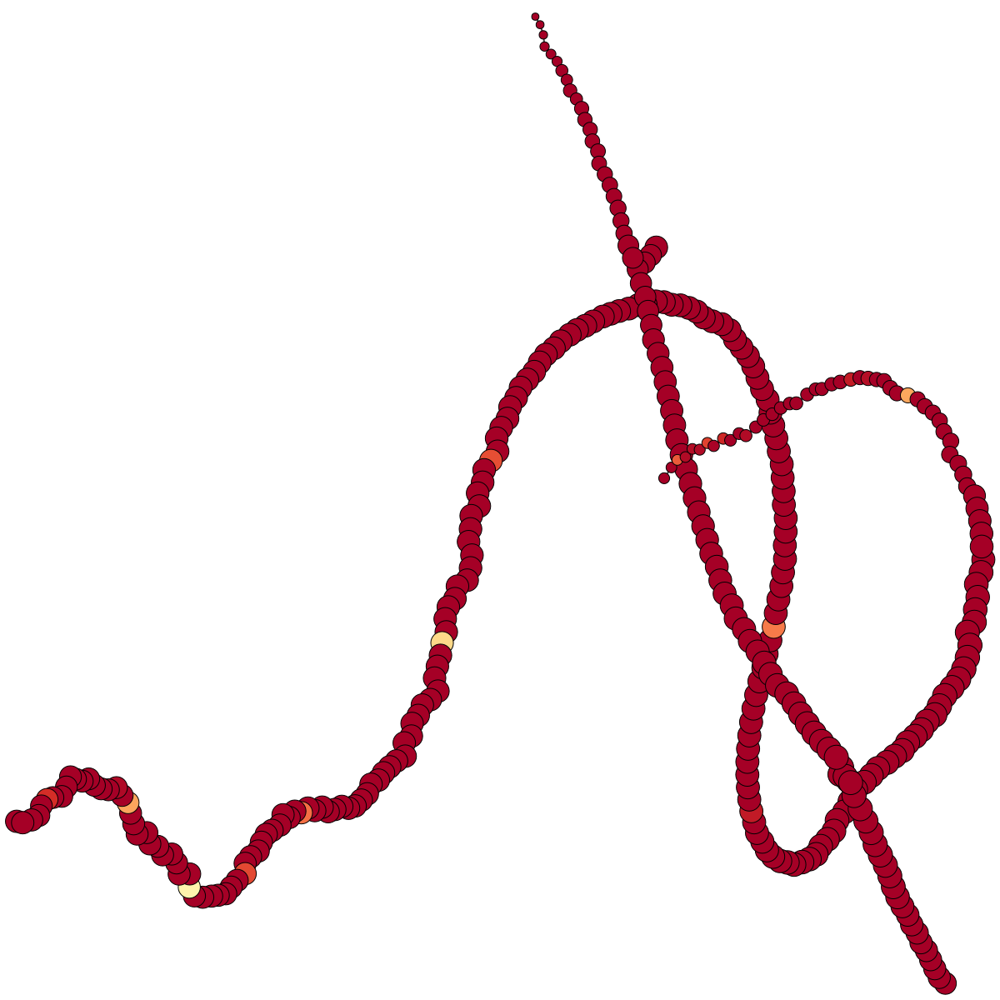

C05_Indepth_AAACCTGAGGCCCTCA    0.071487
C05_Indepth_AAACCTGCACTCAGGC    0.042889
C05_Indepth_AAACCTGGTCATCCCT    0.049003
C05_Indepth_AAACCTGGTTACAGAA    0.000000
C05_Indepth_AAACGGGAGAAGAAGC    0.191073
C05_Indepth_AAACGGGAGCAATATG    0.149585
C05_Indepth_AAACGGGCACCCATTC    0.073350
C05_Indepth_AAACGGGCAGGTGGAT    0.101762
C05_Indepth_AAACGGGCATCGATGT    0.293077
C05_Indepth_AAACGGGCATTTCAGG    0.352840
C05_Indepth_AAACGGGGTAATCACC    0.000000
C05_Indepth_AAACGGGGTAGAGTGC    0.000000
C05_Indepth_AAACGGGTCACATAGC    0.068474
C05_Indepth_AAAGATGAGATGTTAG    0.000000
C05_Indepth_AAAGATGAGGGTGTGT    0.000000
C05_Indepth_AAAGATGCAGGGTTAG    0.096039
C05_Indepth_AAAGATGGTAGGGTAC    0.058511
C05_Indepth_AAAGATGGTCTGCAAT    0.000000
C05_Indepth_AAAGATGTCAGCTCTC    0.000000
C05_Indepth_AAAGATGTCCTTGGTC    0.212227
C05_Indepth_AAAGCAAAGAGGTAGA    0.264269
C05_Indepth_AAAGCAAAGTATTGGA    0.130976
C05_Indepth_AAAGCAACATTACCTT    0.147964
C05_Indepth_AAAGCAAGTCAGGACA    0.000000
C05_Indepth_AAAG

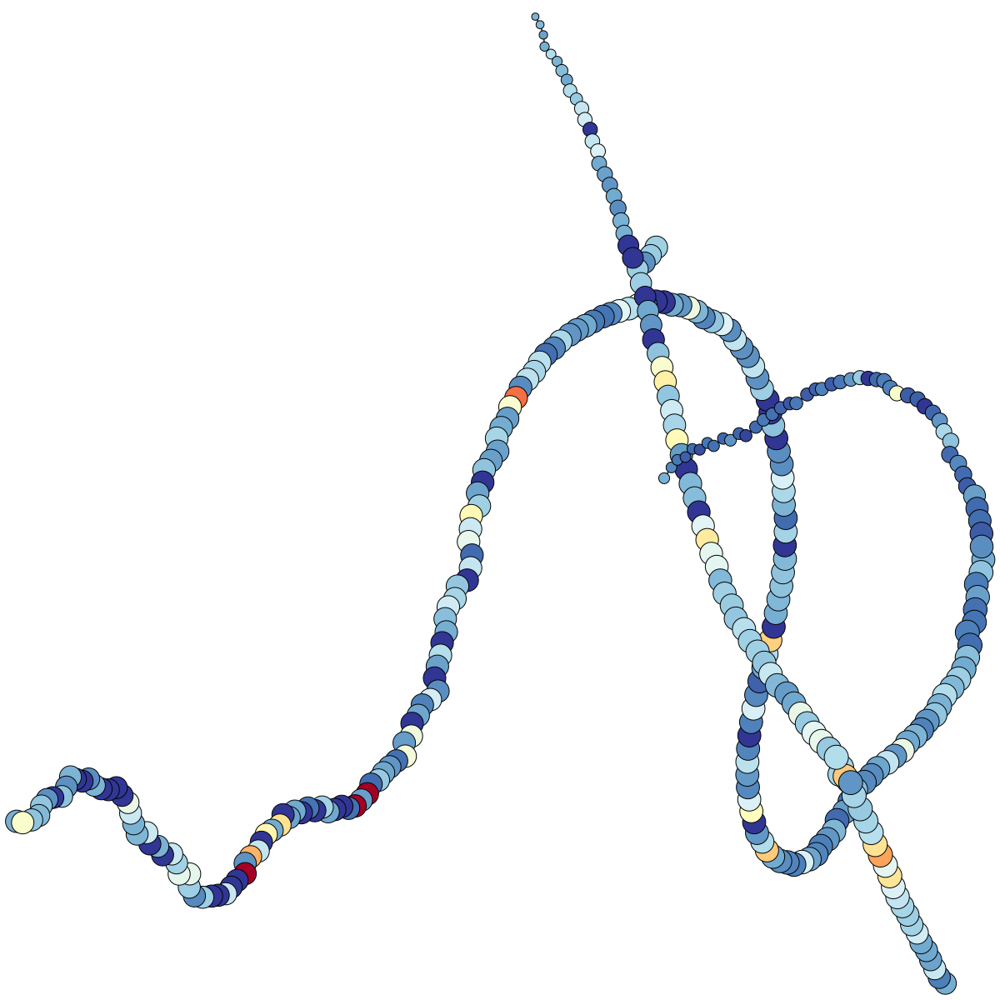

C05_Indepth_AAACCTGAGGCCCTCA    0.891444
C05_Indepth_AAACCTGCACTCAGGC    2.103877
C05_Indepth_AAACCTGGTCATCCCT    1.923206
C05_Indepth_AAACCTGGTTACAGAA    1.605290
C05_Indepth_AAACGGGAGAAGAAGC    3.596417
C05_Indepth_AAACGGGAGCAATATG    1.926512
C05_Indepth_AAACGGGCACCCATTC    2.812876
C05_Indepth_AAACGGGCAGGTGGAT    1.965258
C05_Indepth_AAACGGGCATCGATGT    1.951830
C05_Indepth_AAACGGGCATTTCAGG    3.498667
C05_Indepth_AAACGGGGTAATCACC    1.722190
C05_Indepth_AAACGGGGTAGAGTGC    2.304088
C05_Indepth_AAACGGGTCACATAGC    0.842966
C05_Indepth_AAAGATGAGATGTTAG    1.528707
C05_Indepth_AAAGATGAGGGTGTGT    1.171545
C05_Indepth_AAAGATGCAGGGTTAG    1.172325
C05_Indepth_AAAGATGGTAGGGTAC    1.535850
C05_Indepth_AAAGATGGTCTGCAAT    1.782731
C05_Indepth_AAAGATGTCAGCTCTC    1.742957
C05_Indepth_AAAGATGTCCTTGGTC    1.769574
C05_Indepth_AAAGCAAAGAGGTAGA    3.529784
C05_Indepth_AAAGCAAAGTATTGGA    2.612642
C05_Indepth_AAAGCAACATTACCTT    1.871900
C05_Indepth_AAAGCAAGTCAGGACA    1.217304
C05_Indepth_AAAG

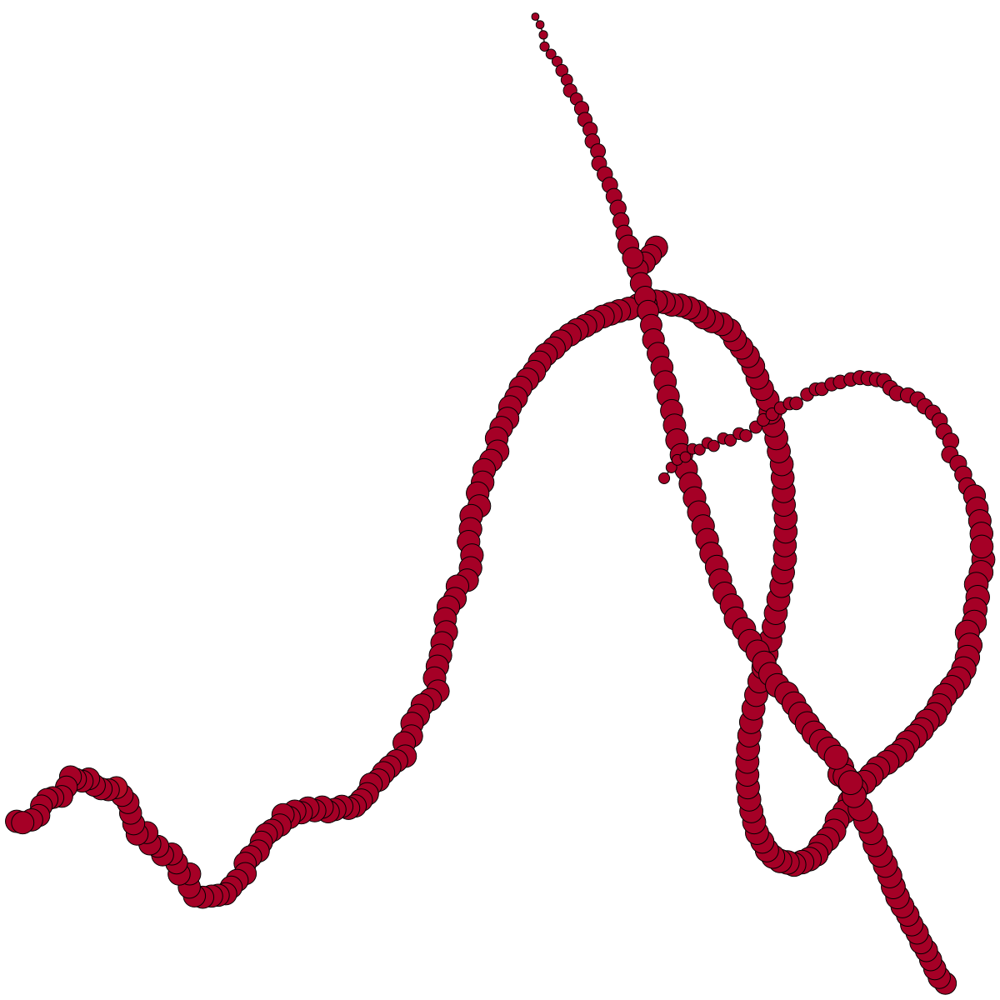

C05_Indepth_AAACCTGAGGCCCTCA    0.000000
C05_Indepth_AAACCTGCACTCAGGC    0.100075
C05_Indepth_AAACCTGGTCATCCCT    0.000000
C05_Indepth_AAACCTGGTTACAGAA    0.000000
C05_Indepth_AAACGGGAGAAGAAGC    0.000000
C05_Indepth_AAACGGGAGCAATATG    0.000000
C05_Indepth_AAACGGGCACCCATTC    0.067289
C05_Indepth_AAACGGGCAGGTGGAT    0.000000
C05_Indepth_AAACGGGCATCGATGT    0.000000
C05_Indepth_AAACGGGCATTTCAGG    0.000000
C05_Indepth_AAACGGGGTAATCACC    0.000000
C05_Indepth_AAACGGGGTAGAGTGC    0.000000
C05_Indepth_AAACGGGTCACATAGC    0.000000
C05_Indepth_AAAGATGAGATGTTAG    0.471411
C05_Indepth_AAAGATGAGGGTGTGT    0.000000
C05_Indepth_AAAGATGCAGGGTTAG    0.000000
C05_Indepth_AAAGATGGTAGGGTAC    0.000000
C05_Indepth_AAAGATGGTCTGCAAT    2.658223
C05_Indepth_AAAGATGTCAGCTCTC    0.000000
C05_Indepth_AAAGATGTCCTTGGTC    0.000000
C05_Indepth_AAAGCAAAGAGGTAGA    0.000000
C05_Indepth_AAAGCAAAGTATTGGA    0.177668
C05_Indepth_AAAGCAACATTACCTT    0.000000
C05_Indepth_AAAGCAAGTCAGGACA    0.000000
C05_Indepth_AAAG

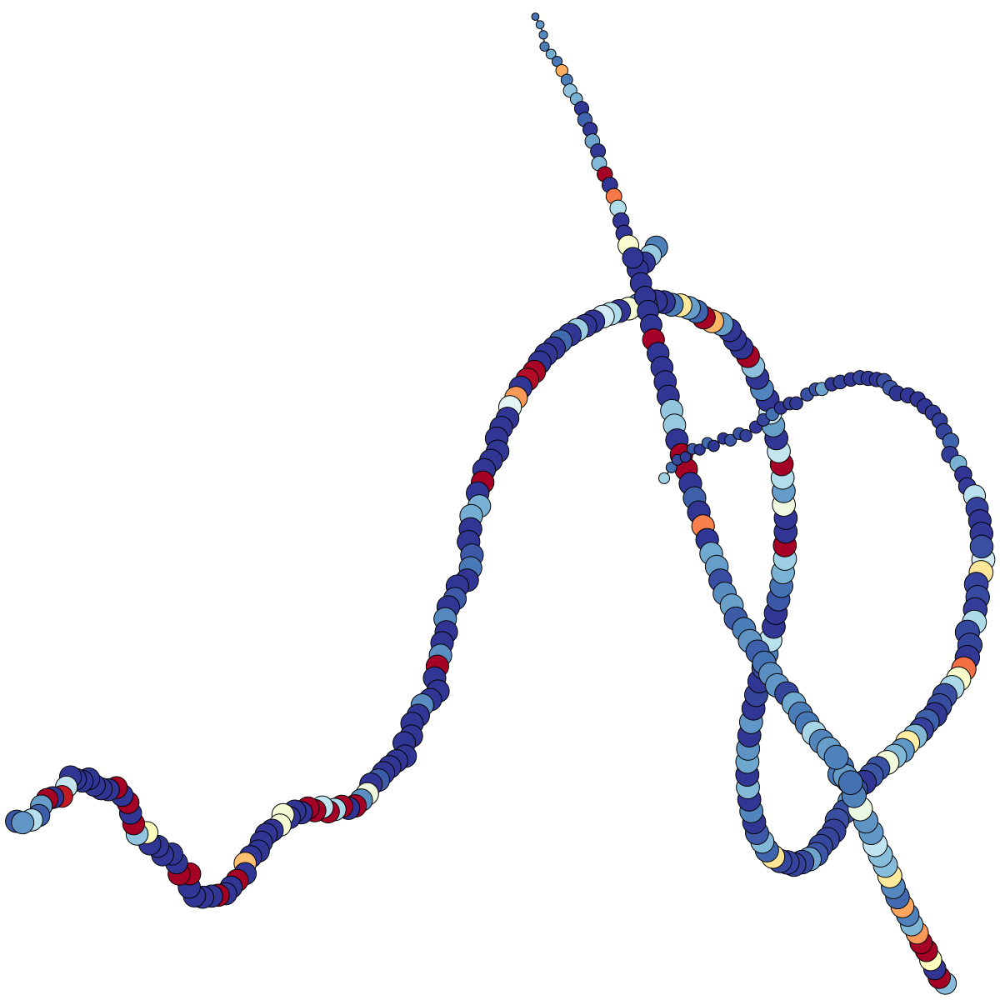

C05_Indepth_AAACCTGAGGCCCTCA    3.122219
C05_Indepth_AAACCTGCACTCAGGC    2.756984
C05_Indepth_AAACCTGGTCATCCCT    2.840853
C05_Indepth_AAACCTGGTTACAGAA    2.802421
C05_Indepth_AAACGGGAGAAGAAGC    2.815795
C05_Indepth_AAACGGGAGCAATATG    2.943194
C05_Indepth_AAACGGGCACCCATTC    3.425024
C05_Indepth_AAACGGGCAGGTGGAT    2.860085
C05_Indepth_AAACGGGCATCGATGT    2.872428
C05_Indepth_AAACGGGCATTTCAGG    2.899171
C05_Indepth_AAACGGGGTAATCACC    2.925517
C05_Indepth_AAACGGGGTAGAGTGC    3.500409
C05_Indepth_AAACGGGTCACATAGC    2.796653
C05_Indepth_AAAGATGAGATGTTAG    2.886042
C05_Indepth_AAAGATGAGGGTGTGT    3.614524
C05_Indepth_AAAGATGCAGGGTTAG    3.009914
C05_Indepth_AAAGATGGTAGGGTAC    2.658006
C05_Indepth_AAAGATGGTCTGCAAT    3.361385
C05_Indepth_AAAGATGTCAGCTCTC    5.834866
C05_Indepth_AAAGATGTCCTTGGTC    2.981552
C05_Indepth_AAAGCAAAGAGGTAGA    3.449094
C05_Indepth_AAAGCAAAGTATTGGA    3.065674
C05_Indepth_AAAGCAACATTACCTT    5.061834
C05_Indepth_AAAGCAAGTCAGGACA    3.658776
C05_Indepth_AAAG

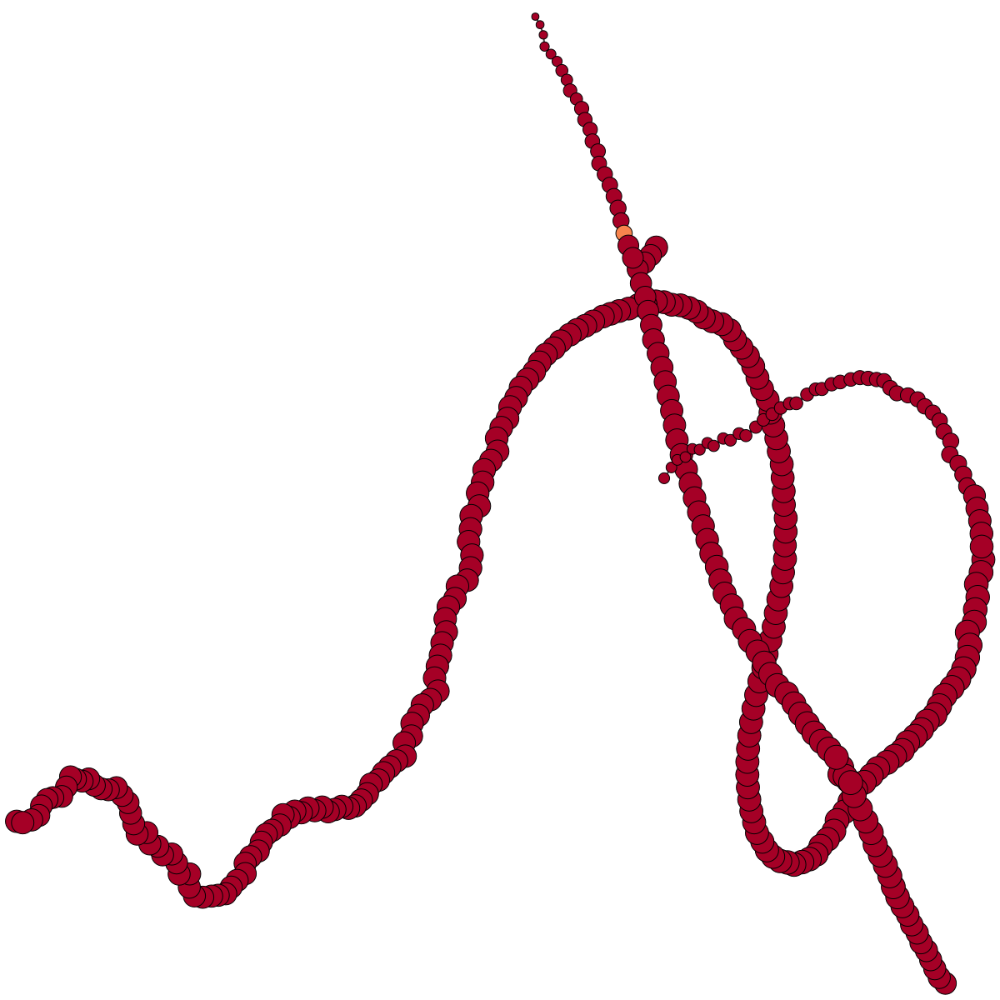

In [39]:
for i in range(0,len(listOfMarkersToVisualize)):
    print listOfMarkersToVisualize[i] 
    analysis.plot_save_graph( seed=seed, overlay=fullData[listOfMarkersToVisualize[i]], file_out=listOfMarkersToVisualize[i], upper_range=maxValues[listOfMarkersToVisualize[i]])

#analysis.plot_save_graph( seed=seed, overlay=data_raw["Clu"], file_out="Clu", upper_range=lineageMarkersData_maxValues["Clu"][0])

cellNames = fullData.axes[0].tolist()
sourceDataSet = []

for i in range(0,len(cellNames)):
    if('C05' in cellNames[i]):
        sourceDataSet.append(0)
    else:
        sourceDataSet.append(1)

fullData['DataSource'] = sourceDataSet

analysis.plot_save_graph( seed=seed, overlay= fullData['DataSource'] , file_out="DataSource", upper_range=2)

cellNames = fullData.axes[0].tolist()
sourceDataSet = []

for i in range(0,len(cellNames)):
    if('C05' in cellNames[i]):
        sourceDataSet.append(0)
    else:
        sourceDataSet.append(1)

fullData['DataSource'] = sourceDataSet

analysis.plot_save_graph( seed=seed, overlay= fullData['DataSource'] , file_out="DataSource", upper_range=2)


fullData['CBCMean'] = fullData[CBC].mean(axis=1)
fullData['SSC2aMean'] = fullData[SSC2a].mean(axis=1)
fullData['SSC2cMean'] = fullData[SSC2c].mean(axis=1)
fullData['proliferationMarkersMean'] = fullData[proliferationMarkers].mean(axis=1)
fullData['TuftCellMarkersMean'] = fullData[TuftCellMarkers].mean(axis=1)
fullData['ECMarkersMean'] = fullData[ECMarkers].mean(axis=1)
fullData['EEMarkersMean'] = fullData[EEMarkers].mean(axis=1)
fullData['GobletCellMarkersMean'] = fullData[GobletCellMarkers].mean(axis=1)
fullData['ImmuneCellMarkersMean'] = fullData[ImmuneCellMarkers].mean(axis=1)
fullData['PanethCellMarkersMean'] = fullData[PanethCellMarkers].mean(axis=1)

additionalFieldsToPlot = list(['CBCMean','SSC2aMean','SSC2cMean','proliferationMarkersMean','TuftCellMarkersMean','ECMarkersMean','EEMarkersMean','GobletCellMarkersMean','ImmuneCellMarkersMean','PanethCellMarkersMean'])

additionalFieldsToPlot_maxValues = fullData[additionalFieldsToPlot].max()

print additionalFieldsToPlot_maxValues

#print fullData[additionalFieldsToPlot[1]]

for i in range(0,len(additionalFieldsToPlot)):
    print fullData[additionalFieldsToPlot[i] ]
    analysis.plot_save_graph( seed=seed, overlay=fullData[additionalFieldsToPlot[i]], file_out=additionalFieldsToPlot[i], upper_range=additionalFieldsToPlot_maxValues[i])


Analyte dynamics can be viewed using the function below. A "root" node will have to be supplied, all possible trajectories will be shown with the given overlay. Red vertical dotted lines indicate a branch point and the black dotted vertical lines the end of the trajectory. The solid black lines for each bar indicated the standard error for all the cells assigned to that node (cells are assigned to the node closest to them). The root id is best found using the id overlay on the graph plots, the png file in the output directory is likely more readable. 

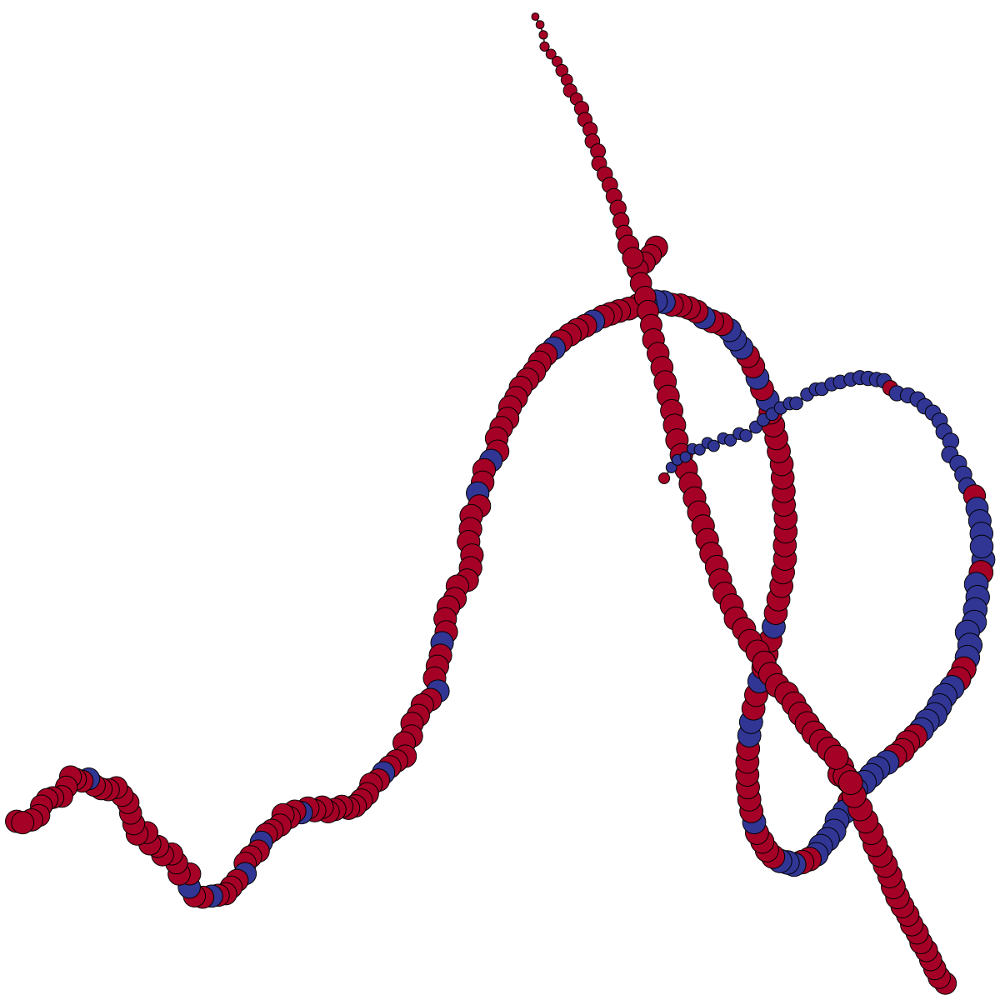

In [45]:
analysis.plot_save_graph( seed=seed, overlay= fullData['DataSource'] , file_out="DataSource1", upper_range=1.5)

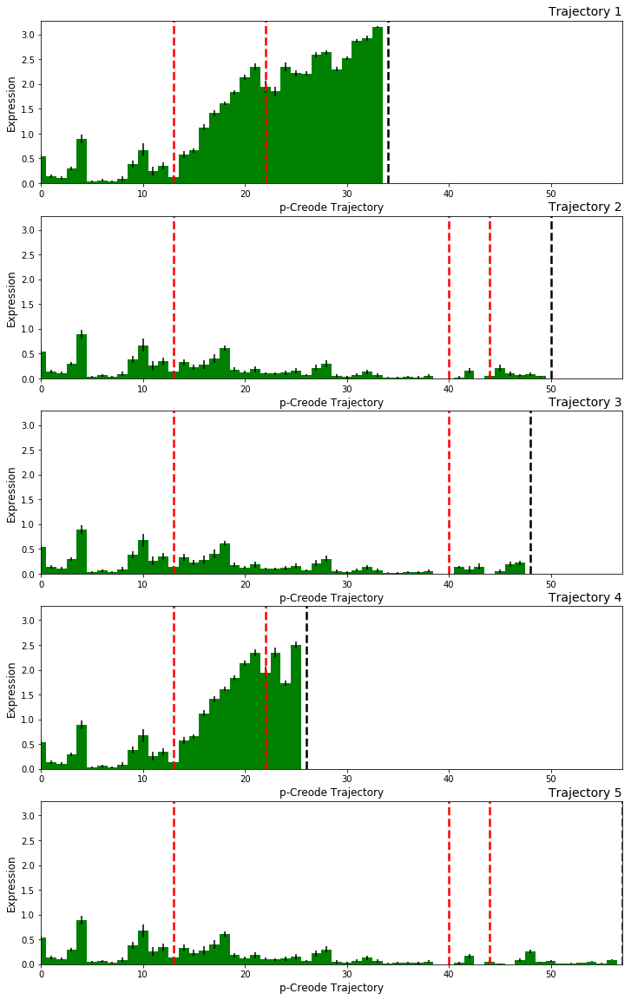

In [39]:
analysis.plot_analyte_dynamics( data_raw.ELANE, 2)

To produce a csv files for export containing all analyte dynamics for each trajectory use the function call below. A csv file for each trajectory will be created, trajectory labels are the same as above. To produce the graph overlays and trajectory analysis all of the cells that are over the noise threshold are binned into one of the selected graph nodes. This function call will also produce a file containing the id to which each cell was binned.  

In [40]:
analysis.get_complete_analyte_gene_trajectories( data_raw, 0, file_out='Myeloid')

If you would like to escape the limitations of python graph plotting you can export an weighted adjacency matrix, which then can be up loaded into more capable graphing softwares like Cytoscape.

In [41]:
w_adj = pcreode.return_weighted_adj( pca_reduced_data, file_path, gid)
w_adj

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       ..., 
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.32238406,  0.        ],
       [ 0.        ,  0.        ,  0.        , ...,  0.32238406,
         0.        ,  0.24271041],
       [ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.24271041,  0.        ]])